In [1]:
from nais.utils import remove_bad_data
import xarray as xr

ds = xr.open_dataset("nais1_dataset.nc")
bad_data = xr.open_dataset("bad_data_bounds.nc")
ds = remove_bad_data(ds, bad_data)

In [2]:
nais_neg_particles = ds['neg_particles'].to_dataframe(name='particles').reset_index()
# Unstack the particles dimension to get a DataFrame with the diameter as columns
nais_neg_particles = nais_neg_particles.pivot(index='time', columns='diameter', values='particles')
nais_neg_particles

diameter,8.028800e-10,8.628290e-10,9.272542e-10,9.961534e-10,1.070172e-09,1.151195e-09,1.238353e-09,1.330049e-09,1.428535e-09,1.535309e-09,...,2.107146e-08,2.268812e-08,2.445574e-08,2.636108e-08,2.841614e-08,3.063141e-08,3.302483e-08,3.560527e-08,3.846420e-08,4.155270e-08
time,,,,,,,,,,,,,,,,,,,,,
2024-05-16 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-05-16 01:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-05-16 02:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-05-16 03:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-05-16 04:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-01-31 20:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,7111.716271,7063.175414,7538.080976,8105.891840,9335.216368,10340.677370,11045.137168,12222.105903,13158.525265,12911.941554
2025-01-31 21:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,7931.142843,8652.730892,9295.240089,10165.089125,10611.293013,11722.040817,13899.046401,14942.069770,15789.330660,16452.033834
2025-01-31 22:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,8423.291308,9290.343052,10278.636401,11920.660170,13652.256835,15574.435920,16891.553881,17754.622760,17242.439849,16103.098674


In [3]:
import numpy as np
nais_neg_particles = nais_neg_particles.mask(nais_neg_particles < 0, np.nan)  # Replace negative values with NaN

In [4]:
import aerosol.functions as af

In [5]:
# Convert from normalized number concentrations to unnormalized number concentrations.
dN = af.dndlogdp2dn(nais_neg_particles)
dN

diameter,8.028800e-10,8.628290e-10,9.272542e-10,9.961534e-10,1.070172e-09,1.151195e-09,1.238353e-09,1.330049e-09,1.428535e-09,1.535309e-09,...,2.107146e-08,2.268812e-08,2.445574e-08,2.636108e-08,2.841614e-08,3.063141e-08,3.302483e-08,3.560527e-08,3.846420e-08,4.155270e-08
time,,,,,,,,,,,,,,,,,,,,,
2024-05-16 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-05-16 01:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-05-16 02:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-05-16 03:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-05-16 04:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-01-31 20:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,228.314513,228.445493,245.608358,264.188224,304.345799,337.496519,360.884549,404.650143,441.369759,433.098726
2025-01-31 21:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,254.621380,279.856758,302.860723,331.301835,345.948324,382.581124,454.132078,494.702853,529.613534,551.842251
2025-01-31 22:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,270.421313,300.479158,334.902082,388.519622,445.089525,508.314661,551.908112,587.821010,578.354440,540.138095


In [6]:
import pandas as pd
result = pd.DataFrame({
    'max_diameter': dN.idxmax(axis=1),
    'max_concentration': dN.max(axis=1)
})
result


/tmp/ipykernel_39352/3978908360.py:3: FutureWarning: The behavior of DataFrame.idxmax with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  'max_diameter': dN.idxmax(axis=1),


,max_diameter,max_concentration
time,,
2024-05-16 00:00:00,NaN,NaN
2024-05-16 01:00:00,NaN,NaN
2024-05-16 02:00:00,NaN,NaN
2024-05-16 03:00:00,NaN,NaN
2024-05-16 04:00:00,NaN,NaN
...,...,...
2025-01-31 20:00:00,3.931458e-09,1240.970564
2025-01-31 21:00:00,3.931458e-09,914.459018
2025-01-31 22:00:00,3.931458e-09,1128.211029


In [7]:
# Ensure max_diameter is numeric
result['max_diameter_numeric'] = pd.to_numeric(result['max_diameter'], errors='coerce')

# Define a function to check if any increase occurs during the day
def has_any_increase(series):
    return (series.diff() > 0).any()

# Group by day and apply the function
daily_increases = result.groupby(result.index.date)['max_diameter_numeric'].apply(has_any_increase)

daily_increases


2024-05-16    False
2024-05-17     True
2024-05-18     True
2024-05-19     True
2024-05-20     True
              ...  
2025-01-28     True
2025-01-29     True
2025-01-30     True
2025-01-31     True
2025-02-01    False
Name: max_diameter_numeric, Length: 262, dtype: bool

In [8]:
def has_consecutive_increases(series, min_consecutive=2):
    # Compute the difference between consecutive time steps
    diffs = series.diff()
    count = 0
    for diff in diffs:
        if diff > 0:
            count += 1
            if count >= min_consecutive:
                return True
        else:
            count = 0
    return False

daily_consecutive_increases = result.groupby(result.index.date)['max_diameter_numeric'].apply(has_consecutive_increases)

daily_consecutive_increases


2024-05-16    False
2024-05-17     True
2024-05-18     True
2024-05-19     True
2024-05-20    False
              ...  
2025-01-28     True
2025-01-29     True
2025-01-30     True
2025-01-31     True
2025-02-01    False
Name: max_diameter_numeric, Length: 262, dtype: bool

In [9]:
# List to hold the results for each increasing period
periods = []

# Group by day using a daily frequency
for day, group in result.groupby(pd.Grouper(freq='D')):
    # Sort the group by time
    group = group.sort_index()
    s = group['max_diameter_numeric']
    run_start = None  # Mark the start of an increasing period
    
    # Loop over the series, starting at the second element
    for i in range(1, len(s)):
        if s.iloc[i] > s.iloc[i-1]:
            # When an increase is detected and no run is active, mark the start
            if run_start is None:
                run_start = s.index[i-1]
        else:
            # When the increase stops, record the period if a run was active
            if run_start is not None:
                run_end = s.index[i-1]
                duration_hours = (run_end - run_start).total_seconds() / 3600.0
                periods.append({
                    "day": day.date(),
                    "start_time": run_start,
                    "end_time": run_end,
                    "start_diameter": s.loc[run_start],
                    "end_diameter": s.loc[run_end],
                    "duration_hours": duration_hours
                })
                run_start = None  # Reset for the next period

    # If the day ends while an increasing period is still active, record it
    if run_start is not None:
        run_end = s.index[-1]
        duration_hours = (run_end - run_start).total_seconds() / 3600.0
        periods.append({
            "day": day.date(),
            "start_time": run_start,
            "end_time": run_end,
            "start_diameter": s.loc[run_start],
            "end_diameter": s.loc[run_end],
            "duration_hours": duration_hours
        })

# Create a new DataFrame with the identified periods
increasing_periods = pd.DataFrame(periods)
increasing_periods

,day,start_time,end_time,start_diameter,end_diameter,duration_hours
0,2024-05-17,2024-05-17 09:00:00,2024-05-17 10:00:00,1.906892e-09,1.259131e-08,1.0
1,2024-05-17,2024-05-17 12:00:00,2024-05-17 13:00:00,1.906892e-09,8.115174e-09,1.0
2,2024-05-17,2024-05-17 14:00:00,2024-05-17 15:00:00,1.906892e-09,7.542927e-09,1.0
3,2024-05-17,2024-05-17 16:00:00,2024-05-17 18:00:00,1.906892e-09,9.388119e-09,2.0
4,2024-05-18,2024-05-18 00:00:00,2024-05-18 01:00:00,1.259131e-08,1.817175e-08,1.0
...,...,...,...,...,...,...
1421,2025-01-31,2025-01-31 01:00:00,2025-01-31 02:00:00,6.521920e-09,8.728472e-09,1.0
1422,2025-01-31,2025-01-31 03:00:00,2025-01-31 09:00:00,4.223857e-09,3.560527e-08,6.0
1423,2025-01-31,2025-01-31 13:00:00,2025-01-31 14:00:00,3.653771e-09,3.931458e-09,1.0
1424,2025-01-31,2025-01-31 18:00:00,2025-01-31 19:00:00,3.931458e-09,4.223857e-09,1.0


In [10]:
# Filter to include only those days where the increase period lasted more than 3 hours
filtered_periods = increasing_periods[increasing_periods['duration_hours'] >= 3]
filtered_periods

,day,start_time,end_time,start_diameter,end_diameter,duration_hours
5,2024-05-18,2024-05-18 06:00:00,2024-05-18 09:00:00,3.653771e-09,1.817175e-08,3.0
6,2024-05-18,2024-05-18 10:00:00,2024-05-18 13:00:00,6.521920e-09,3.302483e-08,3.0
7,2024-05-18,2024-05-18 18:00:00,2024-05-18 21:00:00,8.728472e-09,4.155270e-08,3.0
39,2024-05-27,2024-05-27 08:00:00,2024-05-27 11:00:00,1.773835e-09,2.107146e-08,3.0
56,2024-05-31,2024-05-31 11:00:00,2024-05-31 14:00:00,8.115174e-09,2.841614e-08,3.0
...,...,...,...,...,...,...
1357,2025-01-20,2025-01-20 03:00:00,2025-01-20 06:00:00,1.773835e-09,2.268812e-08,3.0
1370,2025-01-22,2025-01-22 18:00:00,2025-01-22 21:00:00,3.931458e-09,4.155270e-08,3.0
1380,2025-01-24,2025-01-24 05:00:00,2025-01-24 08:00:00,7.542927e-09,2.268812e-08,3.0
1413,2025-01-29,2025-01-29 04:00:00,2025-01-29 09:00:00,3.931458e-09,2.268812e-08,5.0


In [ ]:
filtered_periods.unique()     #136 days with an increase period lasting more than 3 hoursfiltered_periods['day']

array([datetime.date(2024, 5, 18), datetime.date(2024, 5, 27),
       datetime.date(2024, 5, 31), datetime.date(2024, 6, 1),
       datetime.date(2024, 6, 2), datetime.date(2024, 6, 5),
       datetime.date(2024, 6, 8), datetime.date(2024, 6, 11),
       datetime.date(2024, 6, 16), datetime.date(2024, 6, 17),
       datetime.date(2024, 6, 19), datetime.date(2024, 6, 20),
       datetime.date(2024, 6, 22), datetime.date(2024, 6, 27),
       datetime.date(2024, 6, 28), datetime.date(2024, 7, 1),
       datetime.date(2024, 7, 2), datetime.date(2024, 7, 3),
       datetime.date(2024, 7, 4), datetime.date(2024, 7, 5),
       datetime.date(2024, 7, 9), datetime.date(2024, 7, 10),
       datetime.date(2024, 7, 11), datetime.date(2024, 7, 12),
       datetime.date(2024, 7, 13), datetime.date(2024, 7, 14),
       datetime.date(2024, 7, 15), datetime.date(2024, 7, 16),
       datetime.date(2024, 7, 18), datetime.date(2024, 7, 20),
       datetime.date(2024, 7, 21), datetime.date(2024, 7, 22),
  

In [23]:
# Extract the unique days from nais_neg_particles
unique_days_nais = nais_neg_particles.index.normalize().unique()

# Extract the unique days from filtered_periods and convert to datetime64
unique_days_filtered = pd.to_datetime(filtered_periods['day']).unique()

# Find the intersection of the two sets of dates
common_days = np.intersect1d(unique_days_nais, unique_days_filtered)

common_days

array(['2024-05-18T00:00:00.000000000', '2024-05-27T00:00:00.000000000',
       '2024-05-31T00:00:00.000000000', '2024-06-01T00:00:00.000000000',
       '2024-06-02T00:00:00.000000000', '2024-06-05T00:00:00.000000000',
       '2024-06-08T00:00:00.000000000', '2024-06-11T00:00:00.000000000',
       '2024-06-16T00:00:00.000000000', '2024-06-17T00:00:00.000000000',
       '2024-06-19T00:00:00.000000000', '2024-06-20T00:00:00.000000000',
       '2024-06-22T00:00:00.000000000', '2024-06-27T00:00:00.000000000',
       '2024-06-28T00:00:00.000000000', '2024-07-01T00:00:00.000000000',
       '2024-07-02T00:00:00.000000000', '2024-07-03T00:00:00.000000000',
       '2024-07-04T00:00:00.000000000', '2024-07-05T00:00:00.000000000',
       '2024-07-09T00:00:00.000000000', '2024-07-10T00:00:00.000000000',
       '2024-07-11T00:00:00.000000000', '2024-07-12T00:00:00.000000000',
       '2024-07-13T00:00:00.000000000', '2024-07-14T00:00:00.000000000',
       '2024-07-15T00:00:00.000000000', '2024-07-16

In [26]:
common_days = pd.to_datetime(common_days).normalize()
common_days

DatetimeIndex(['2024-05-18', '2024-05-27', '2024-05-31', '2024-06-01',
               '2024-06-02', '2024-06-05', '2024-06-08', '2024-06-11',
               '2024-06-16', '2024-06-17',
               ...
               '2025-01-13', '2025-01-14', '2025-01-15', '2025-01-17',
               '2025-01-19', '2025-01-20', '2025-01-22', '2025-01-24',
               '2025-01-29', '2025-01-31'],
              dtype='datetime64[ns]', length=136, freq=None)

In [52]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

def plot_spectral_data(spectral_df, max_df, title, ax):
    """
    Plot spectral data as a contour plot with a logarithmic color scale,
    and overlay the time series of max diameters.

    Parameters:
        spectral_df (pd.DataFrame): Original spectral data with a datetime index
            and columns as diameters (values = concentration).
        max_df (pd.DataFrame): DataFrame with a datetime index and a 'max_diameter'
            column indicating the diameter with the highest concentration at each timestep.
        title (str): Title for the plot.
        ax (matplotlib.axes.Axes): The axis on which to plot.
    """
    # Set up logarithmic normalization for the color scale
    log_norm = mcolors.LogNorm(vmin=1e-1, vmax=np.nanmax(spectral_df.values))

    # For a DataFrame with a datetime index and columns as diameters,
    # the x-axis is time, and the y-axis is the numeric diameters.
    # We cast the column names to float in case they are strings.
    c = ax.pcolormesh(spectral_df.index, 
                      spectral_df.columns.astype(float), 
                      spectral_df.values.T, 
                      shading='auto', cmap='YlGnBu', norm=log_norm)
    
    # Set up the colorbar
    cbar = plt.colorbar(c, ax=ax, label='Concentration dN/dlogDp (cm$^{-3}$)')
    
    # Set y-axis to log scale
    ax.set_yscale('log')
    ax.set_xlabel('Time')
    ax.set_ylabel('Diameter (m)')
    ax.set_title(title)
    
    # Superimpose the max diameter time series in red with markers
    ax.plot(max_df.index, max_df['max_diameter'], 'r.')
    ax.legend()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


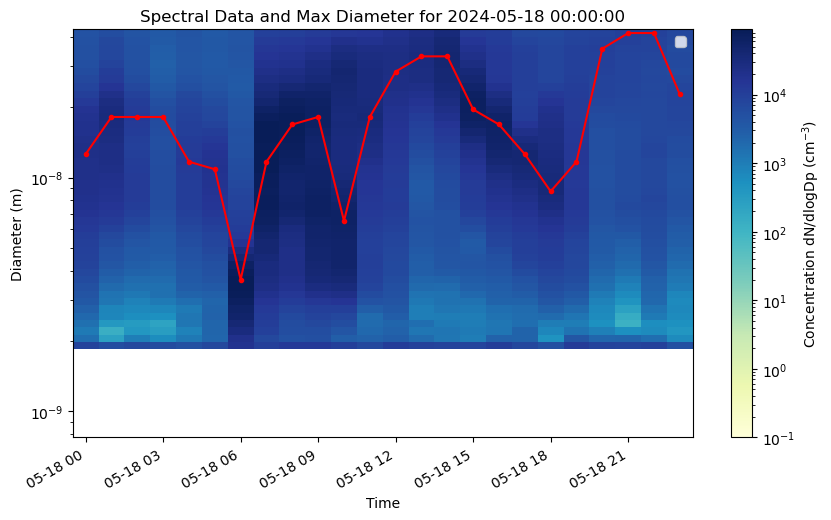

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


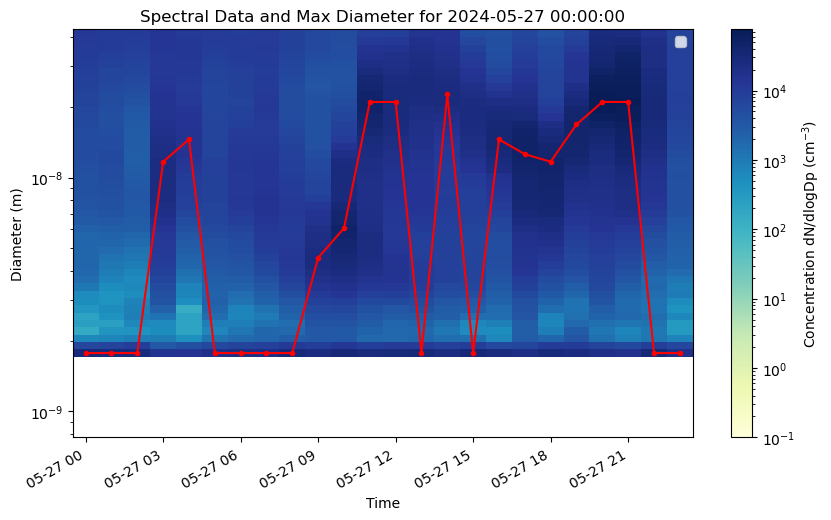

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


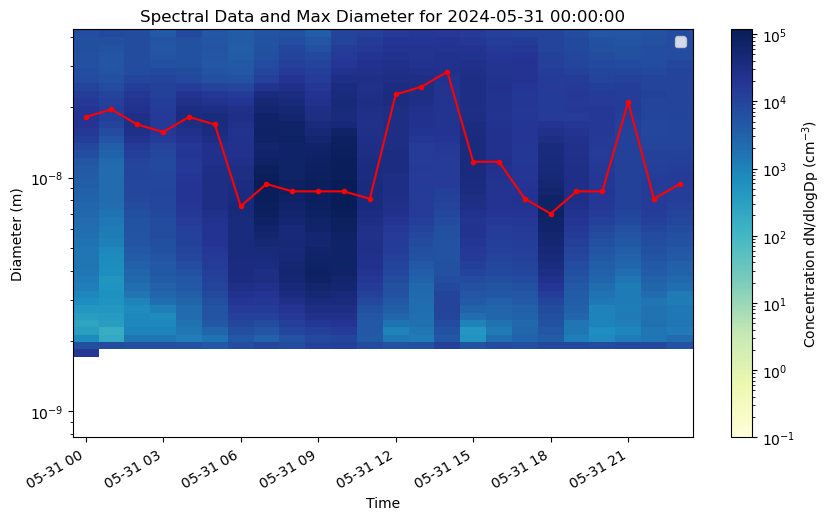

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


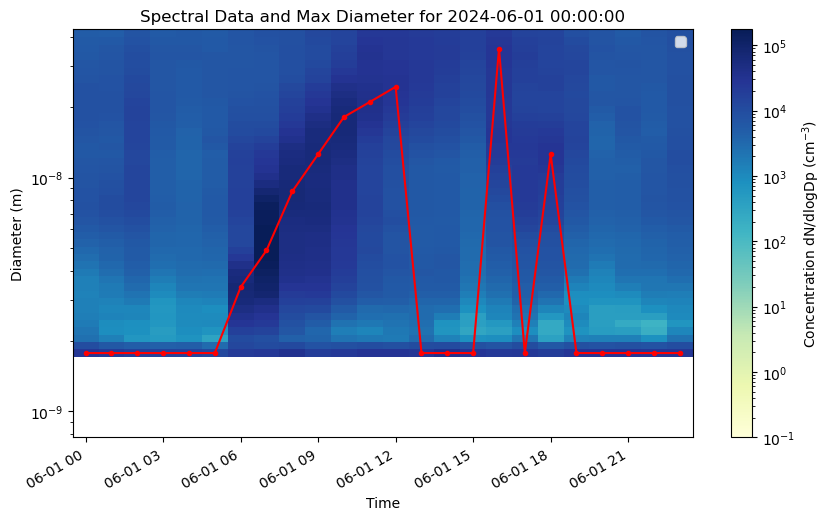

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


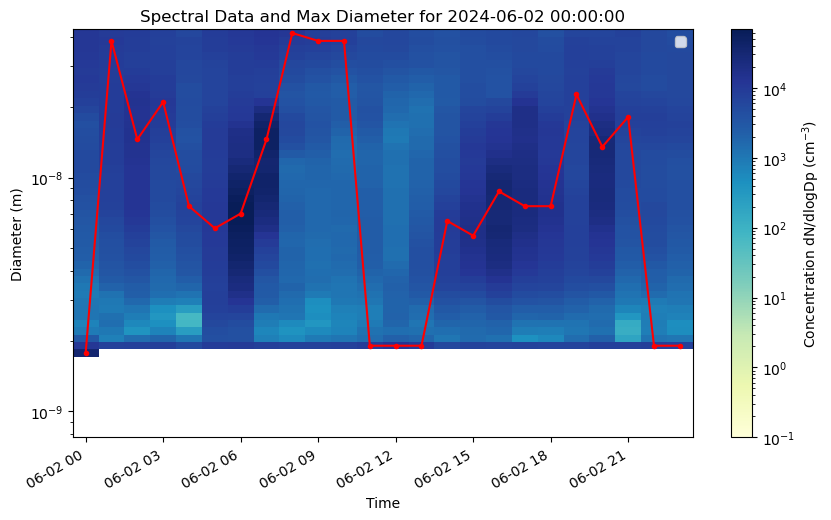

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


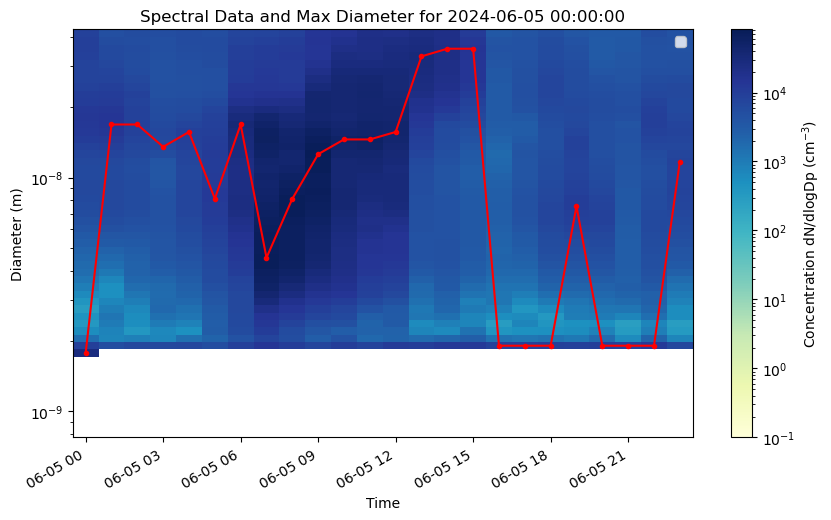

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


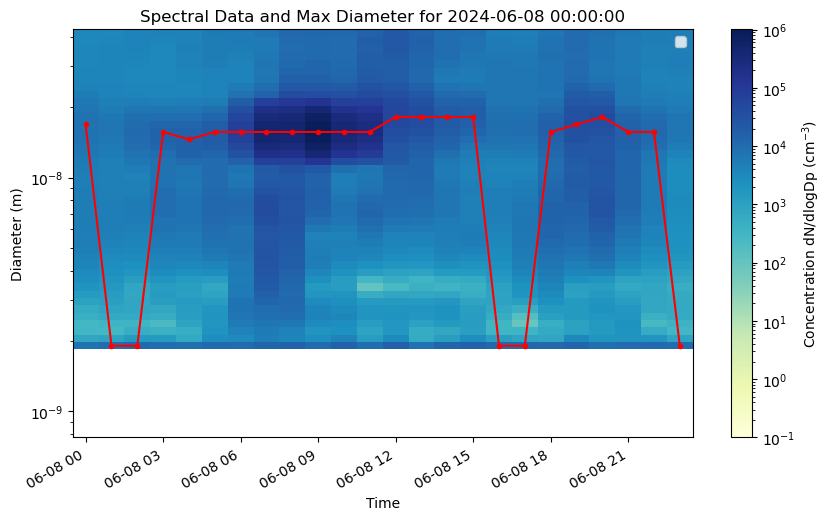

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


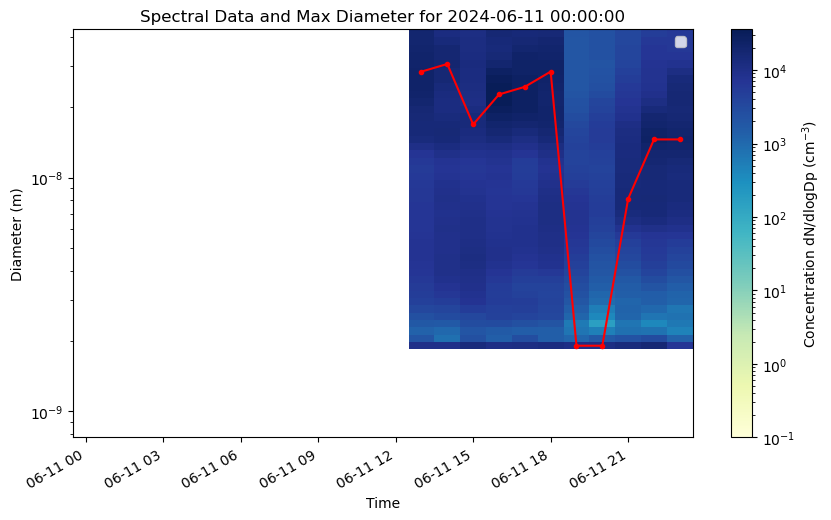

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


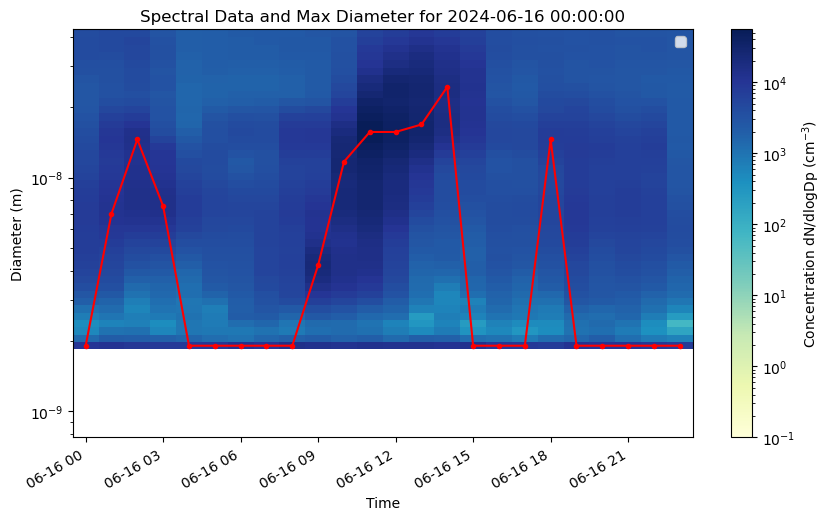

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


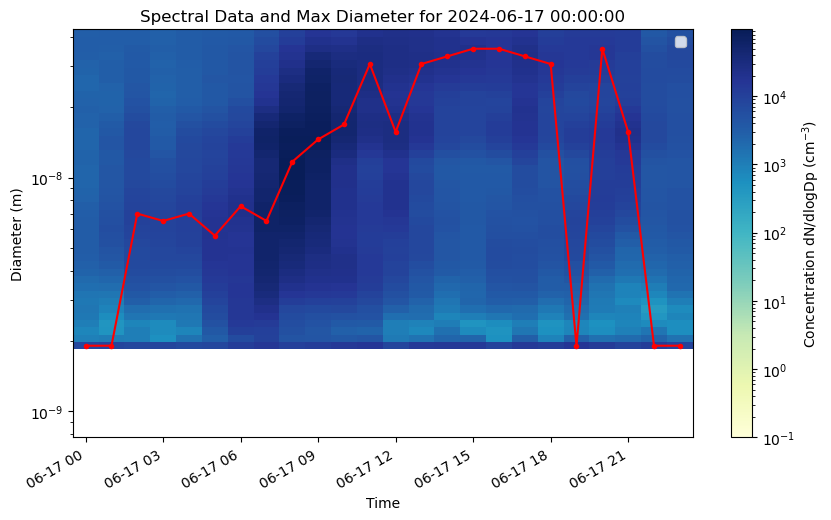

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


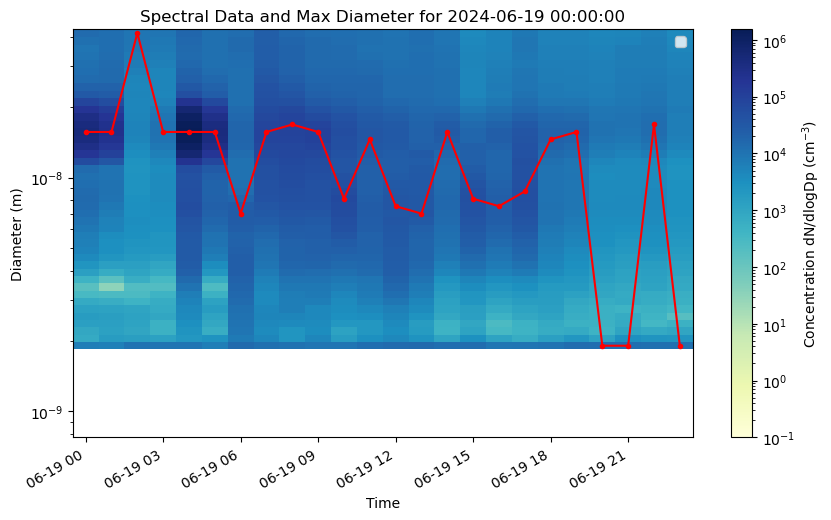

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


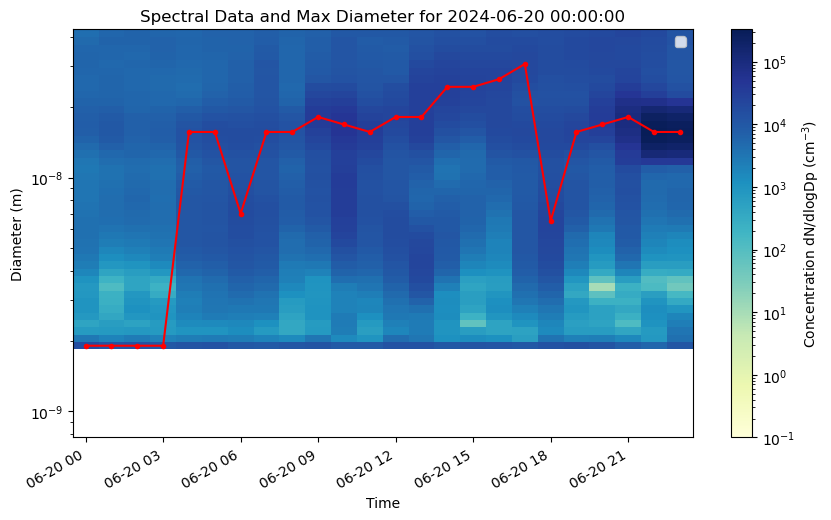

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


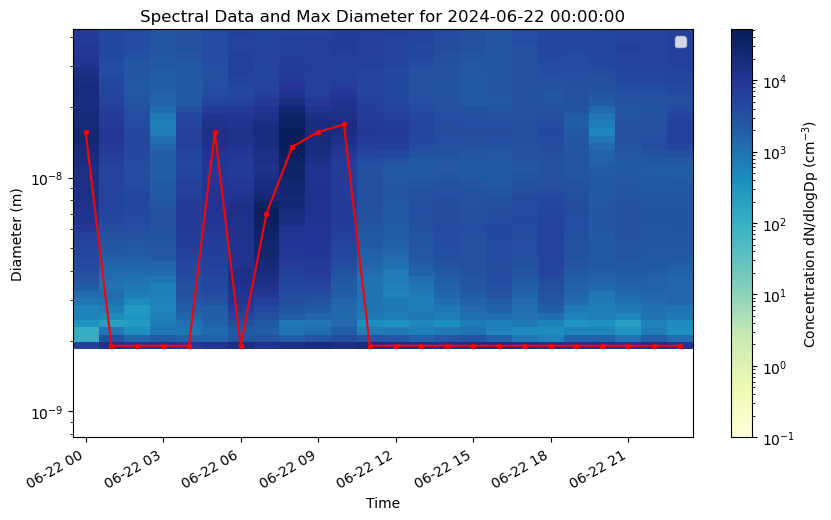

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


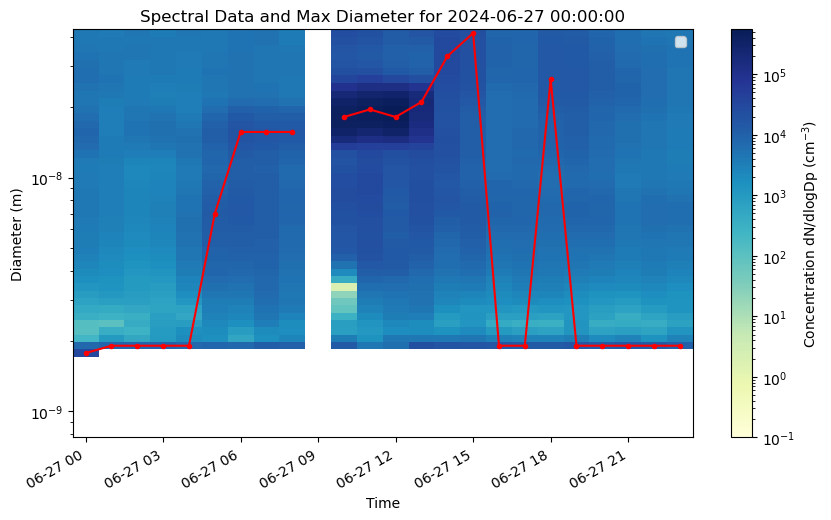

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


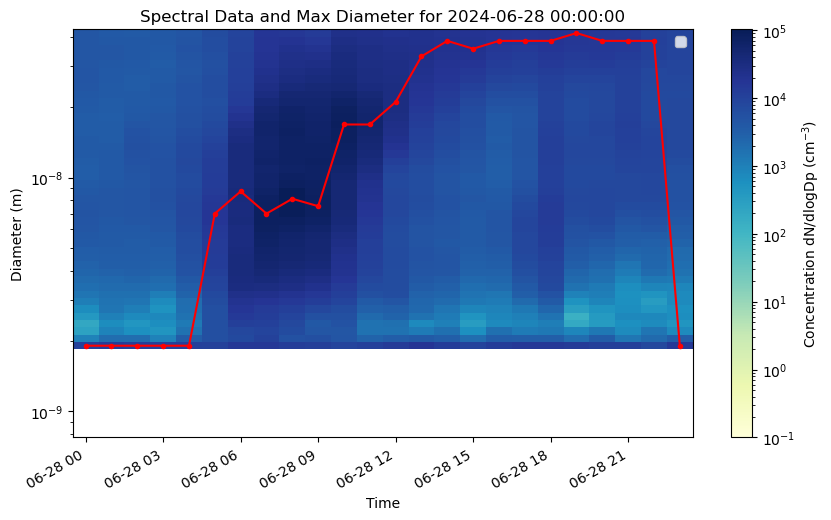

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


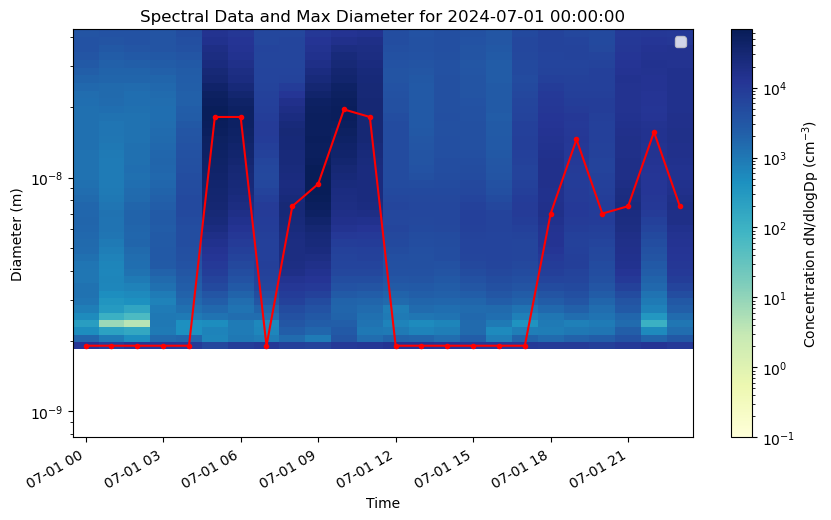

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


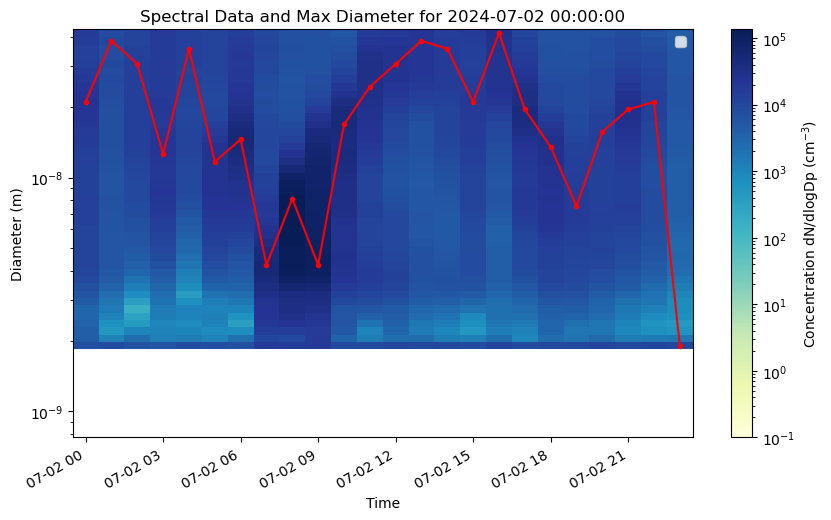

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


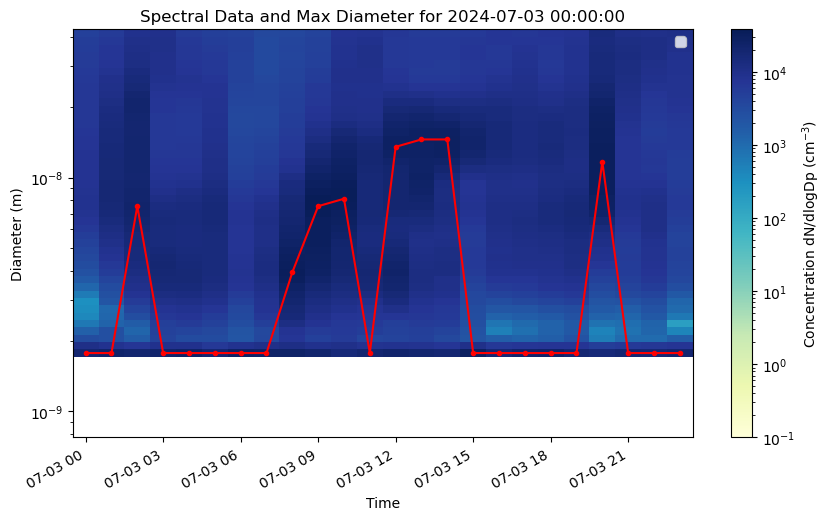

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


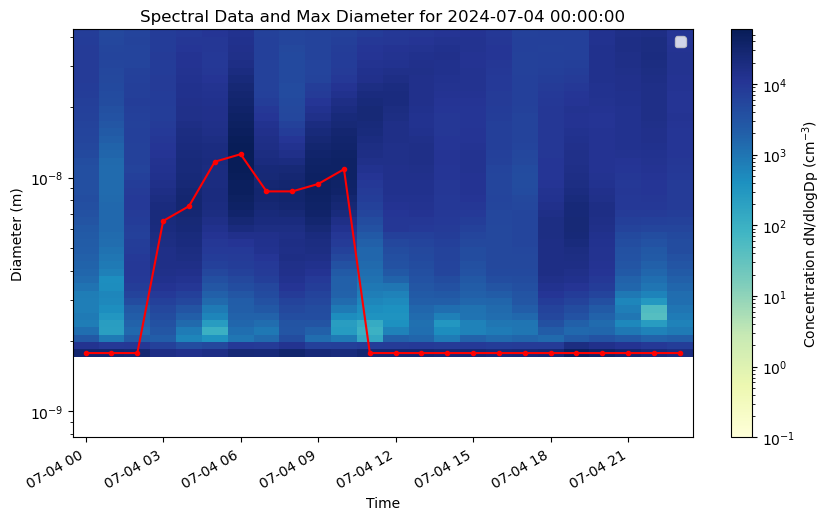

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


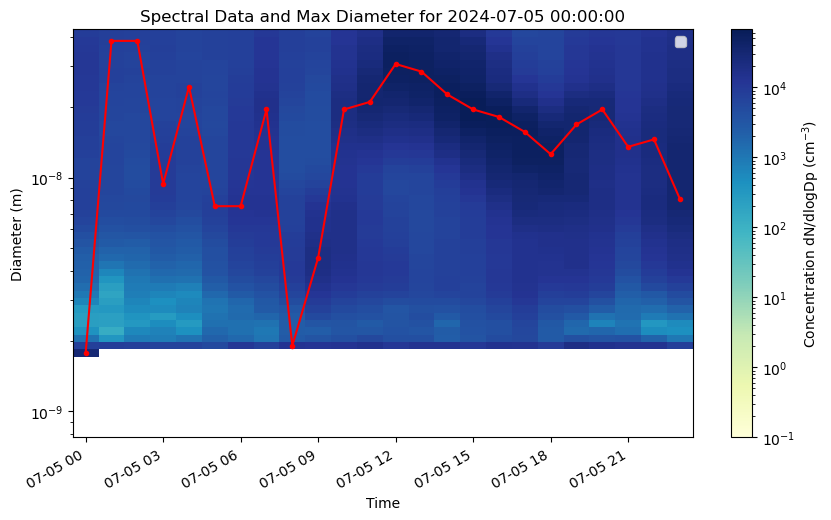

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


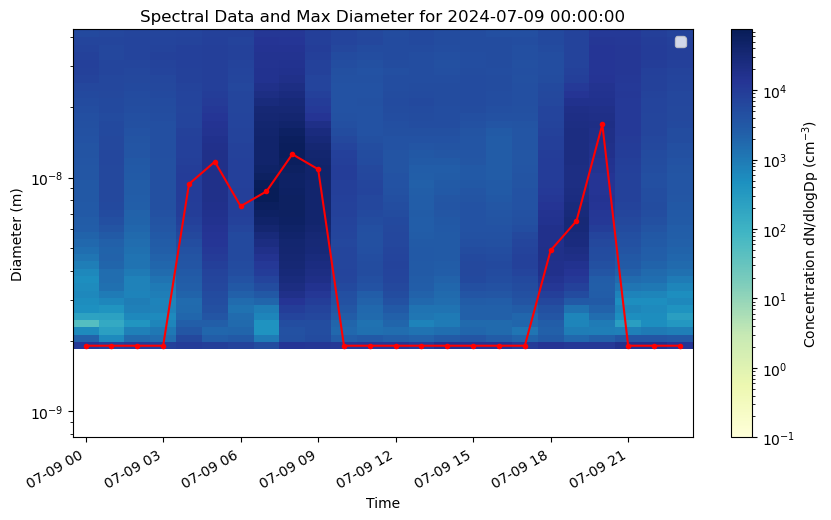

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


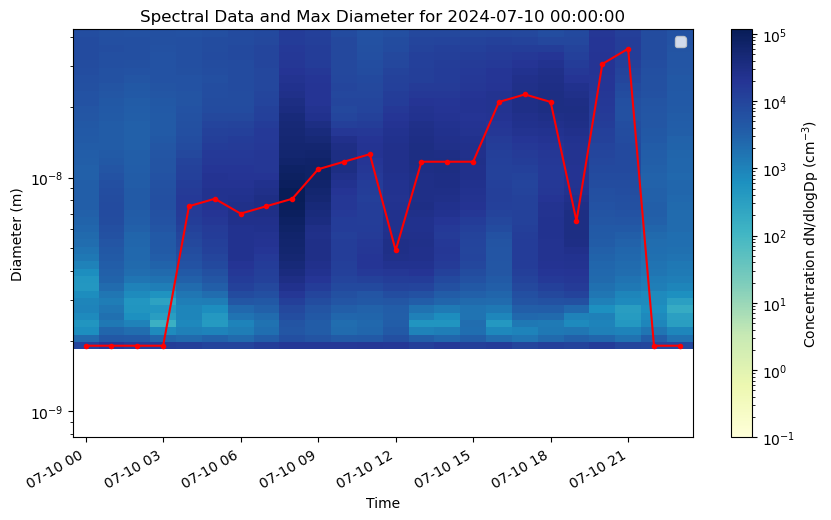

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


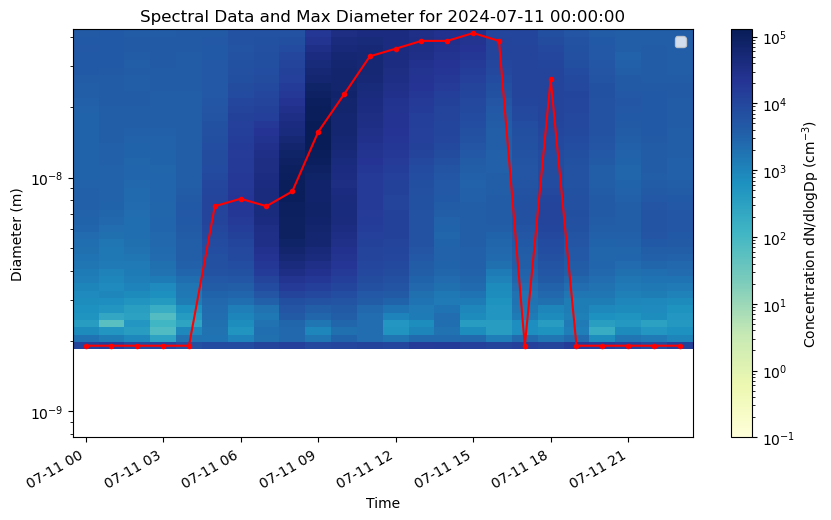

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


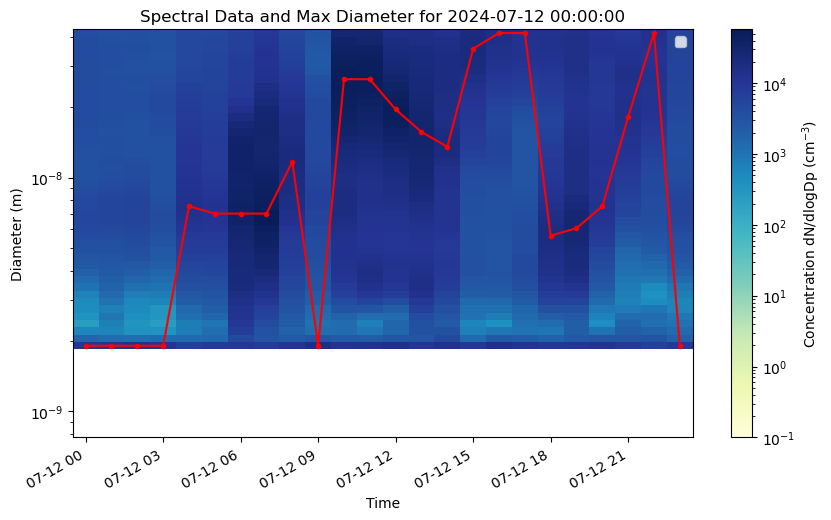

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


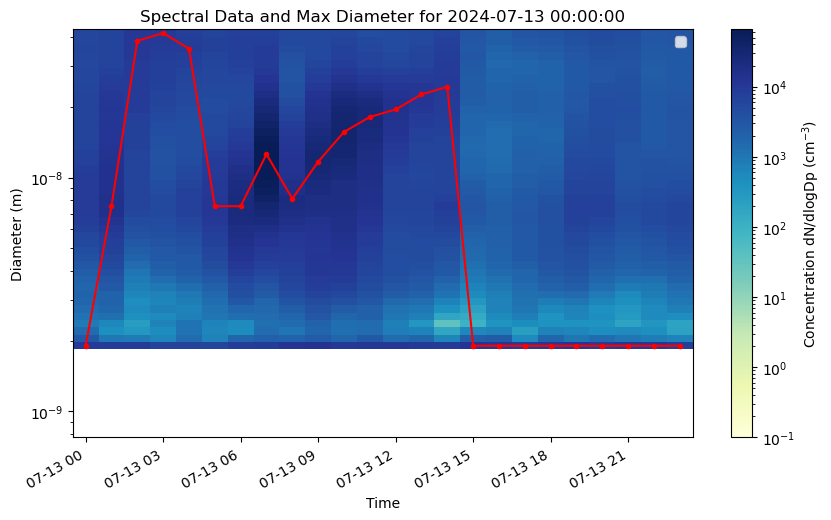

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


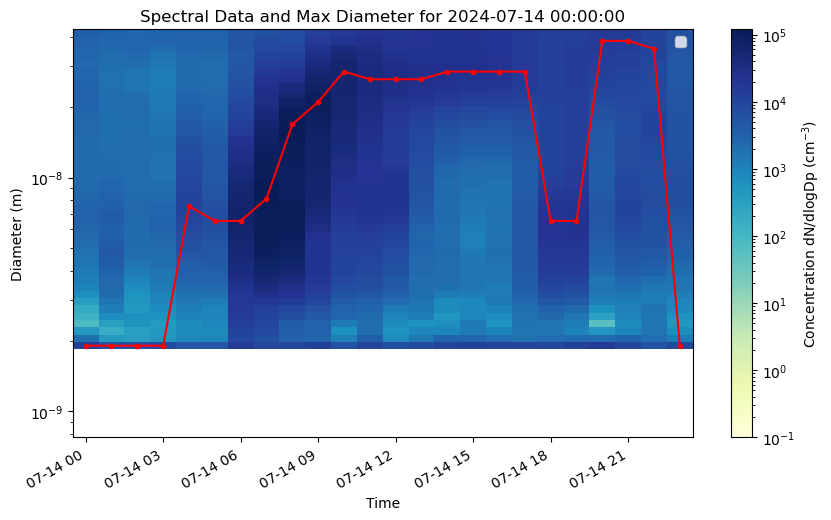

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


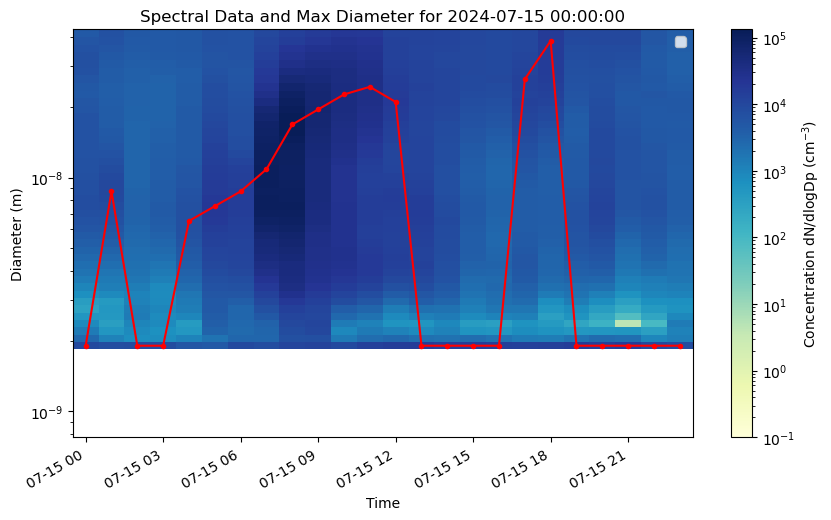

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


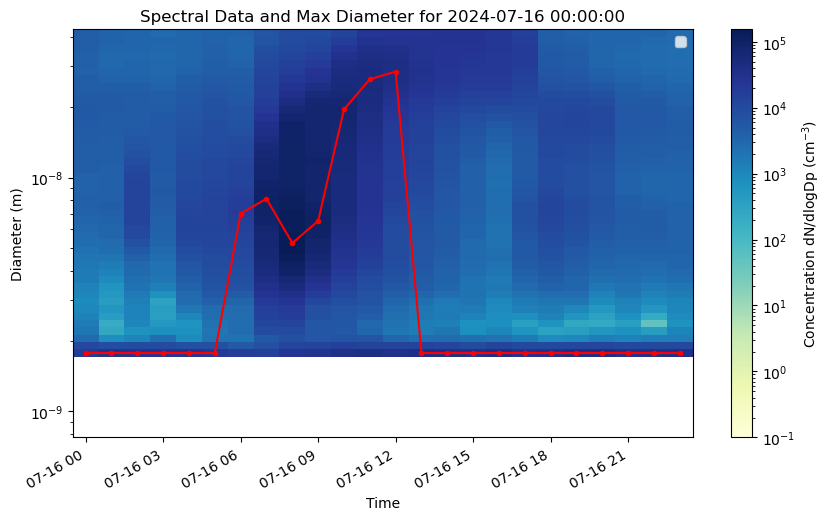

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


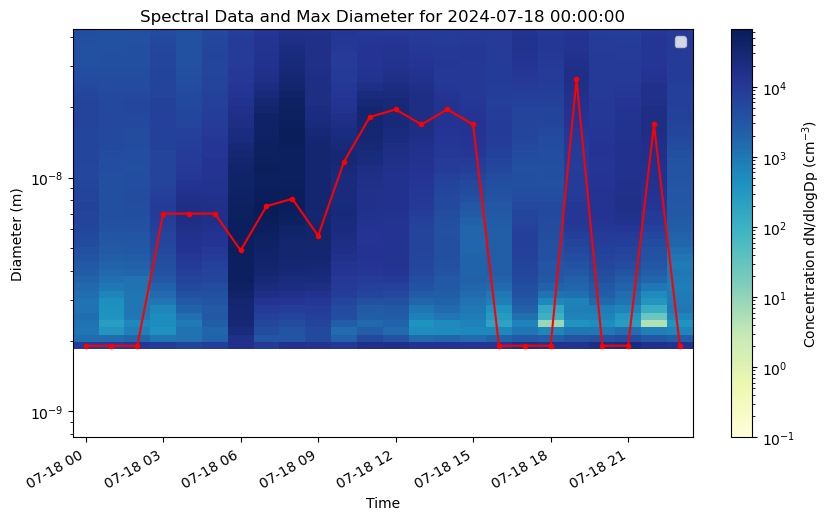

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


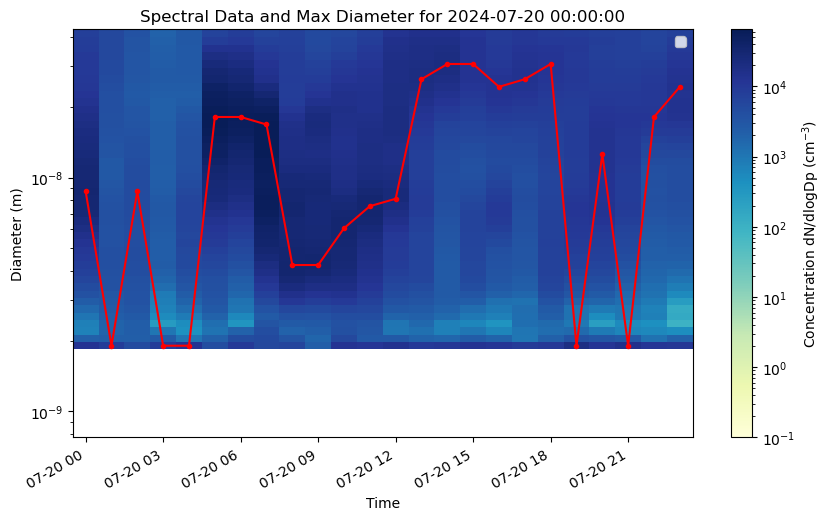

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


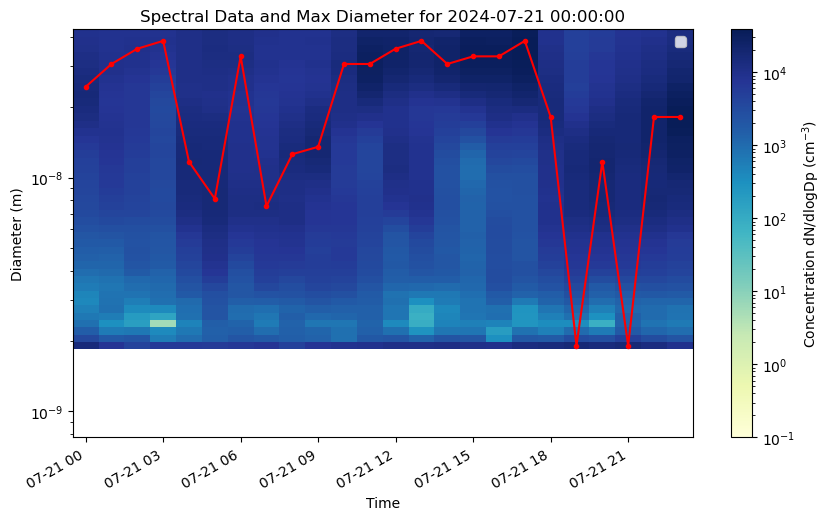

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


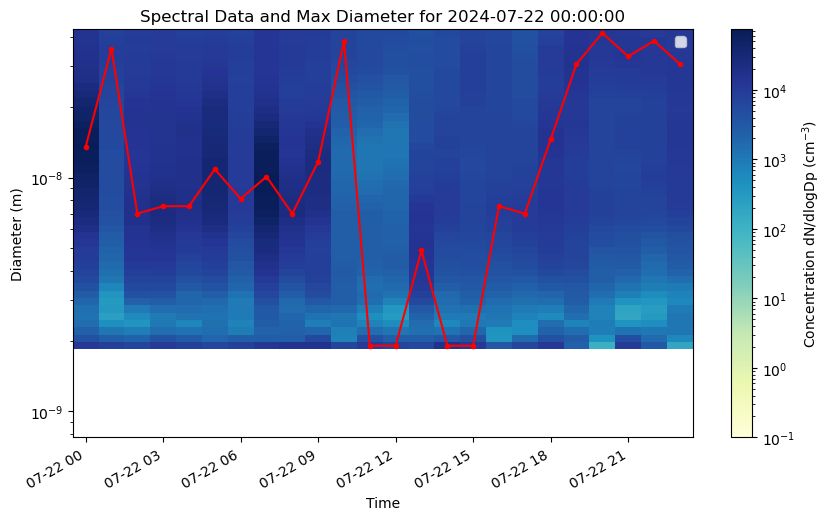

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


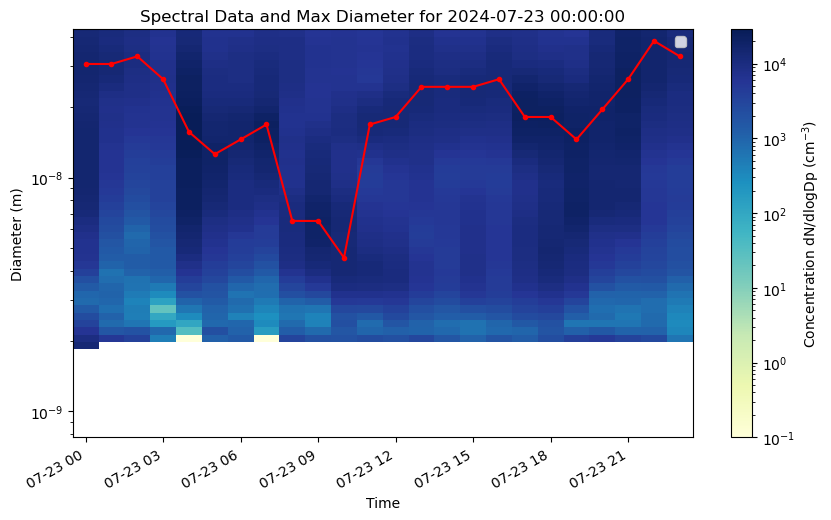

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


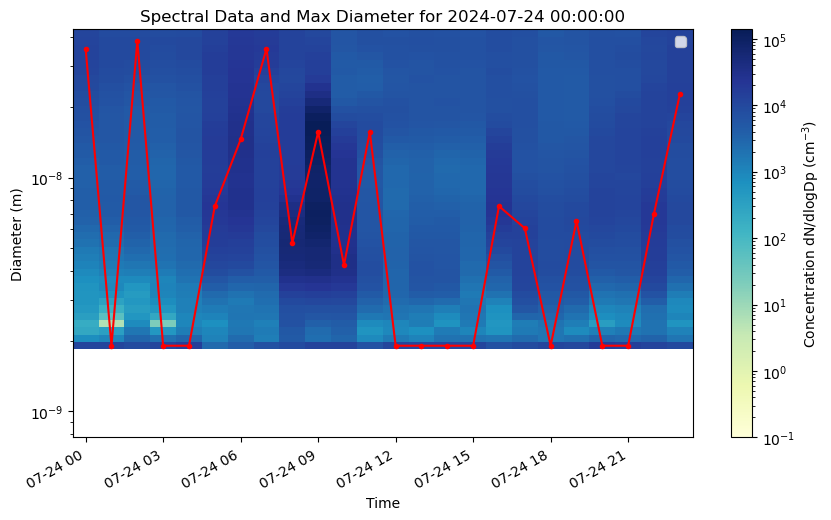

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


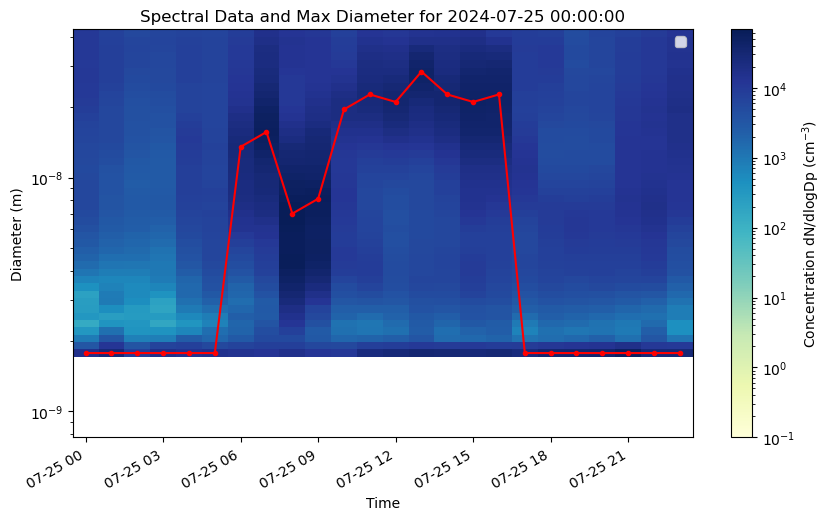

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


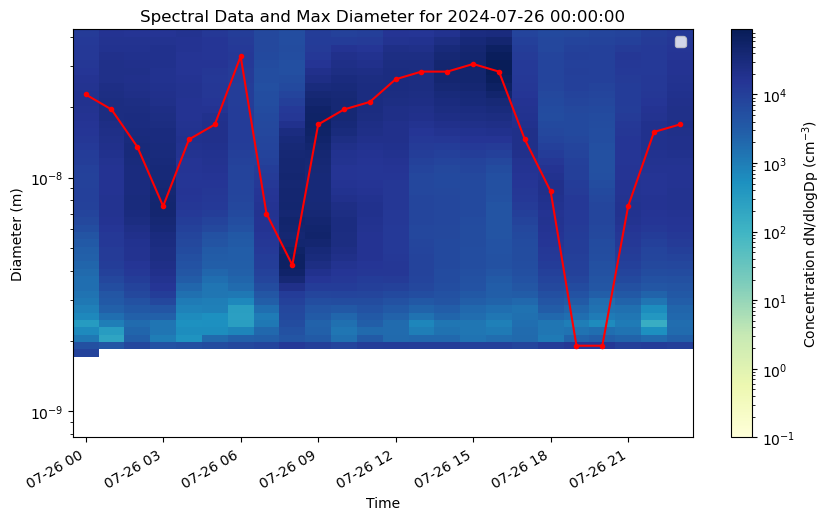

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


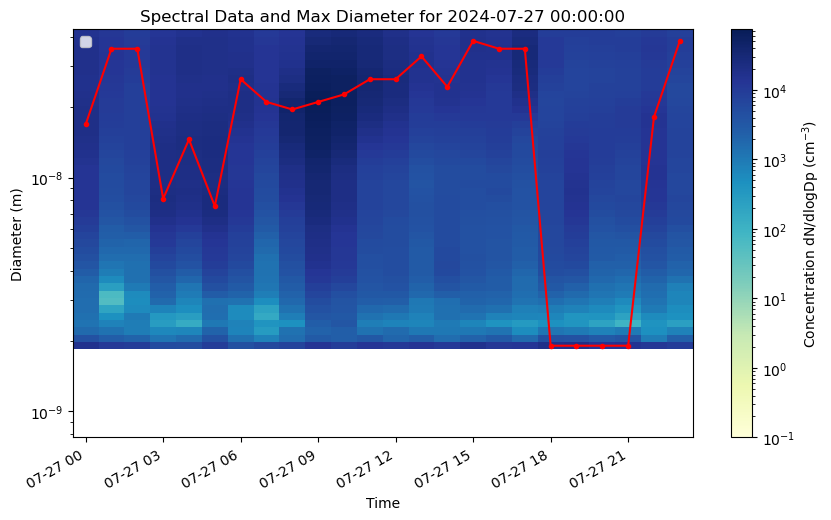

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


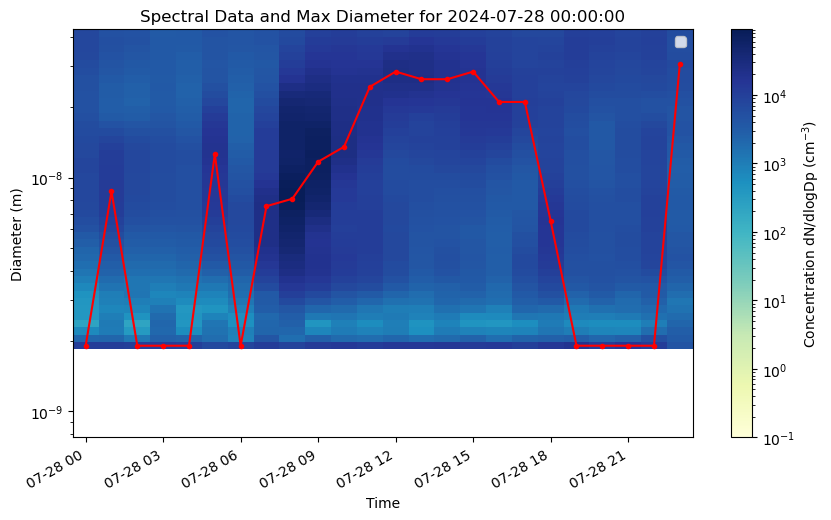

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


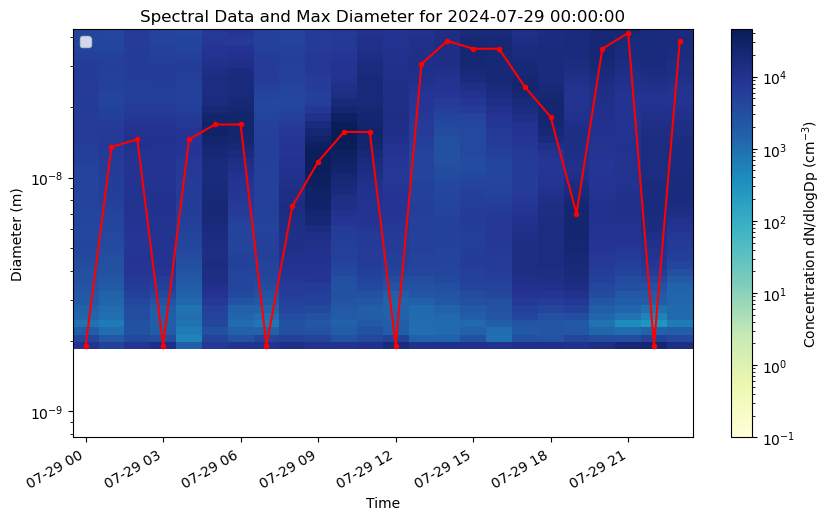

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


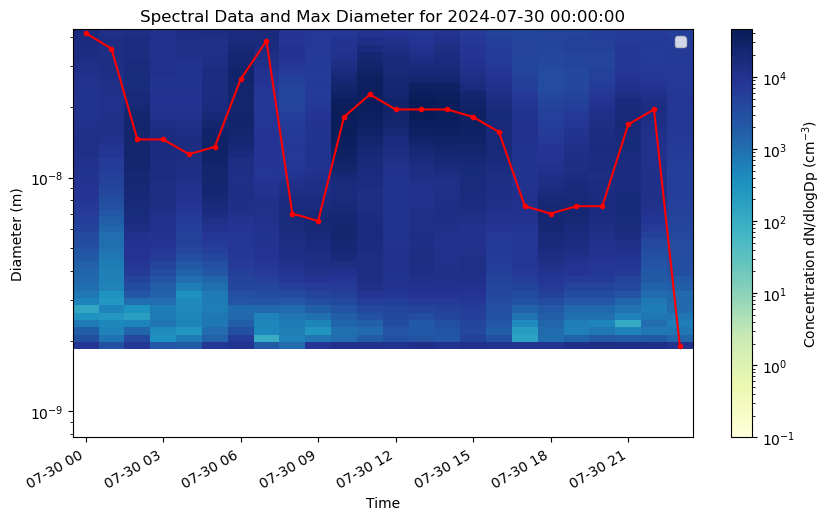

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


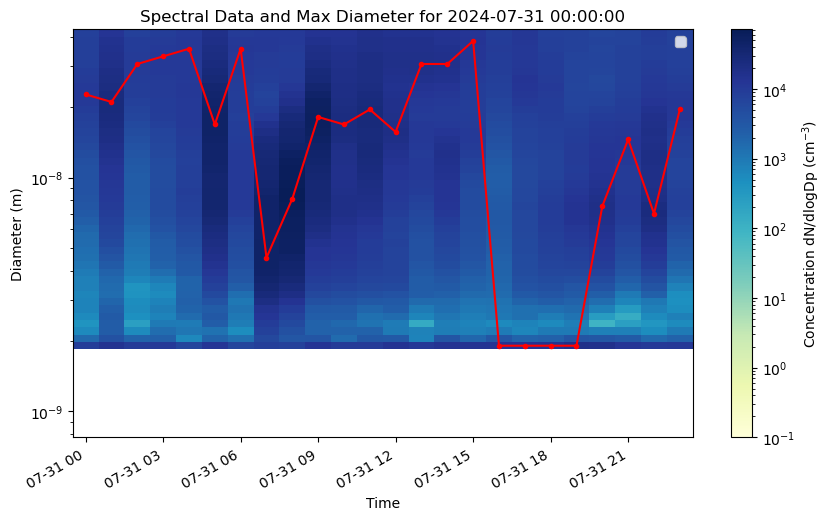

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


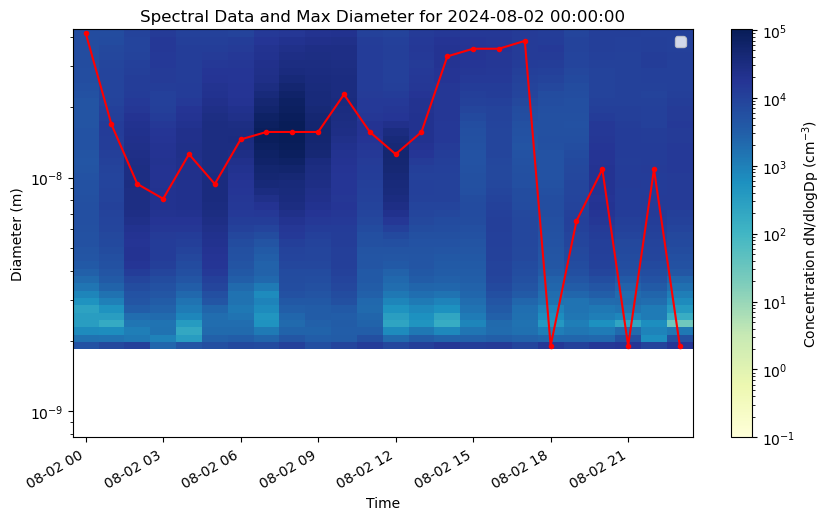

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


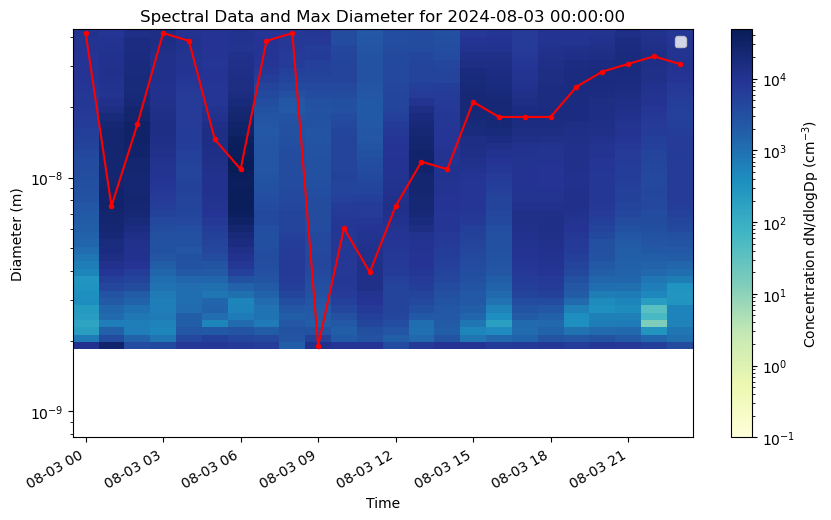

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


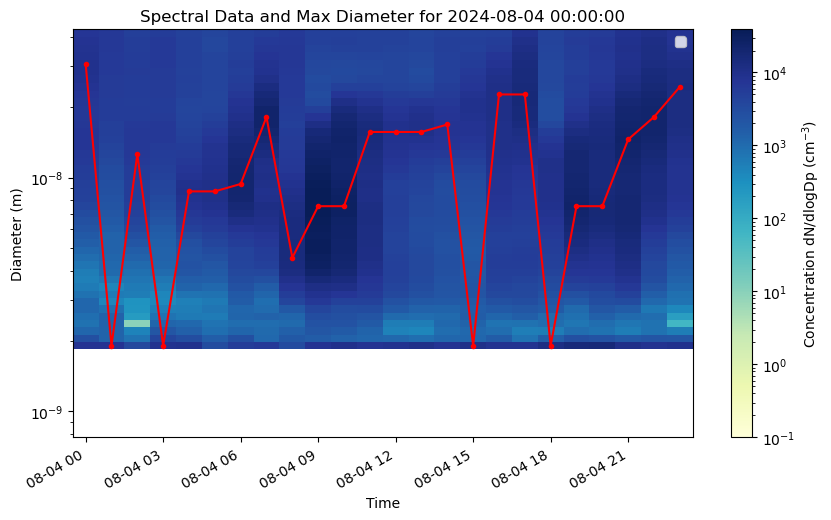

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


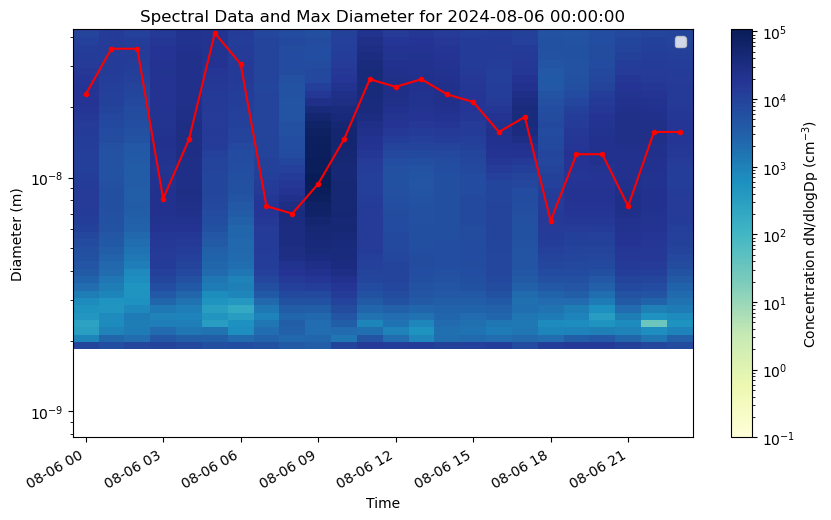

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


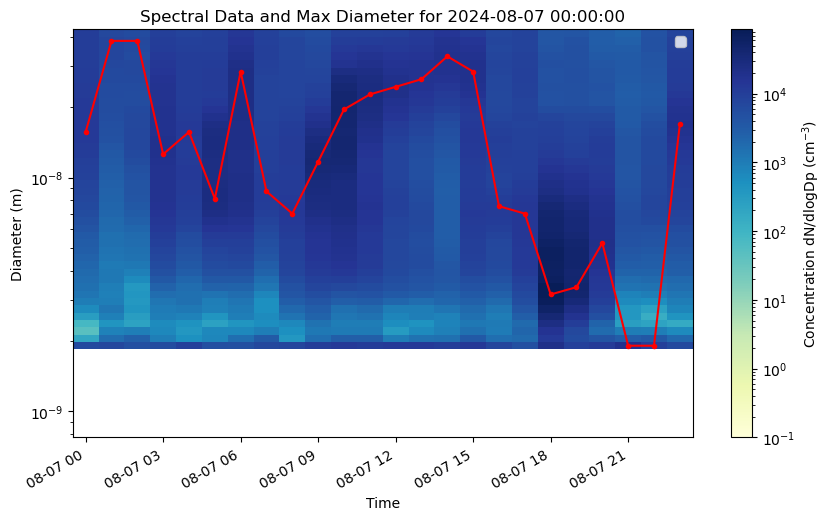

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


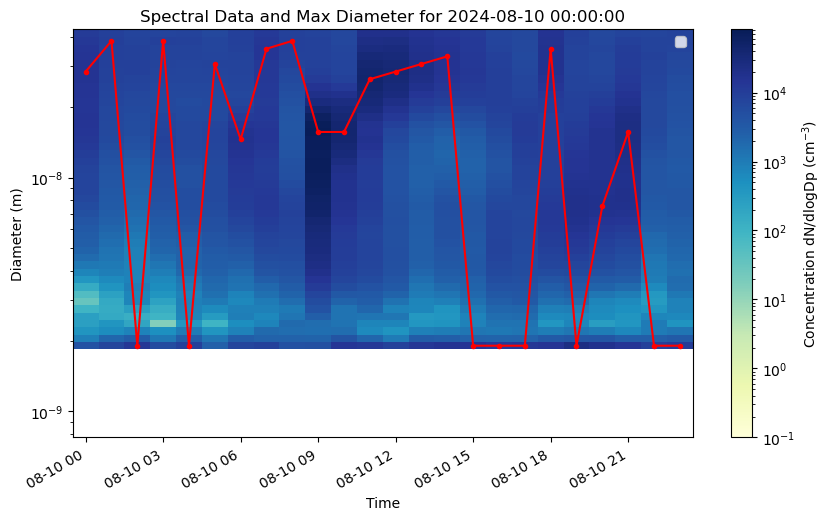

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


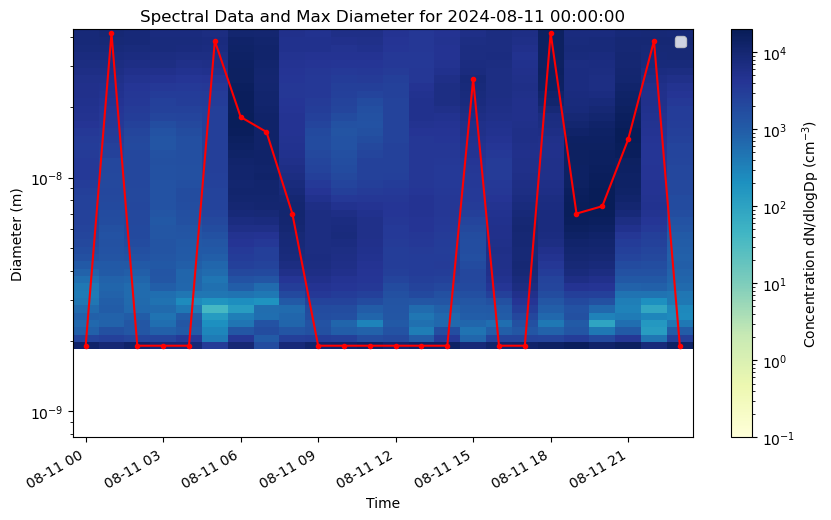

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


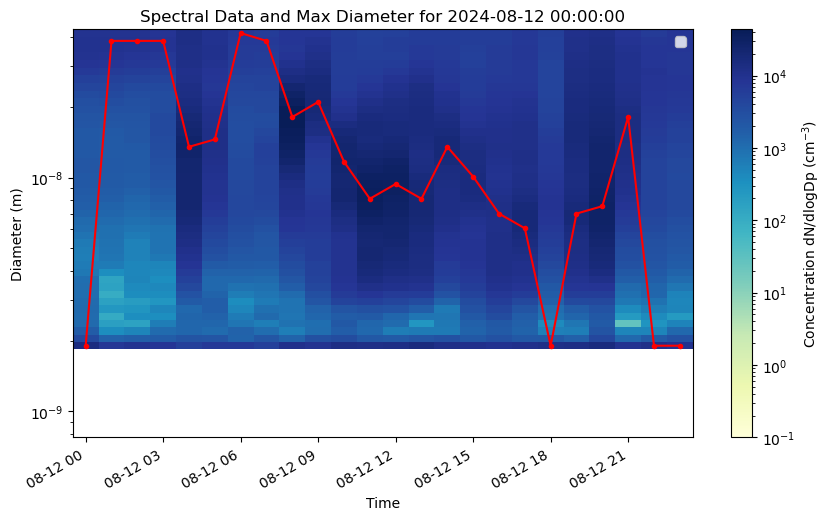

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


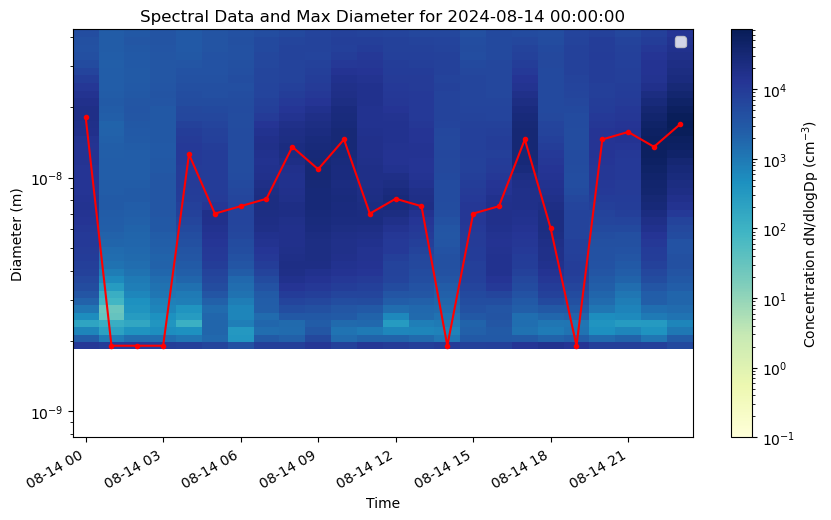

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


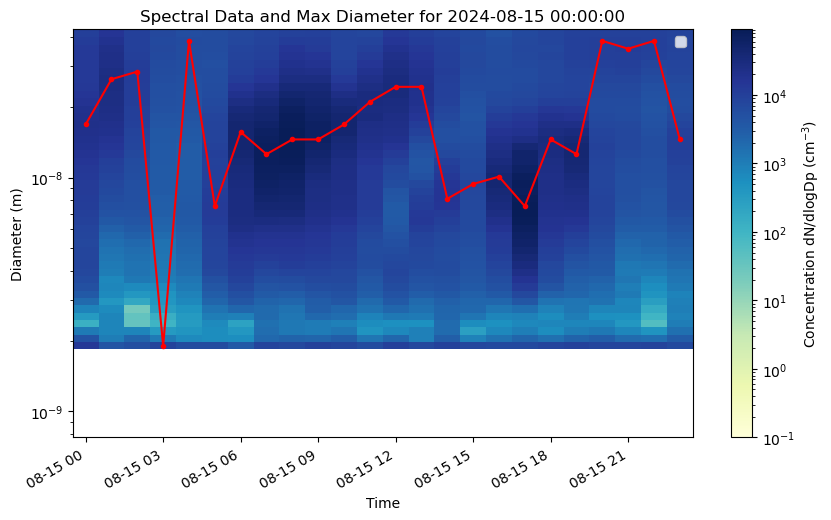

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


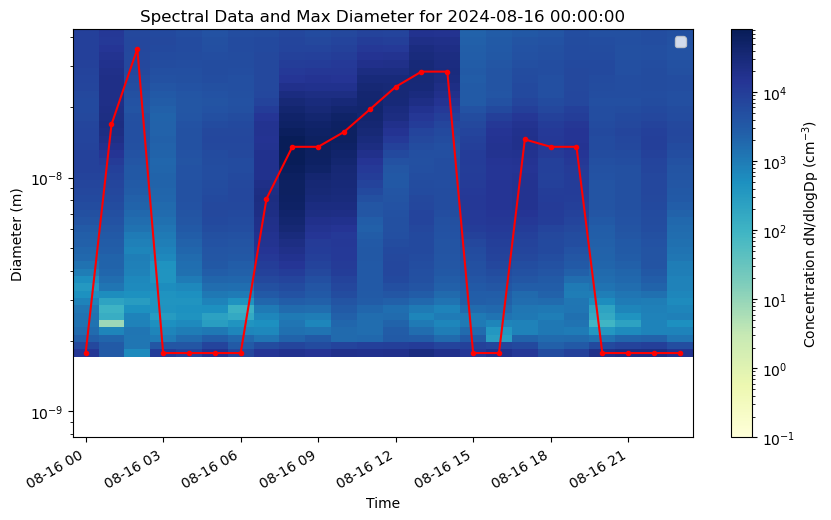

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


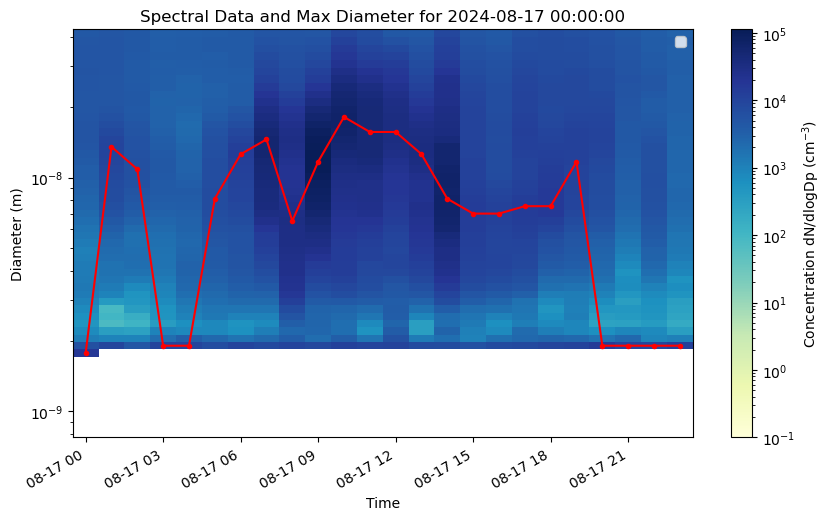

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


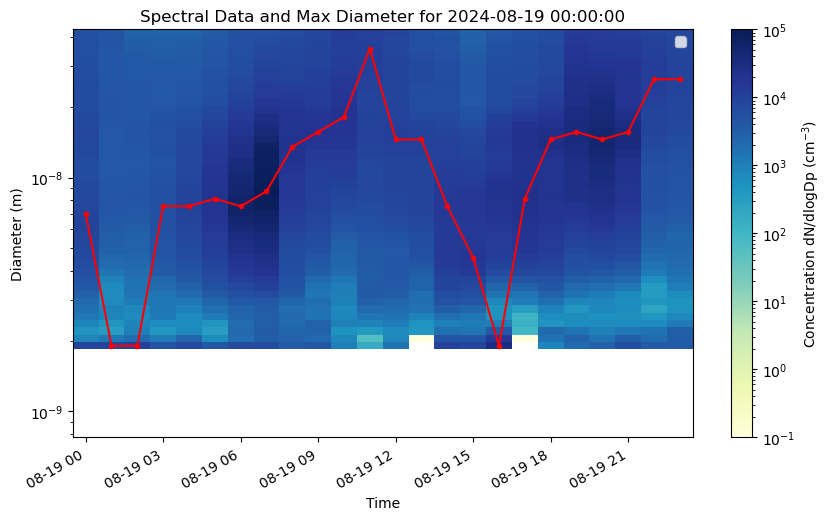

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


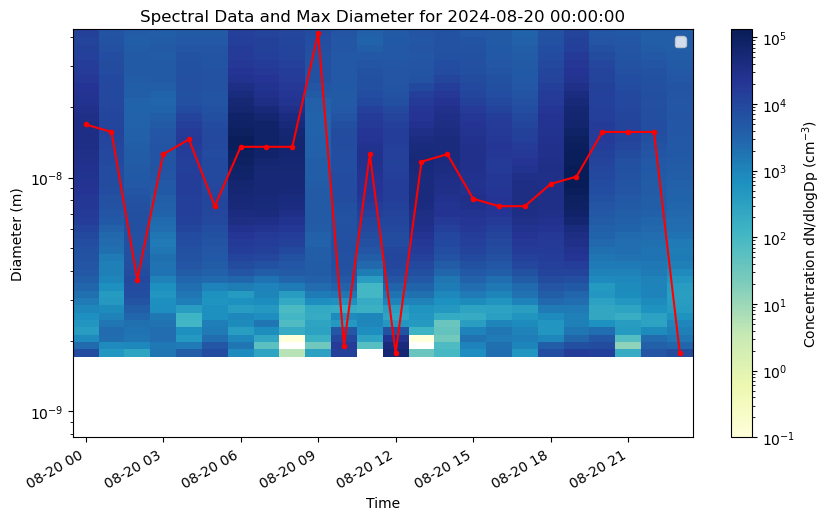

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


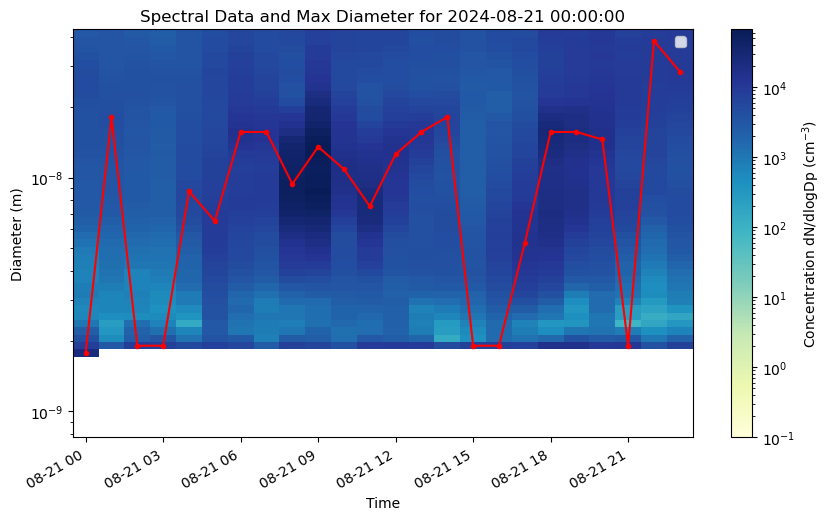

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


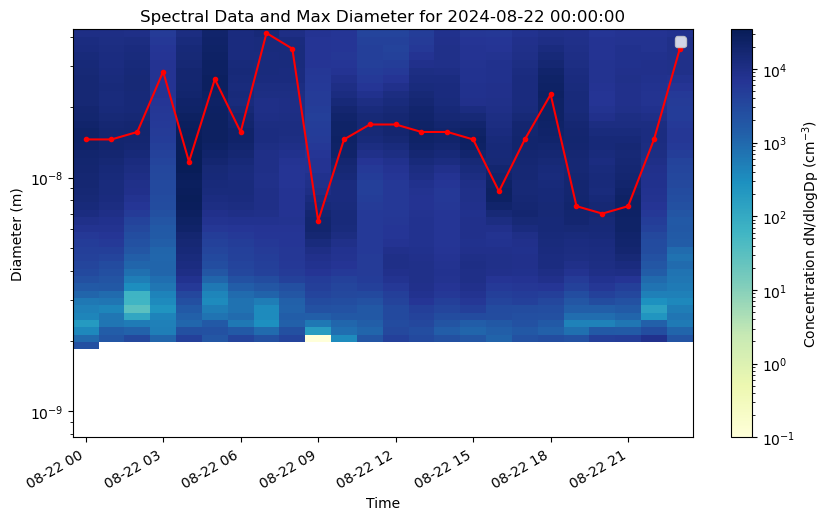

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


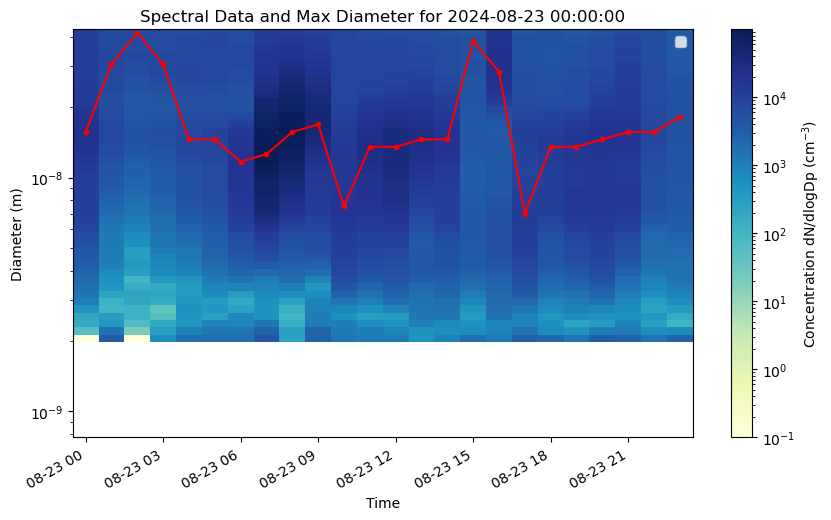

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


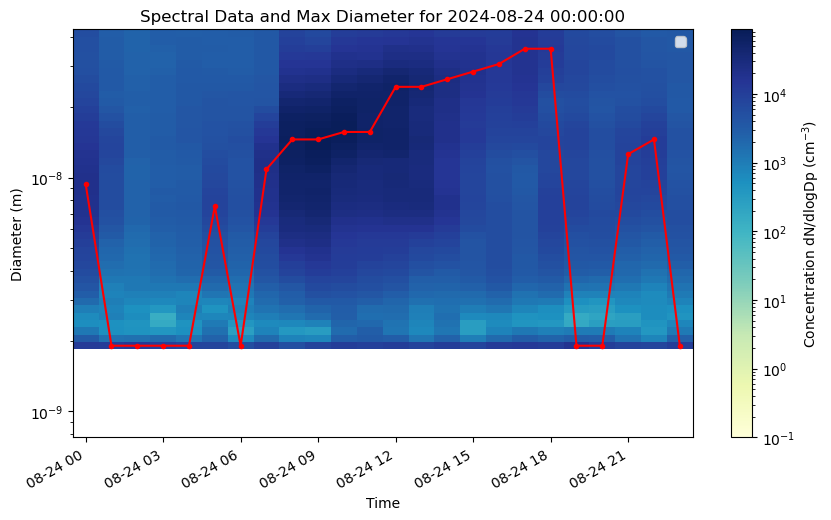

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


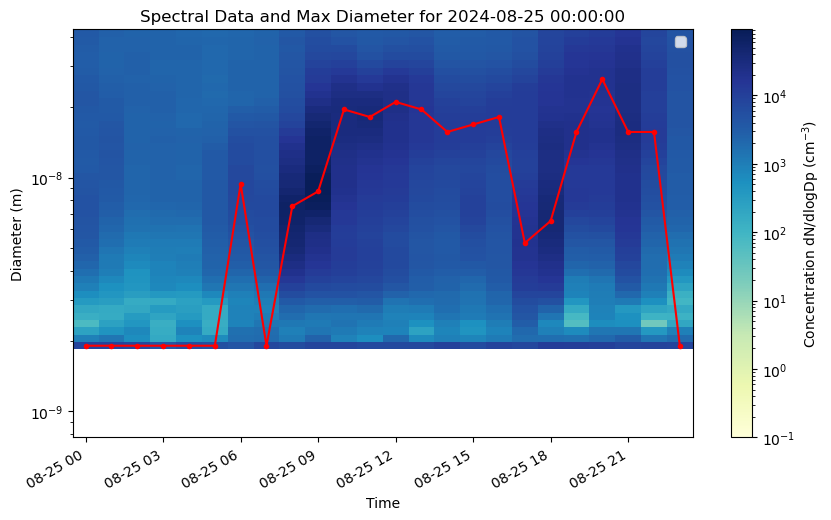

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


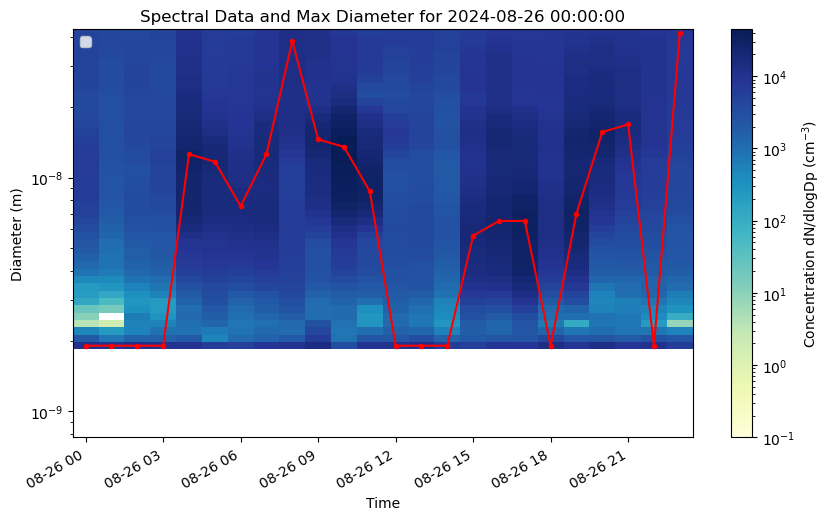

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


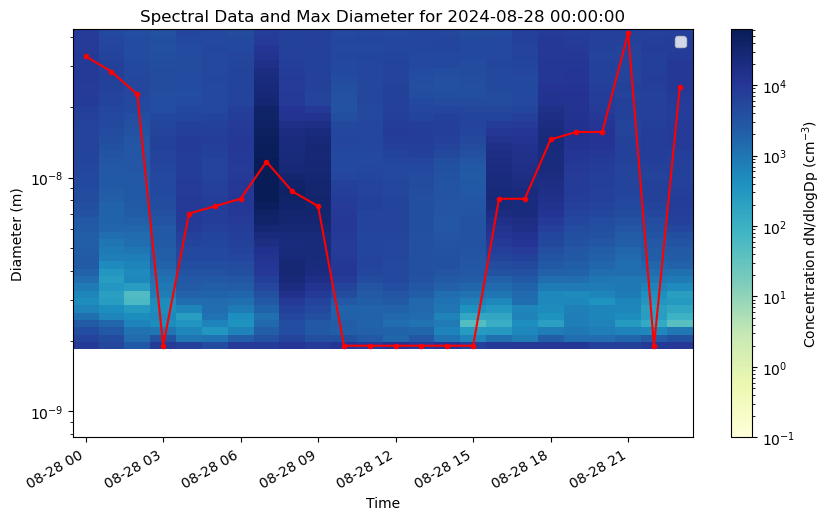

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


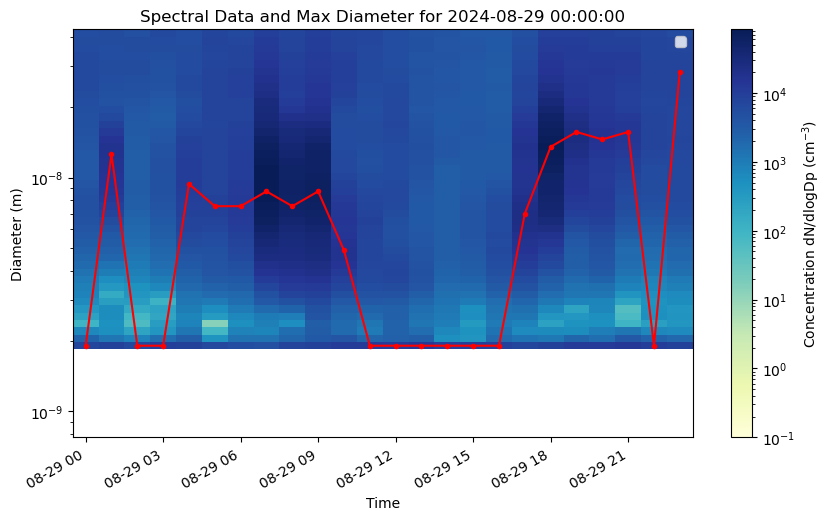

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


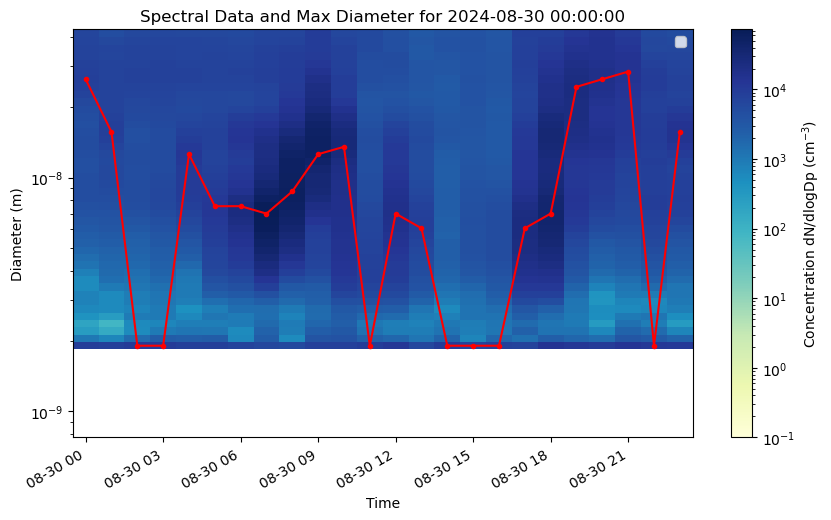

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


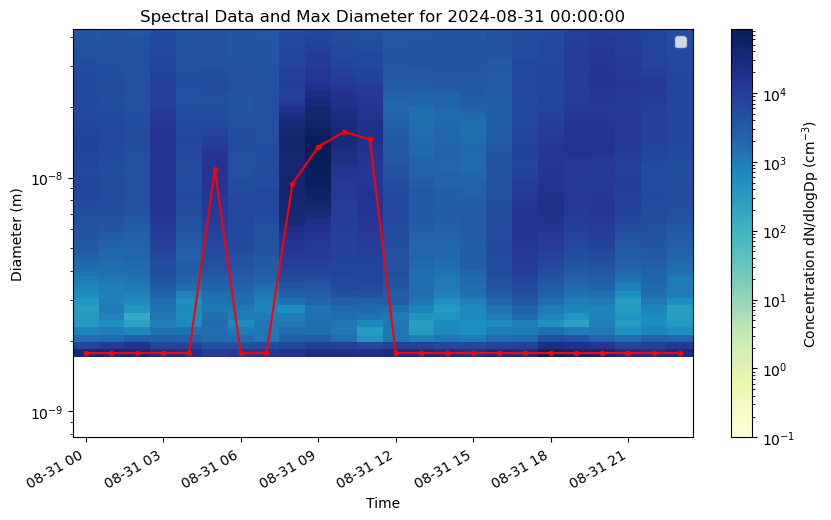

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


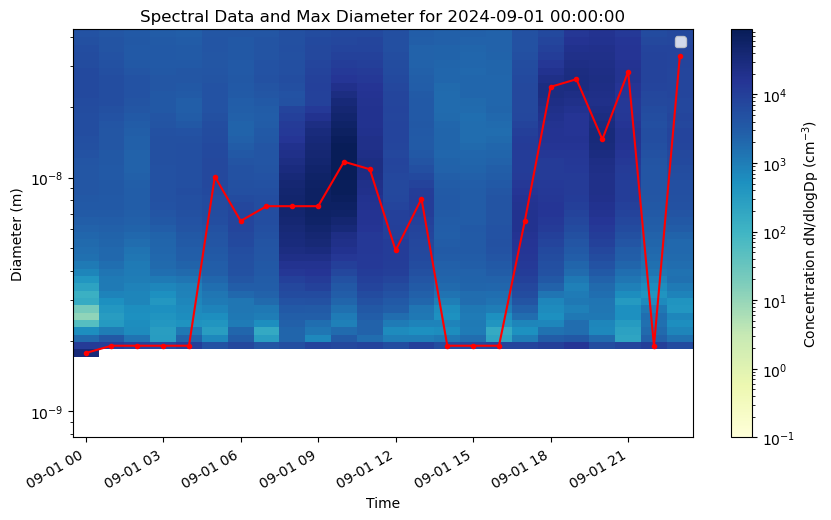

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


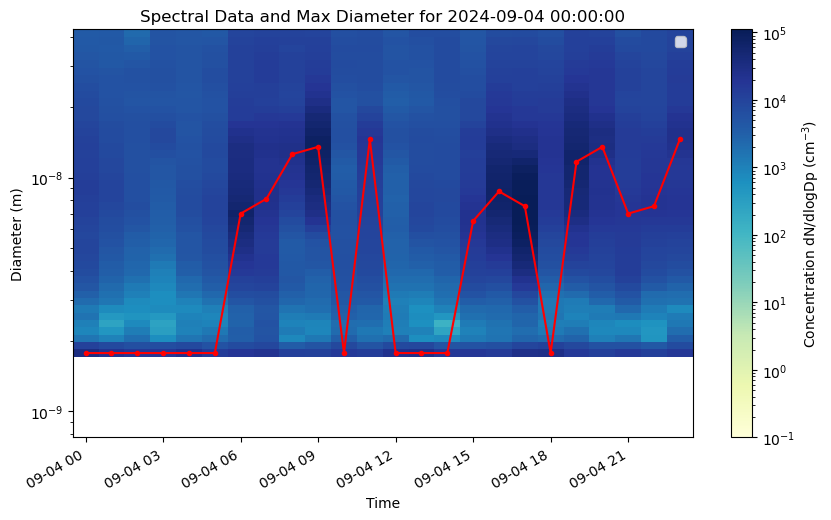

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


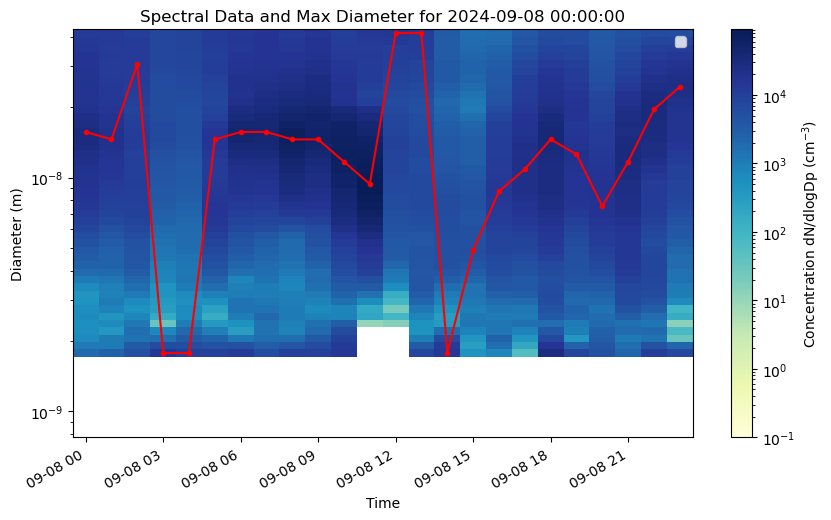

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


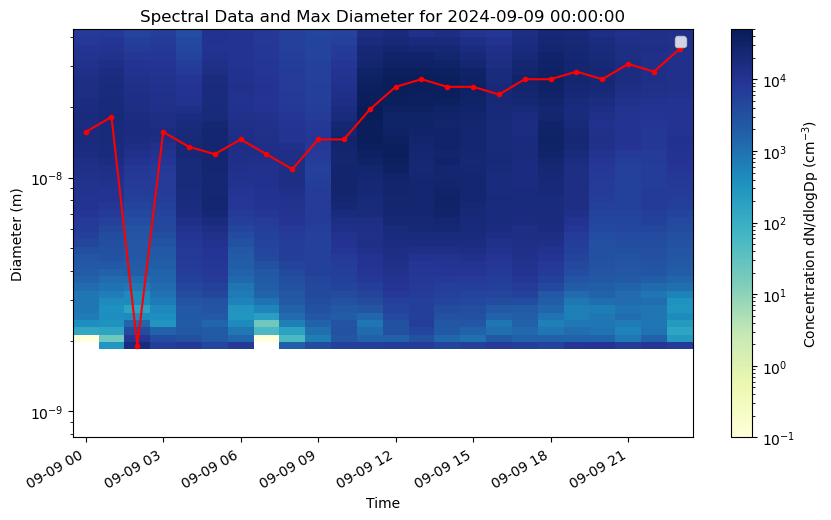

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


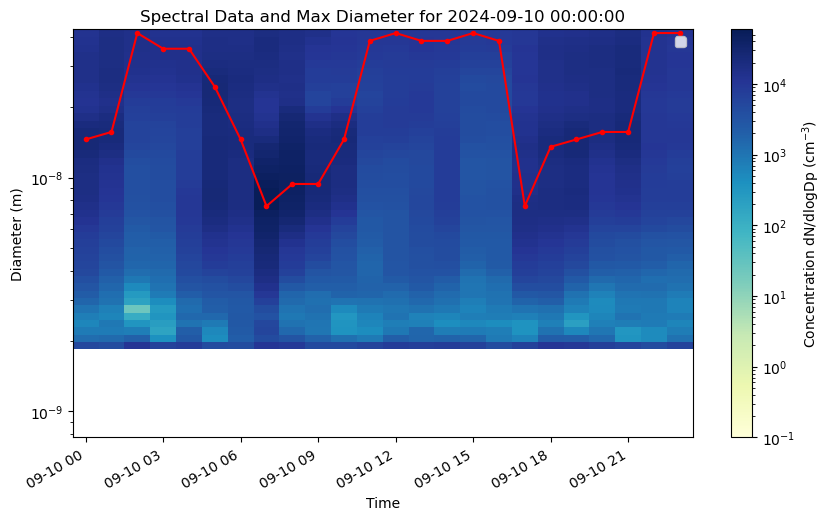

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


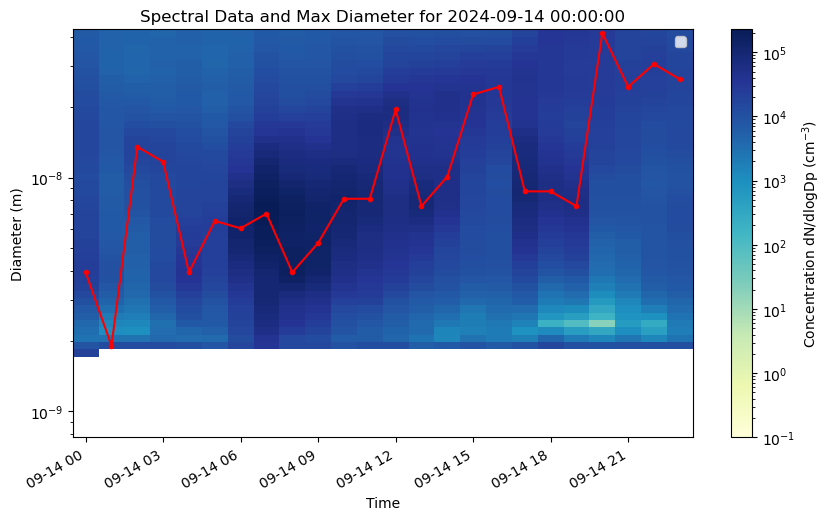

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


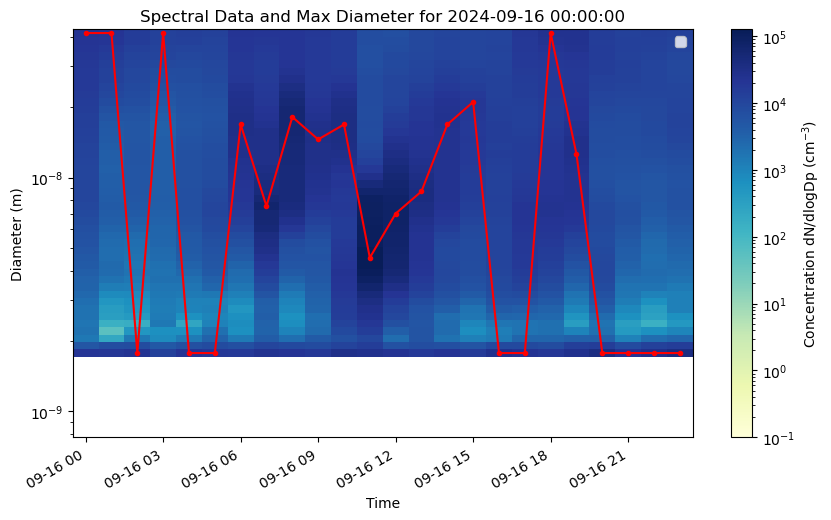

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


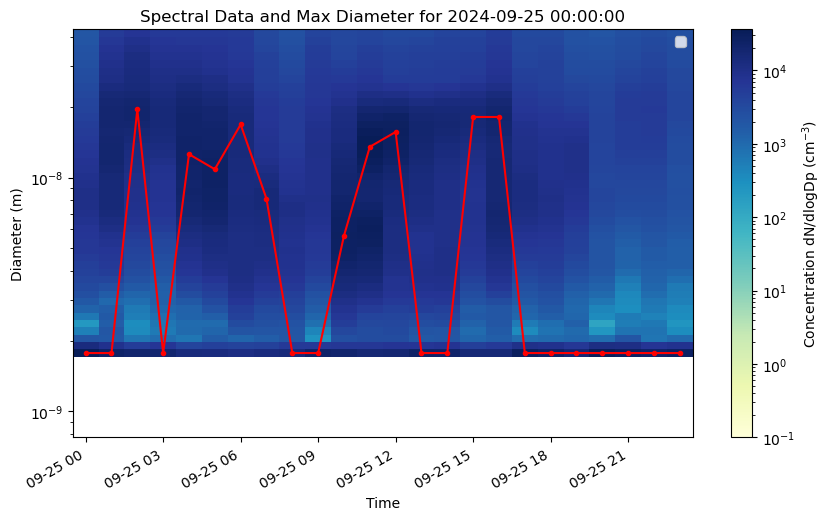

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


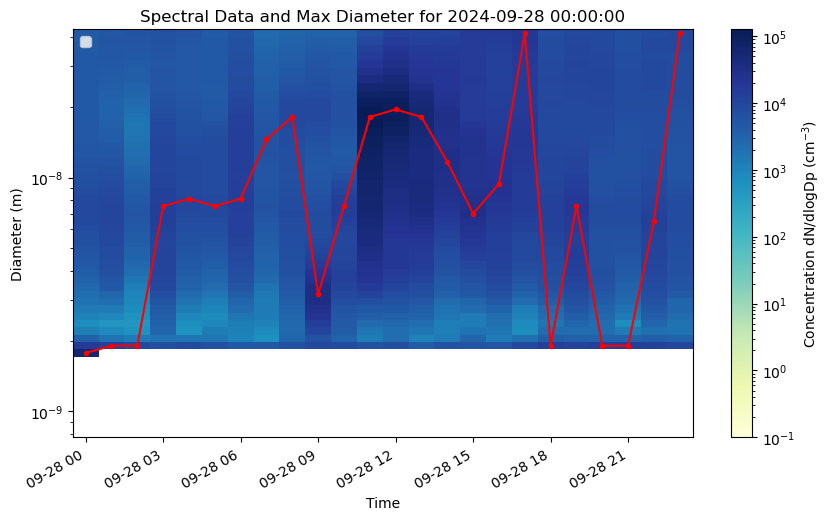

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


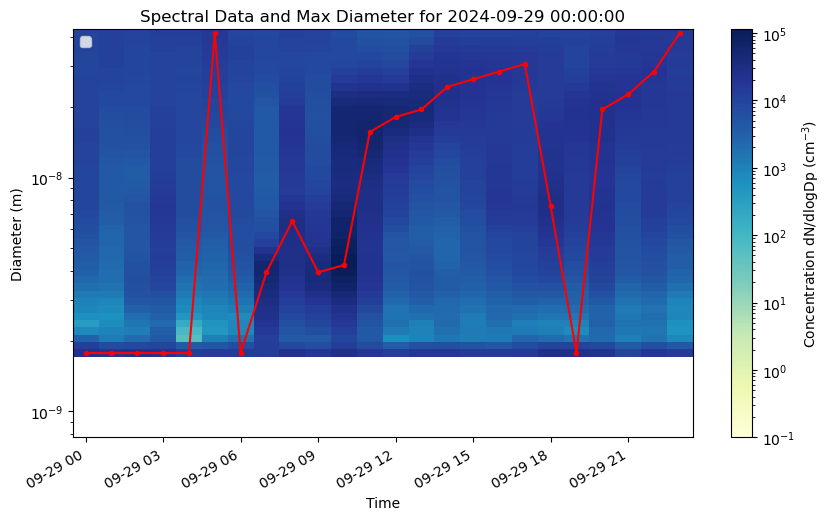

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


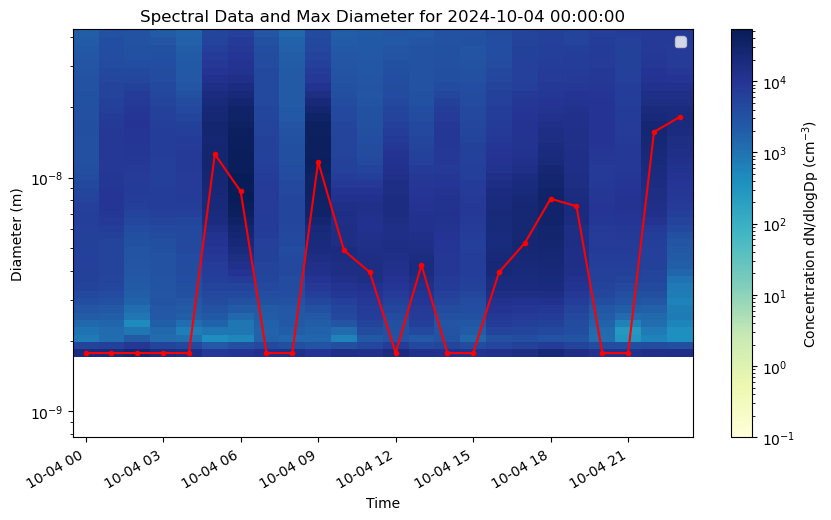

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


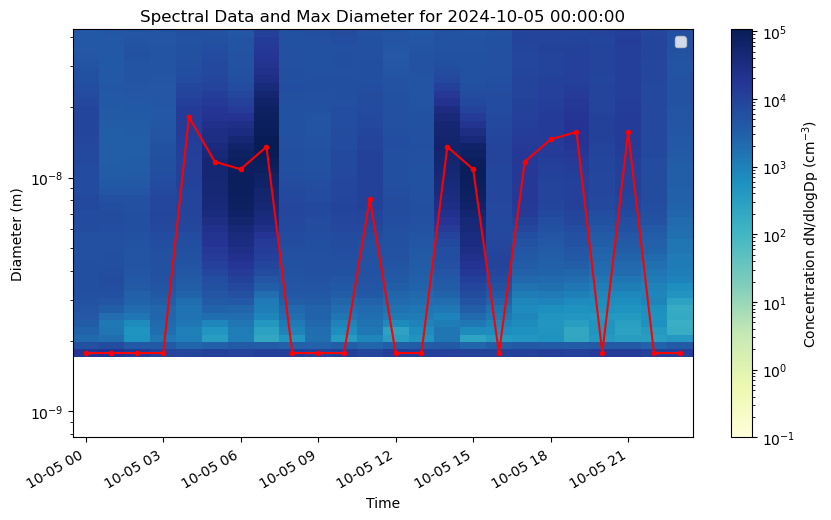

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


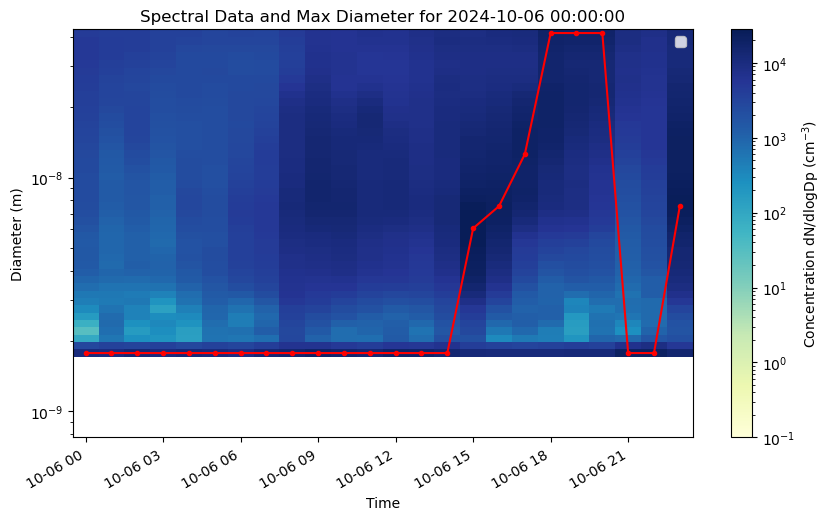

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


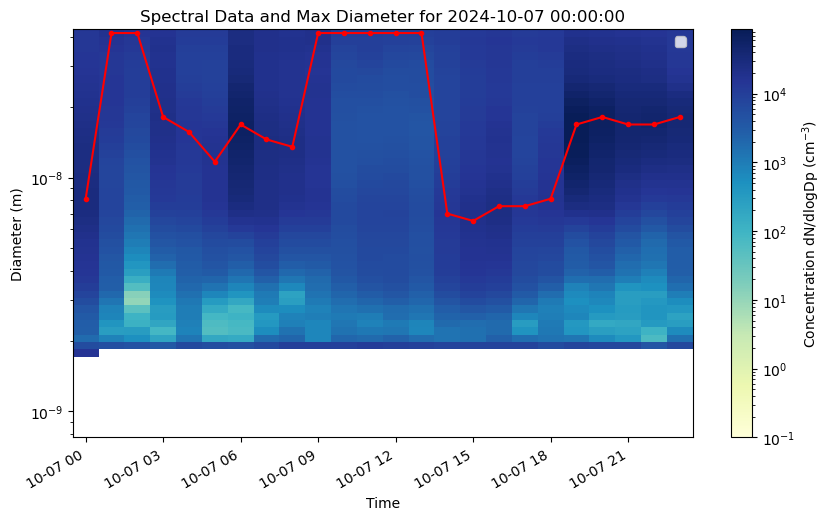

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


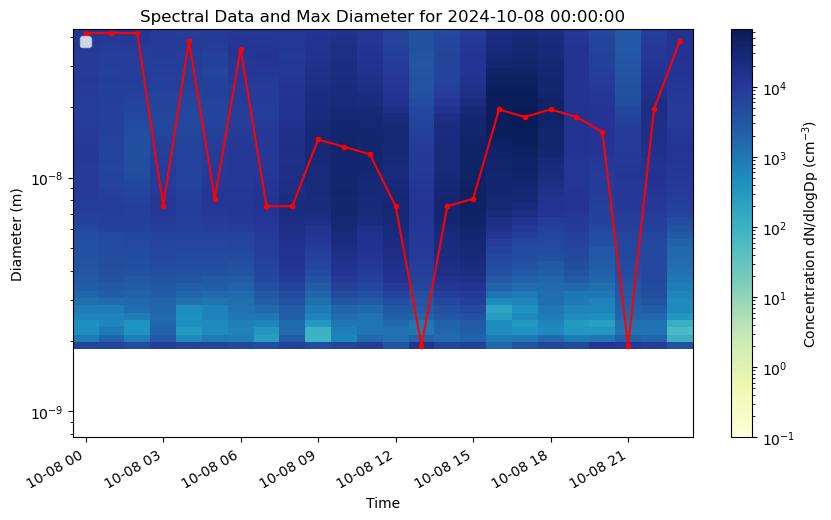

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


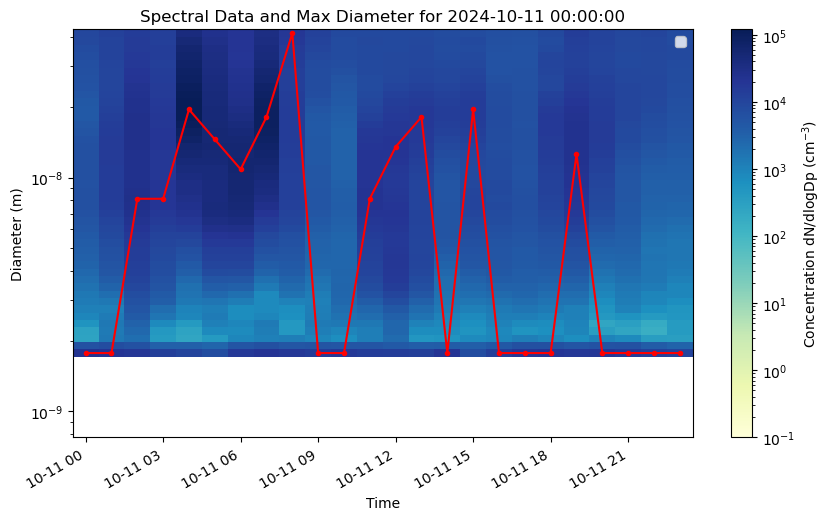

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


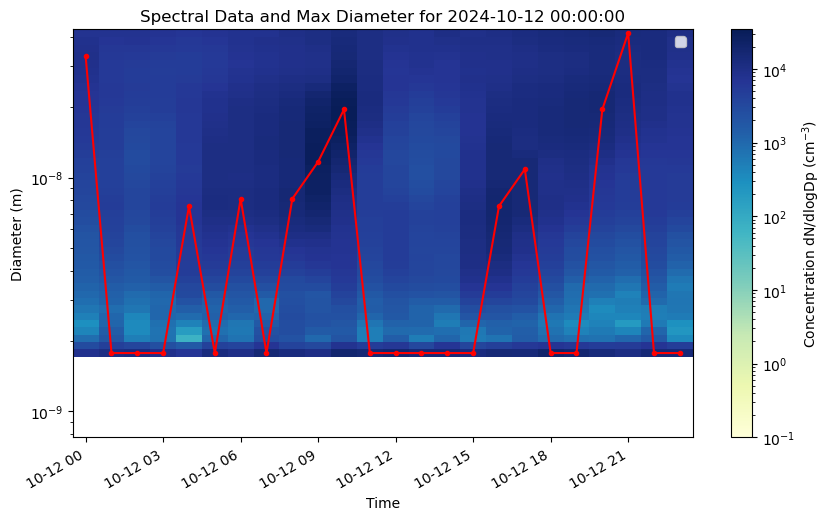

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


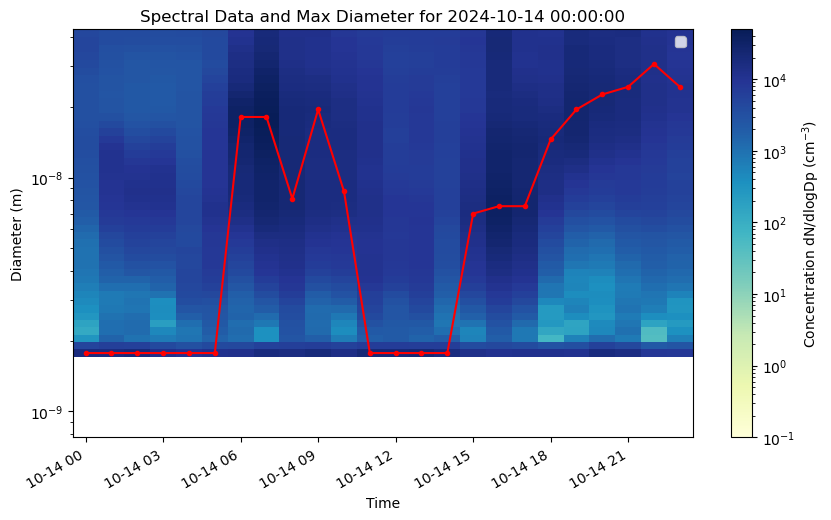

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


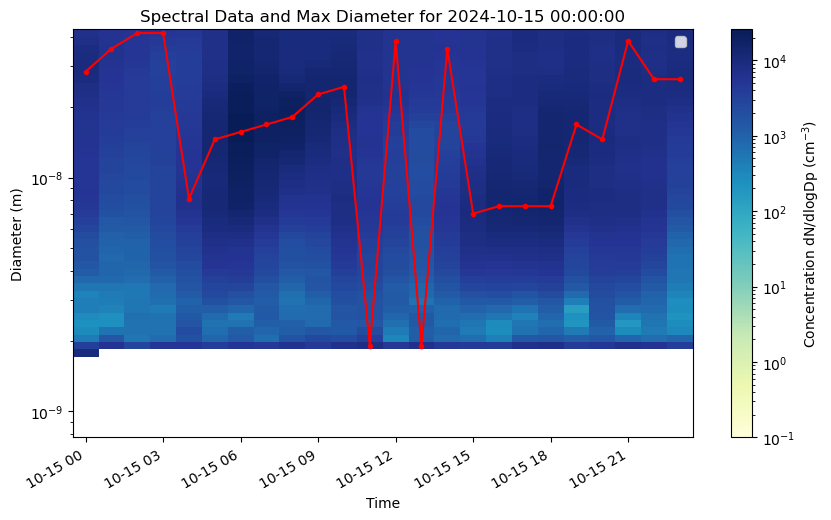

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


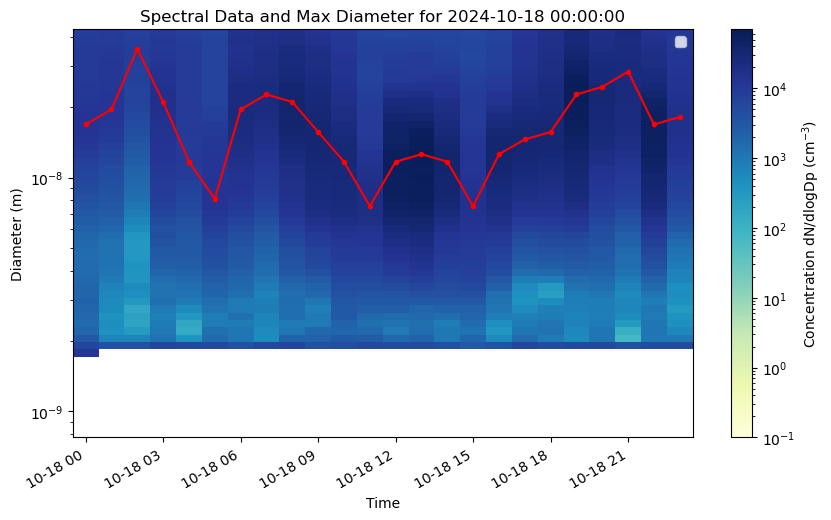

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


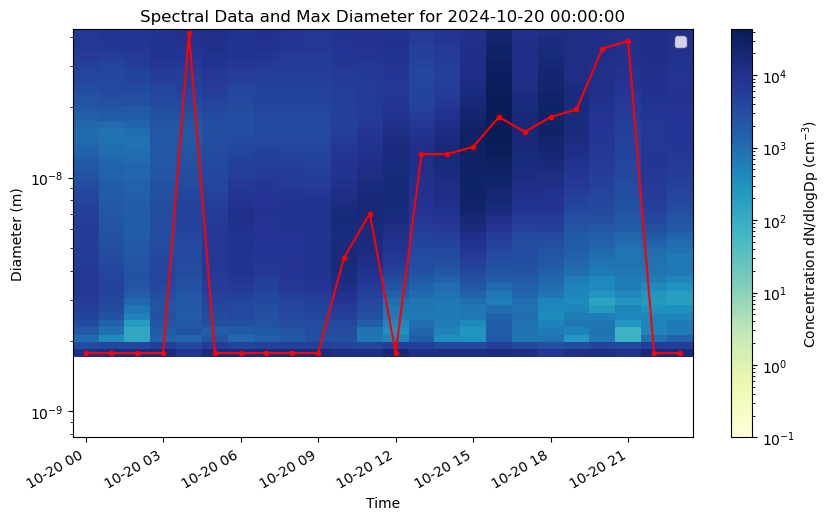

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


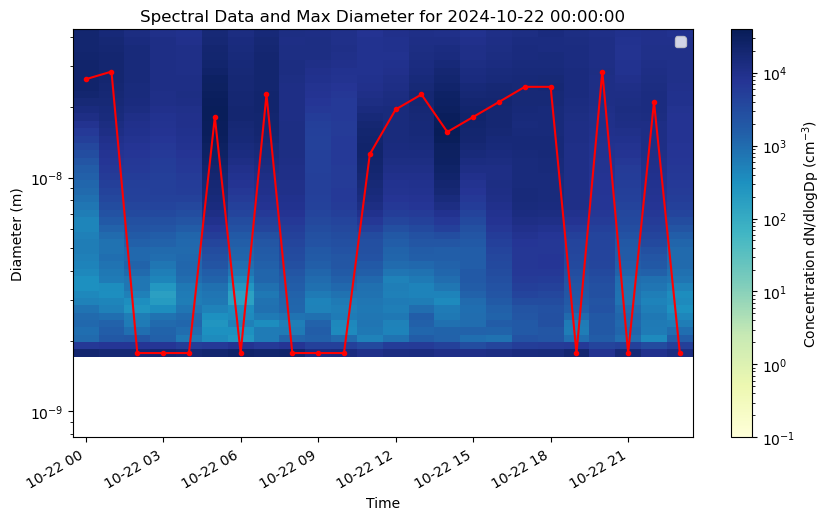

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


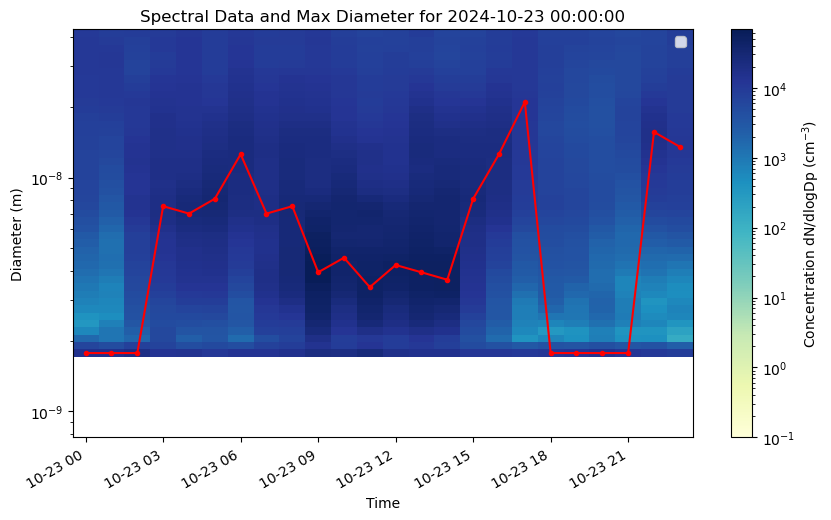

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


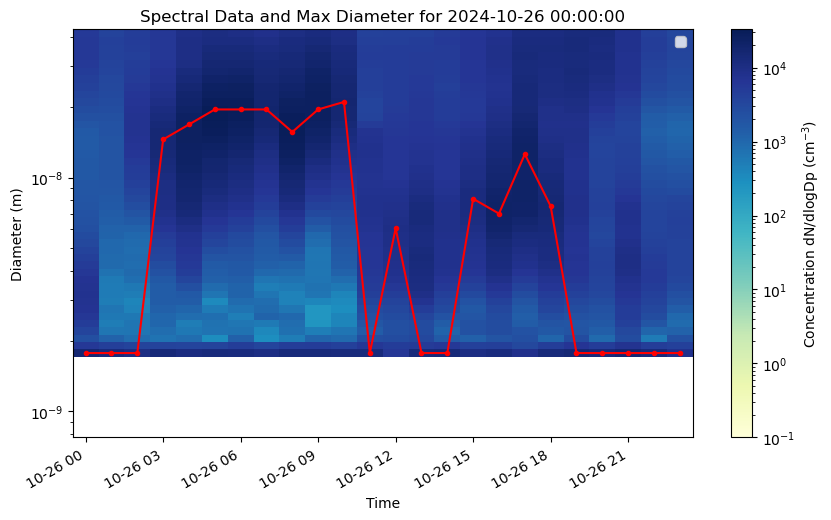

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


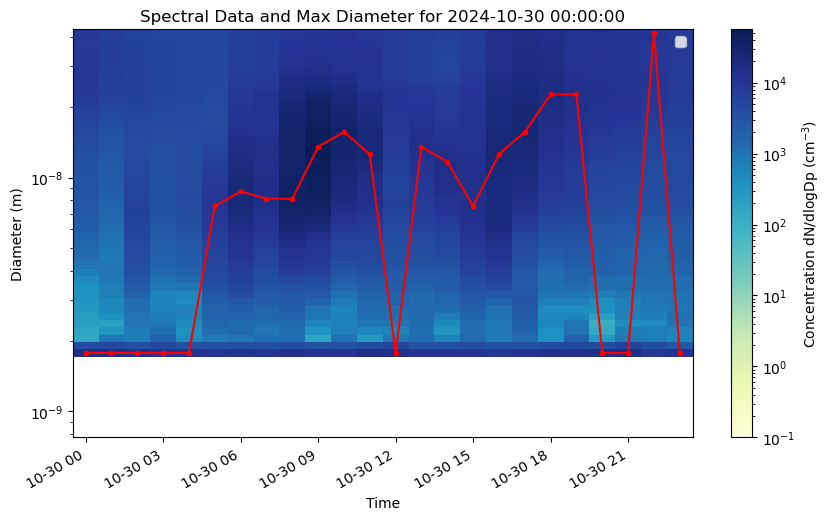

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


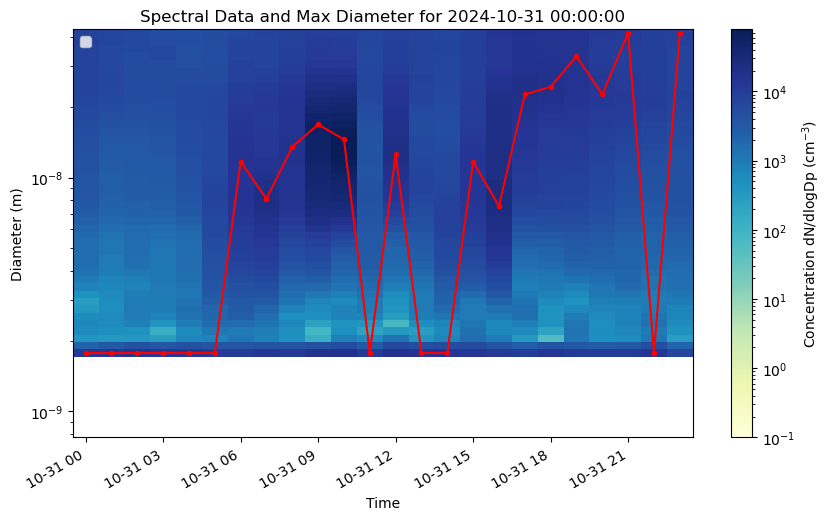

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


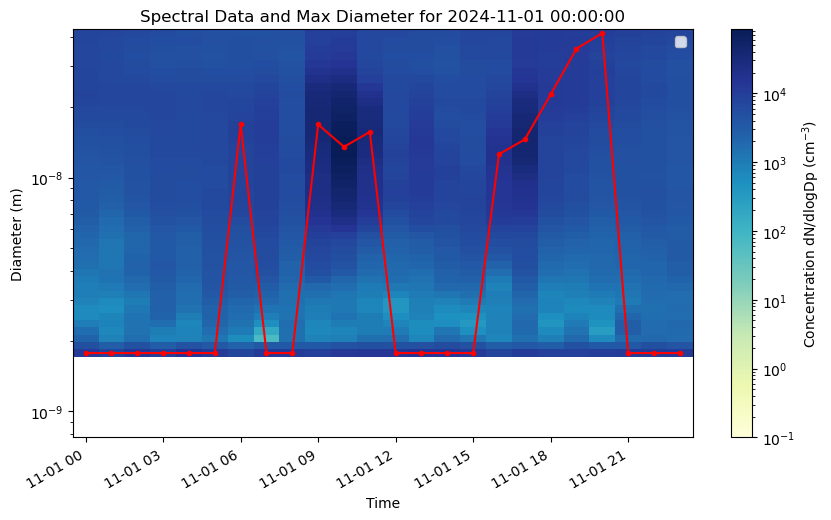

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


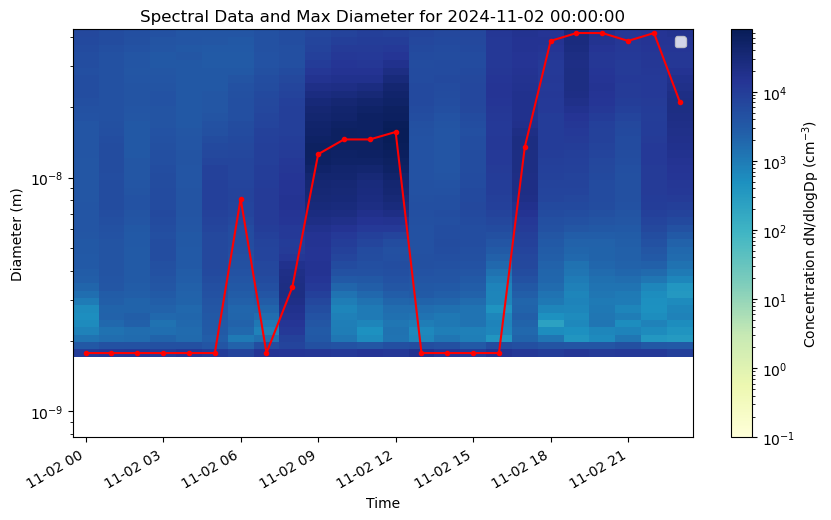

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


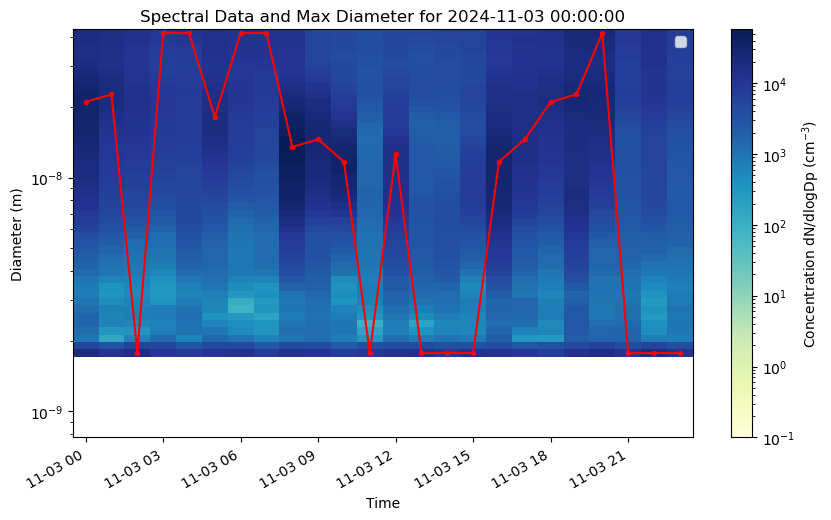

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


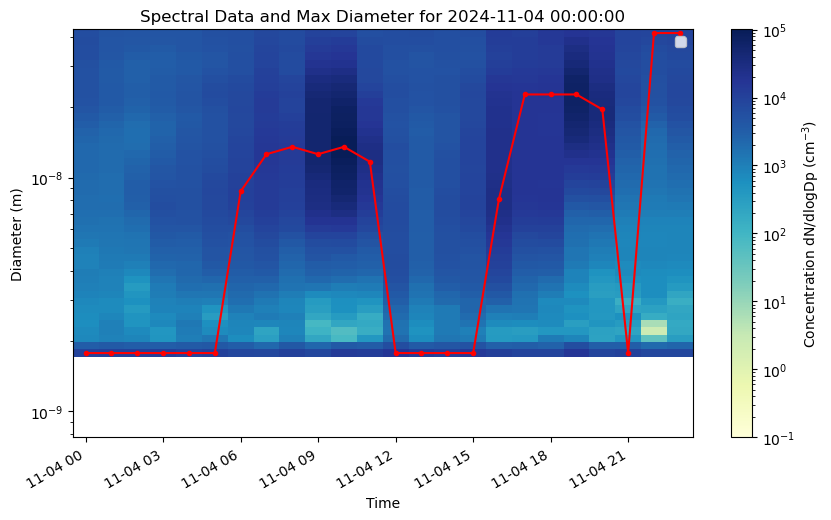

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


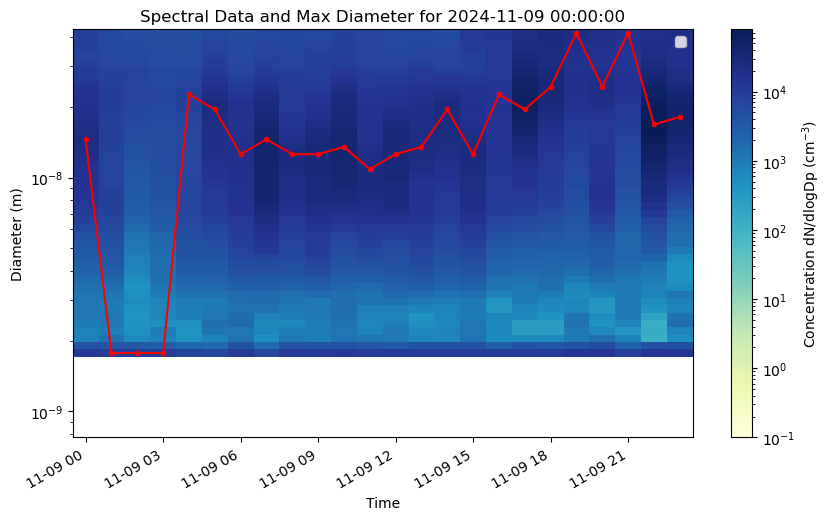

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


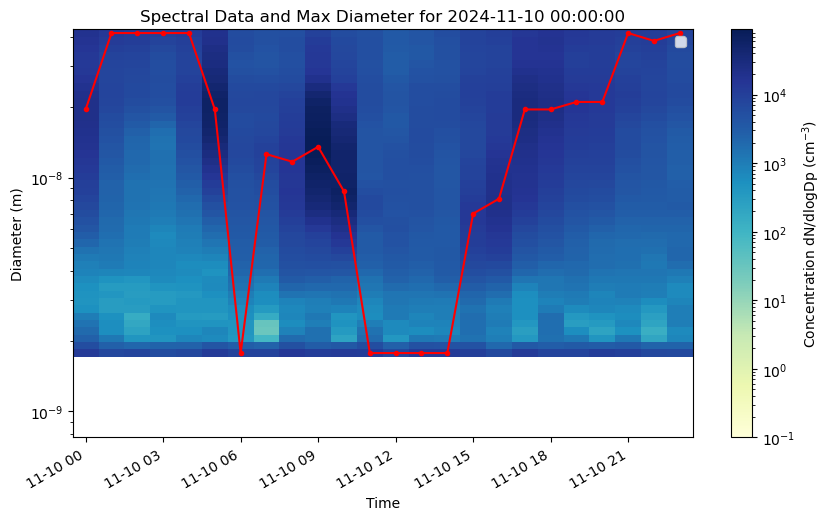

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


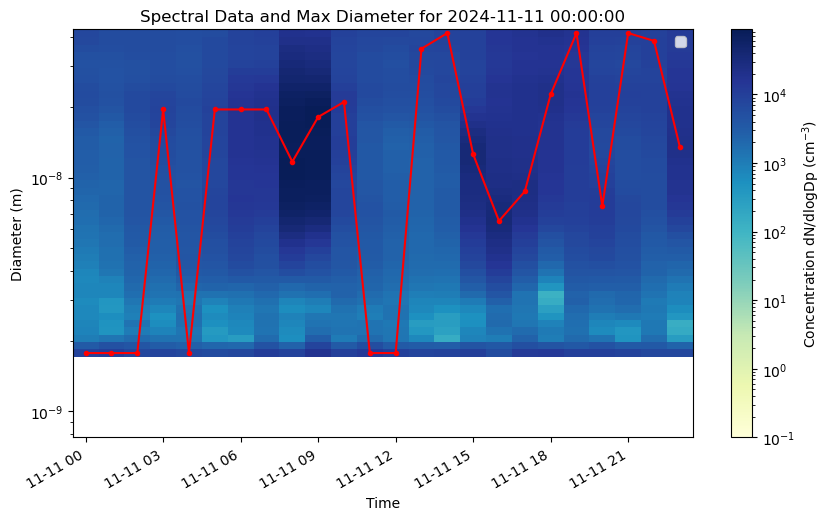

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


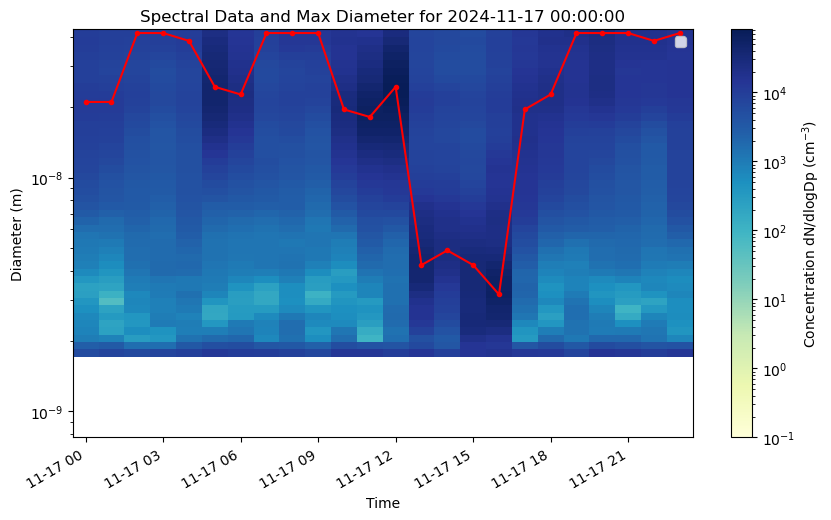

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


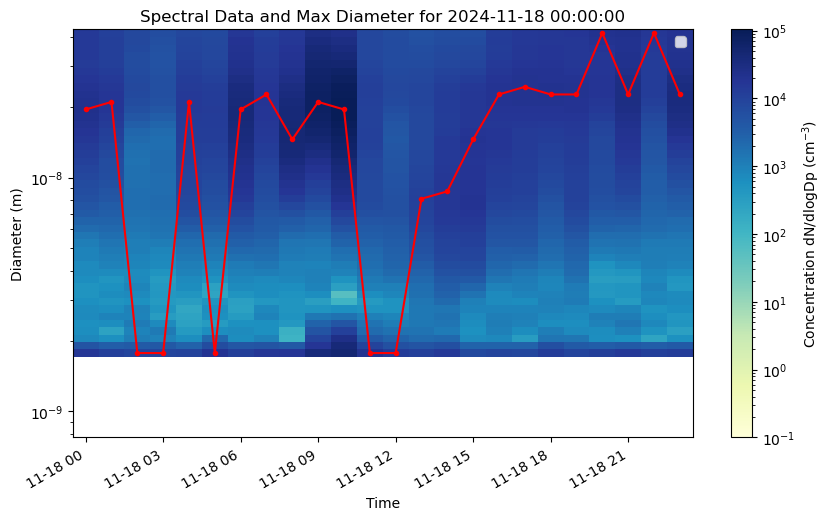

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


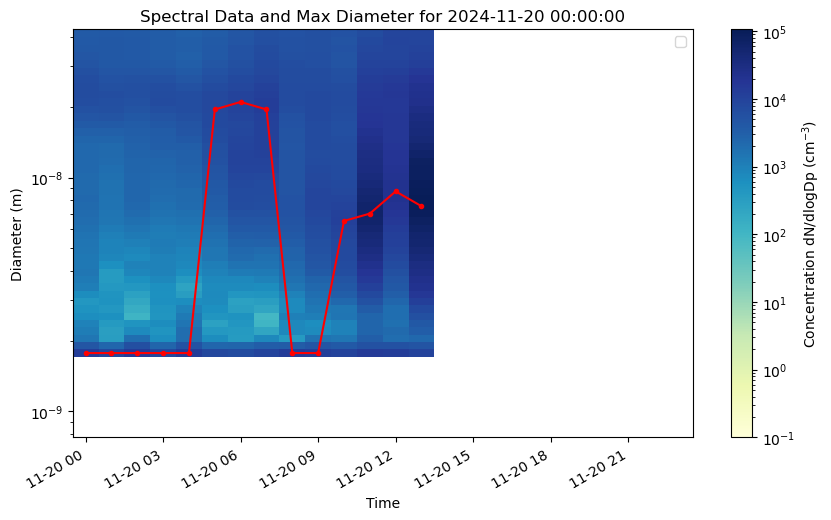

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


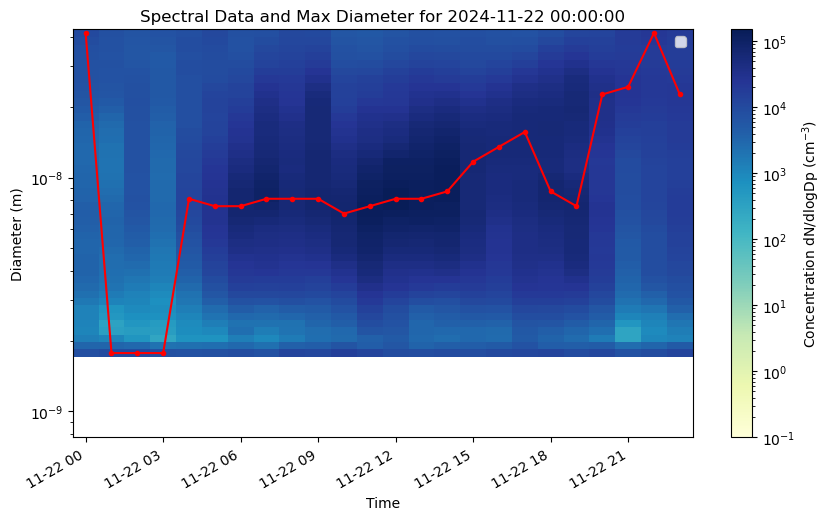

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


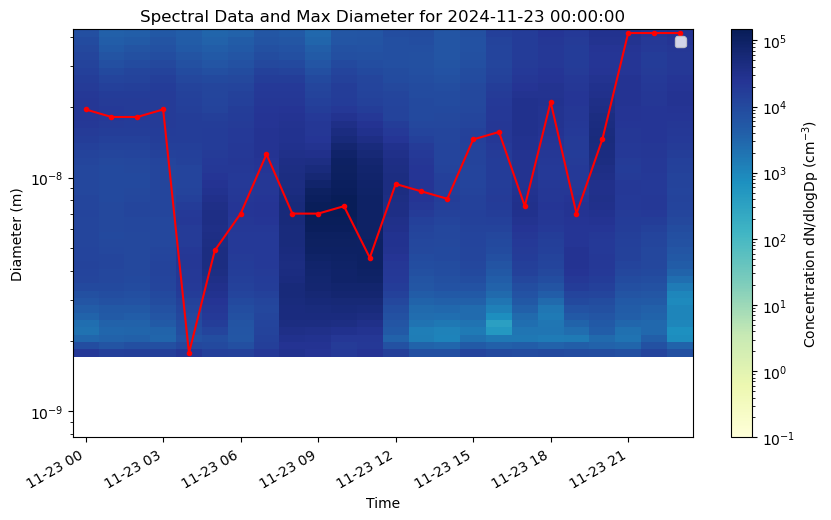

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


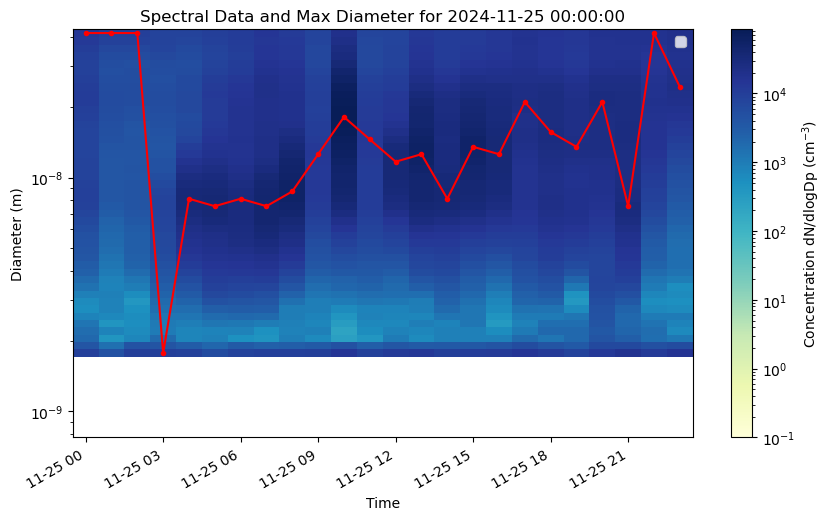

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


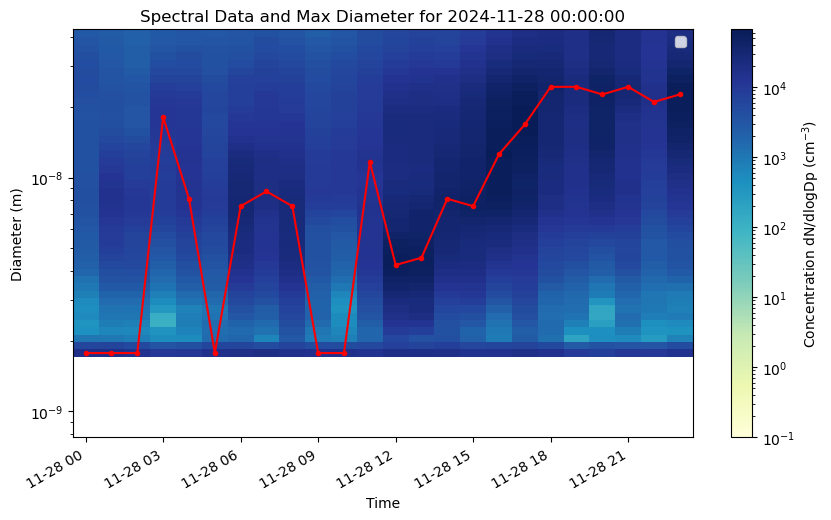

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


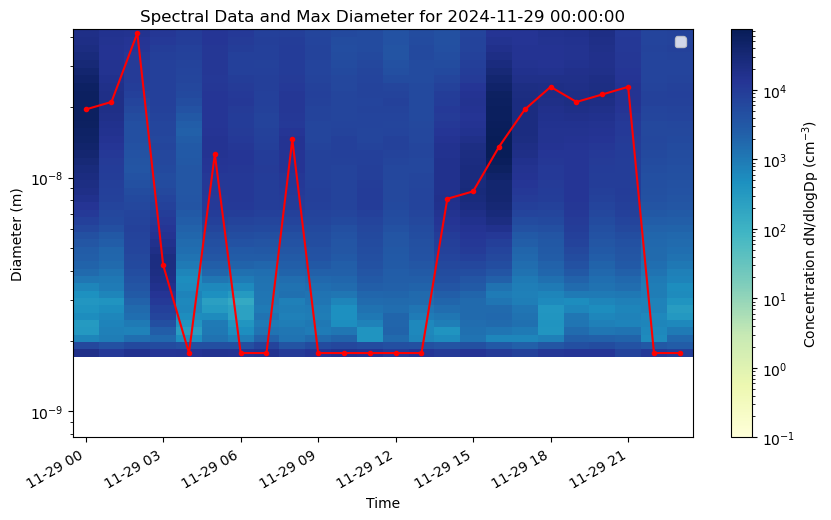

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


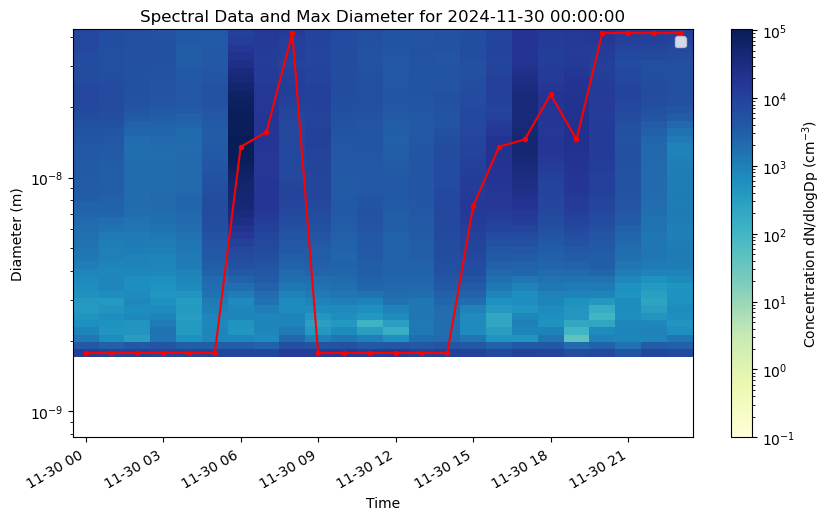

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


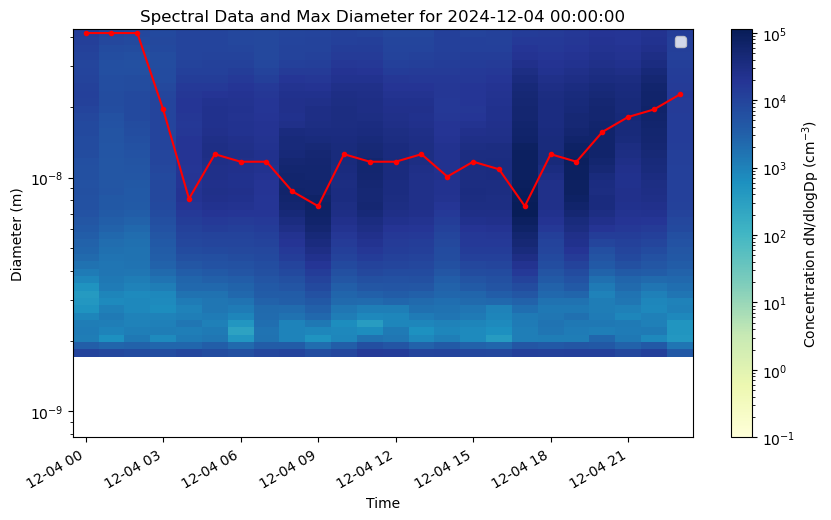

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


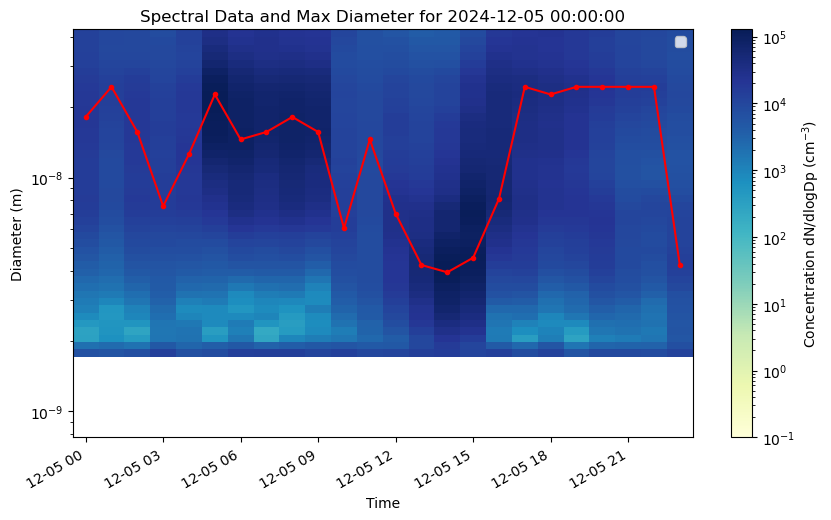

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


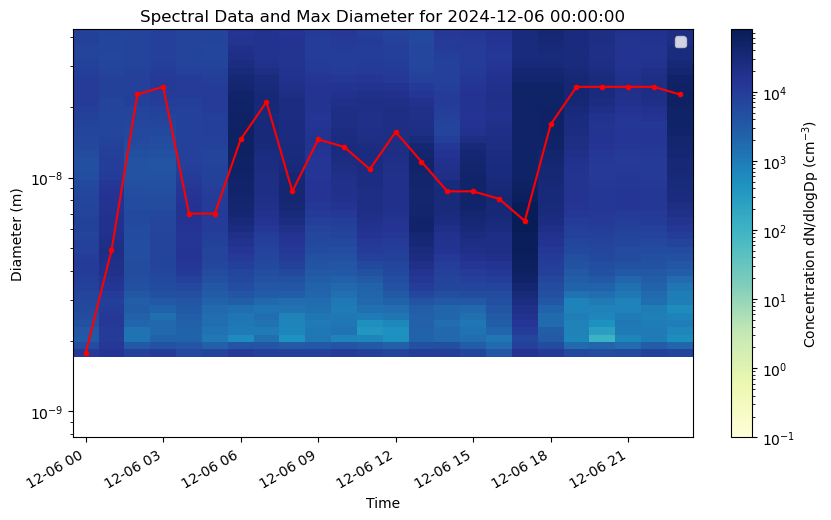

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


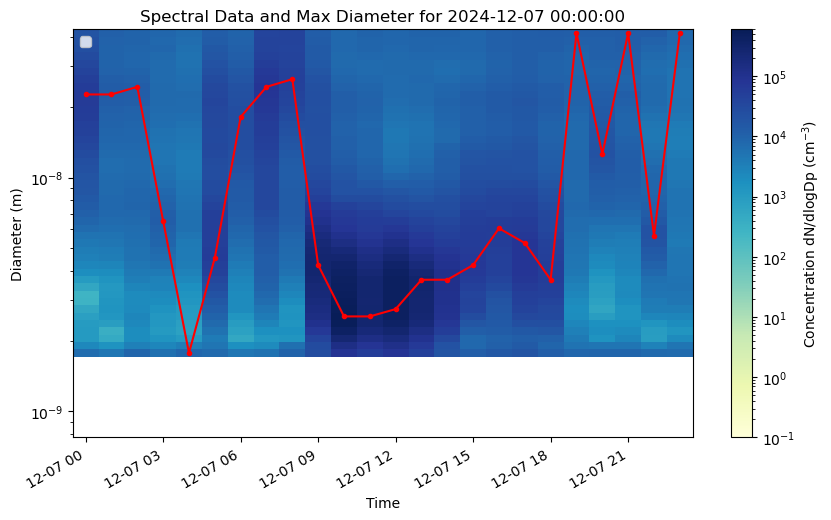

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


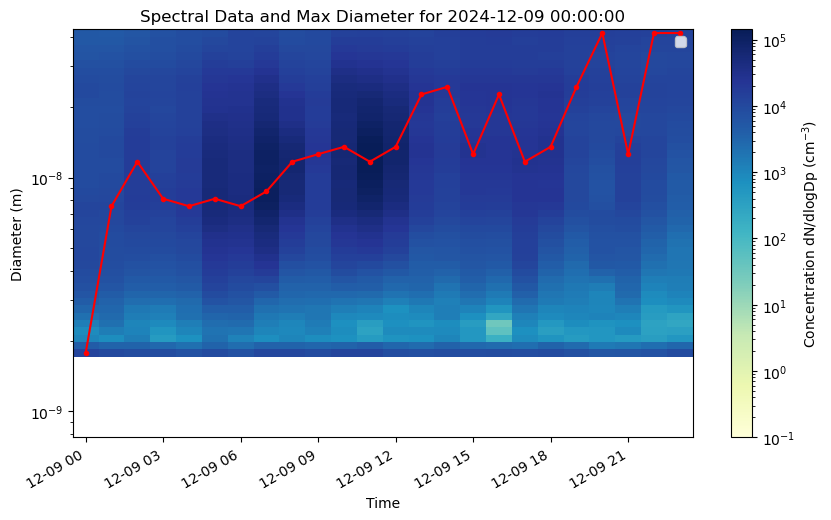

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


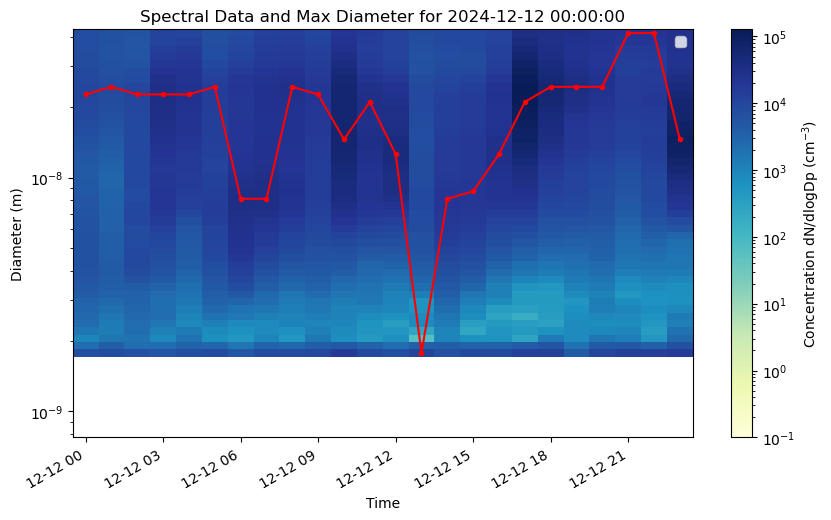

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


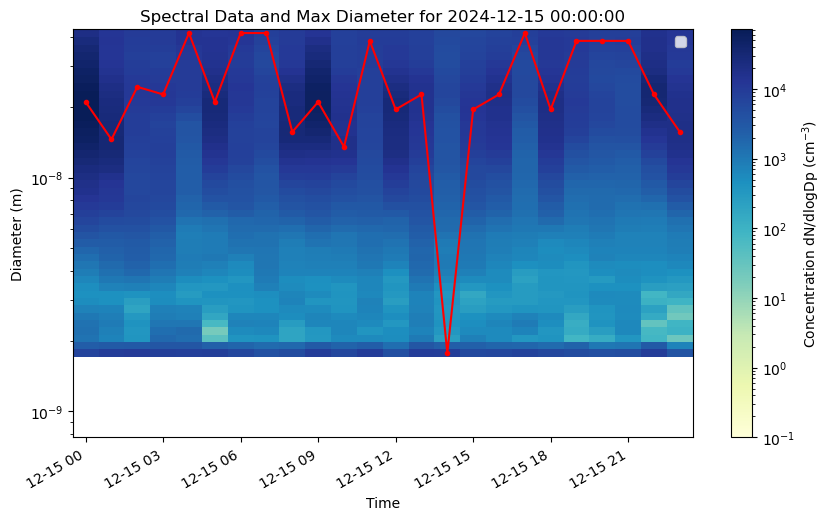

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


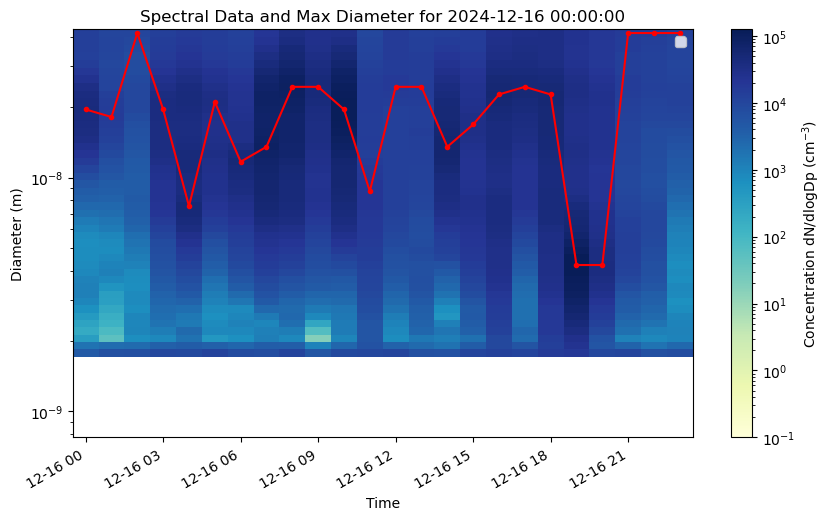

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


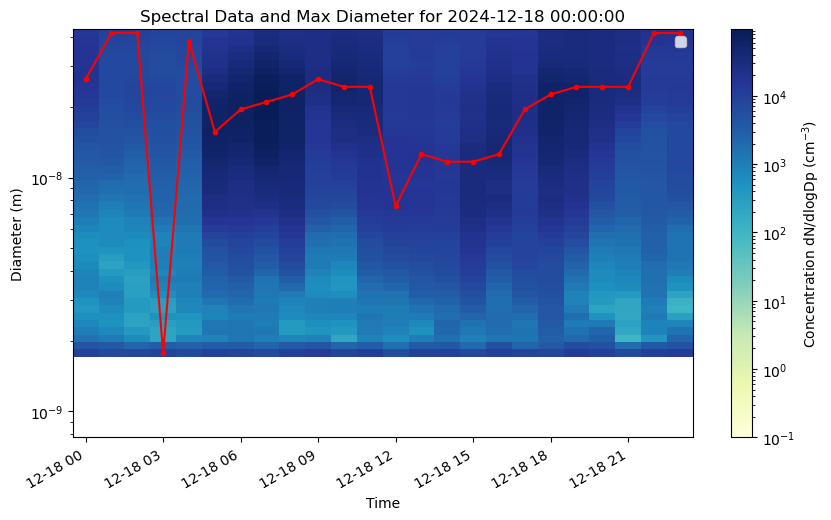

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


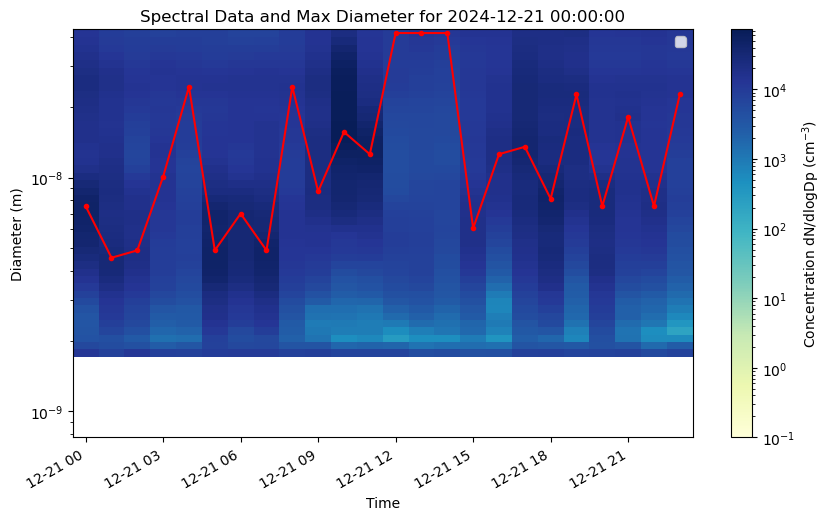

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


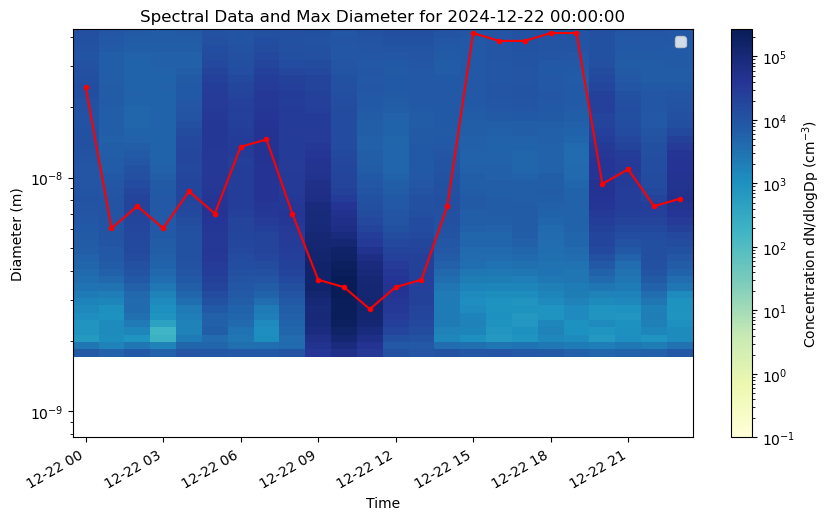

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


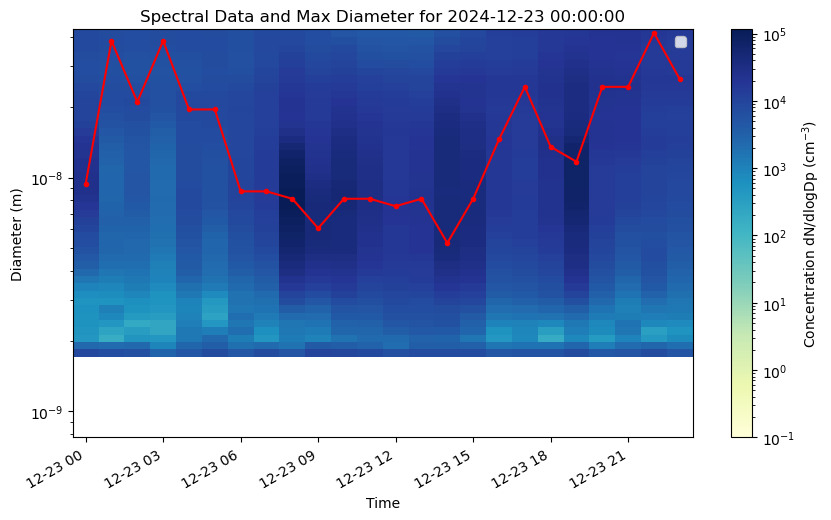

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


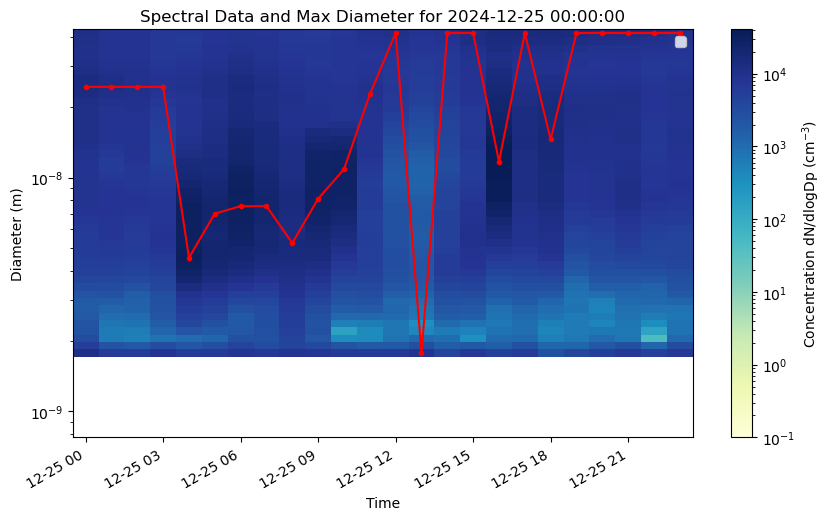

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


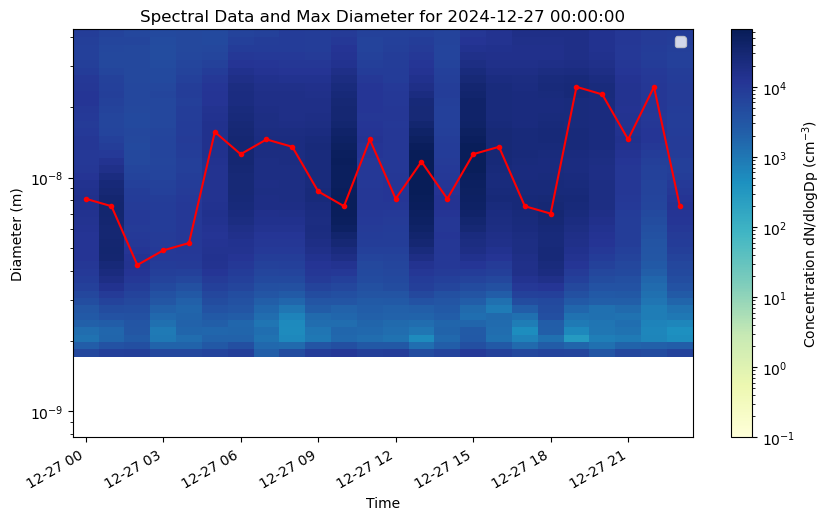

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


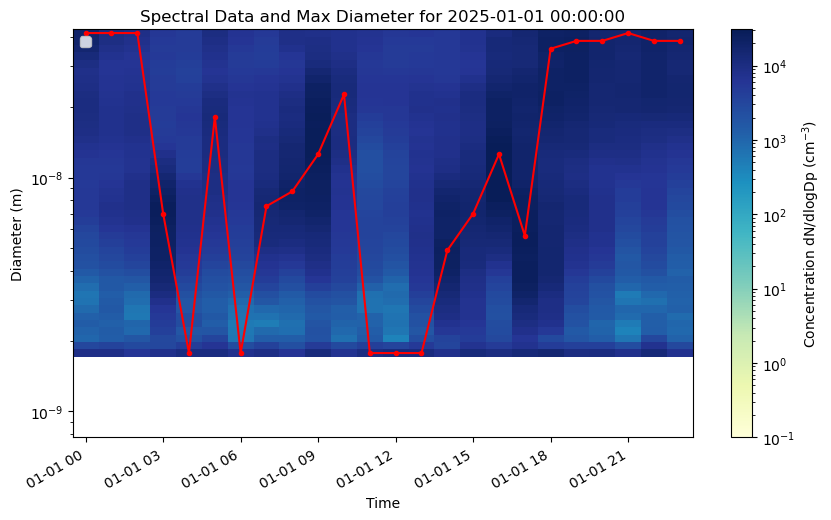

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


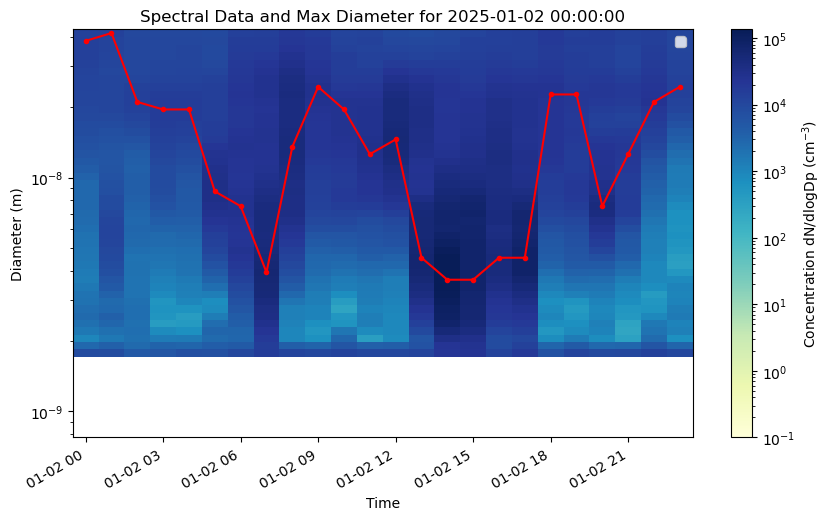

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


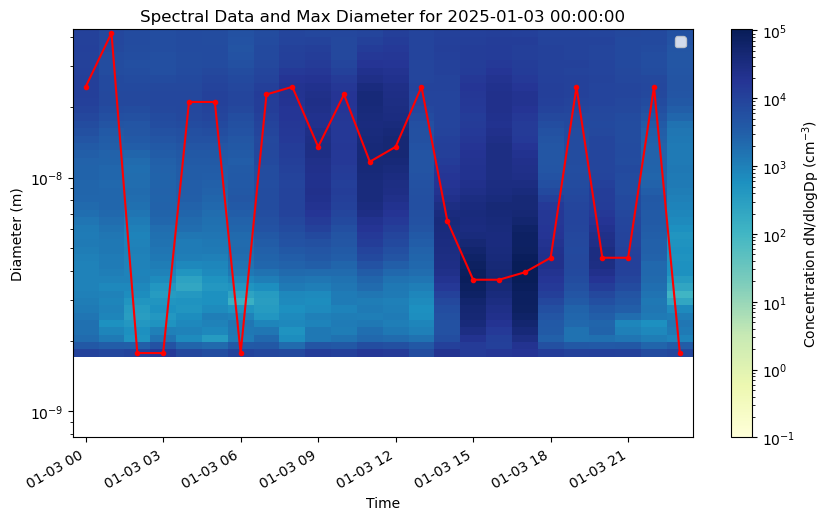

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


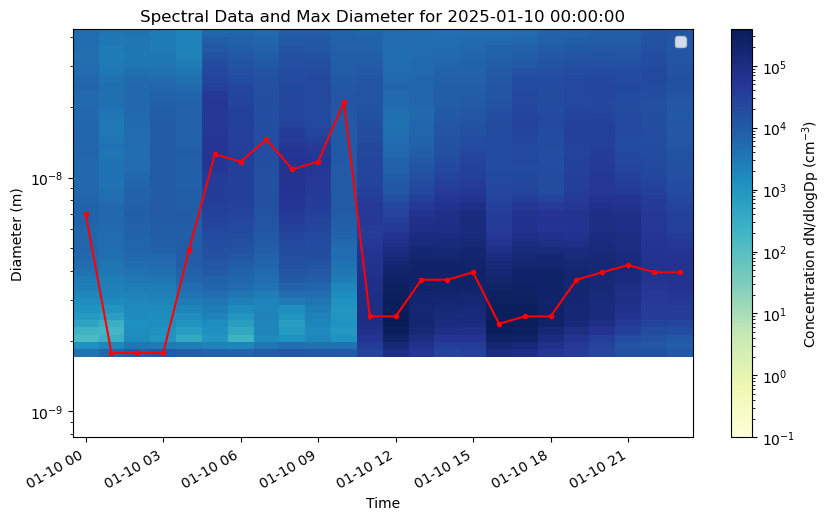

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


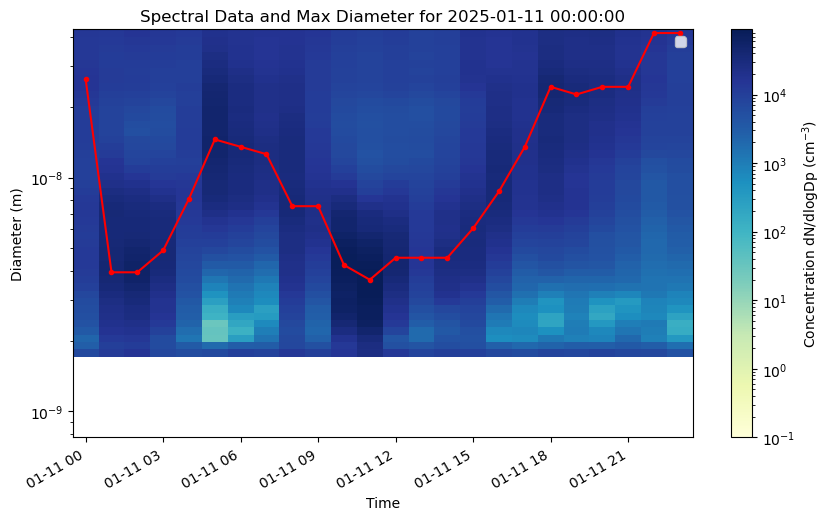

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


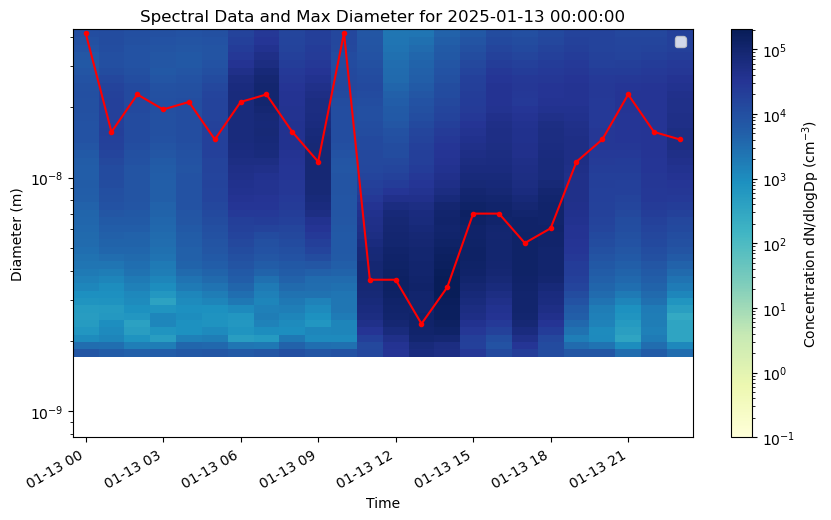

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


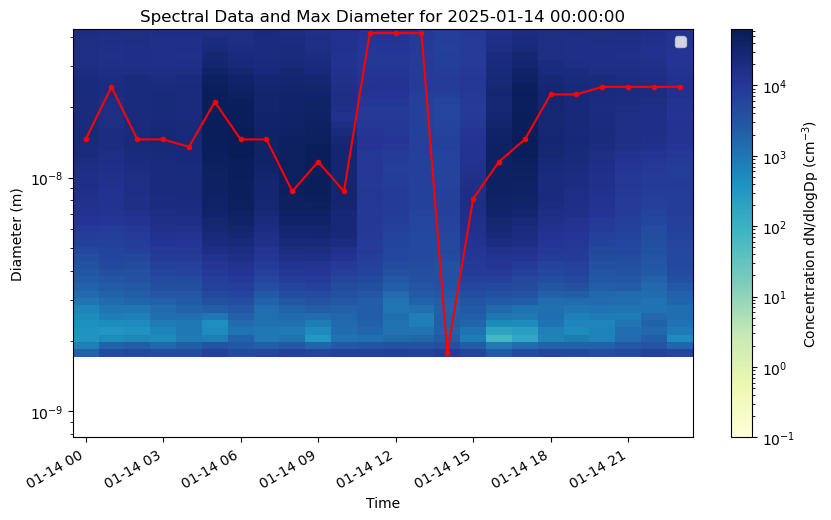

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


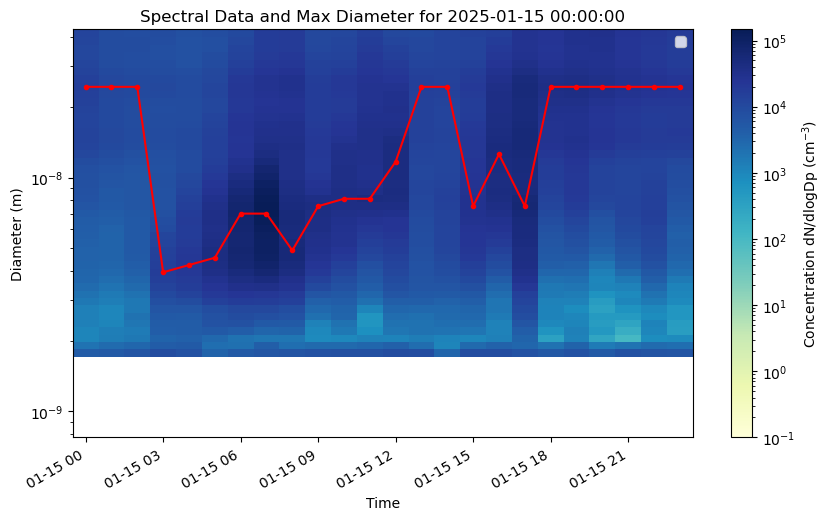

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


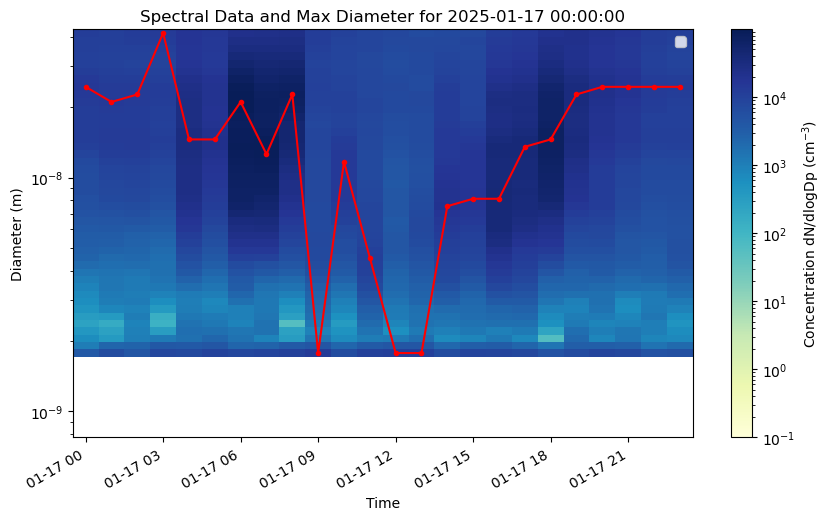

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


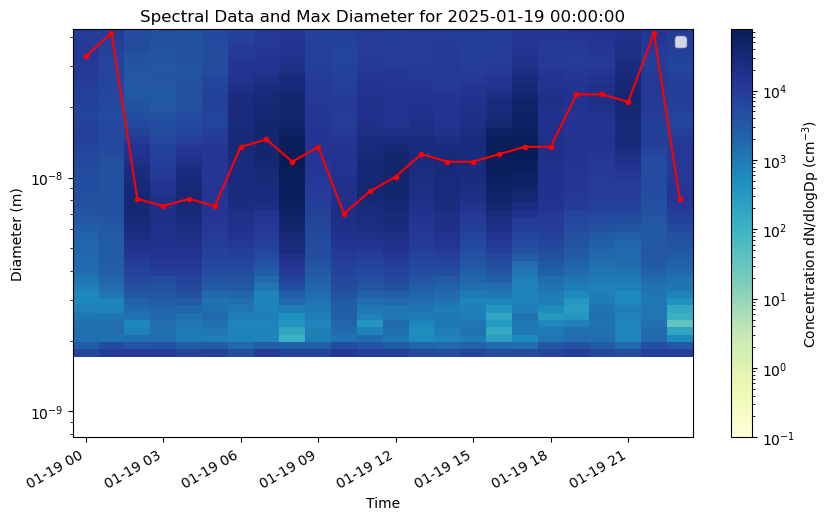

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


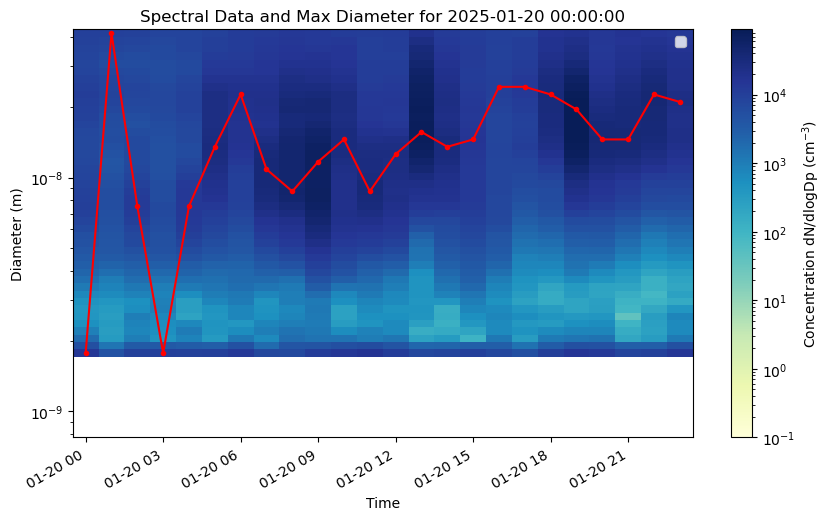

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


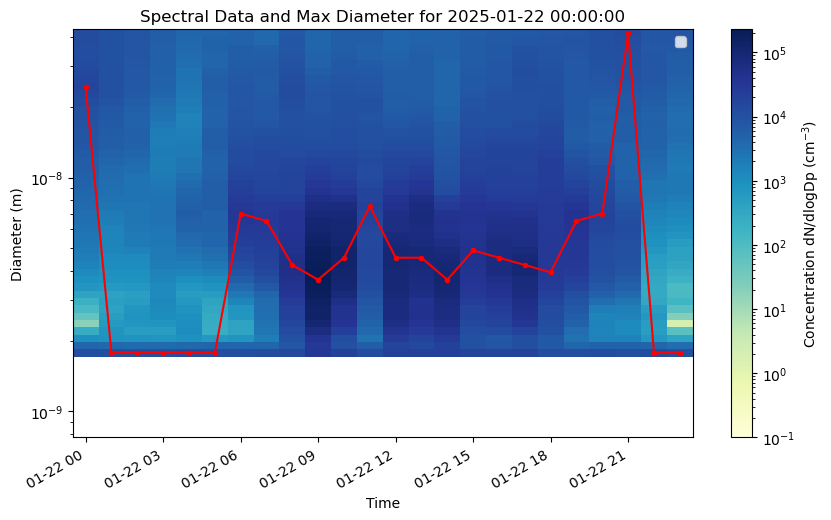

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


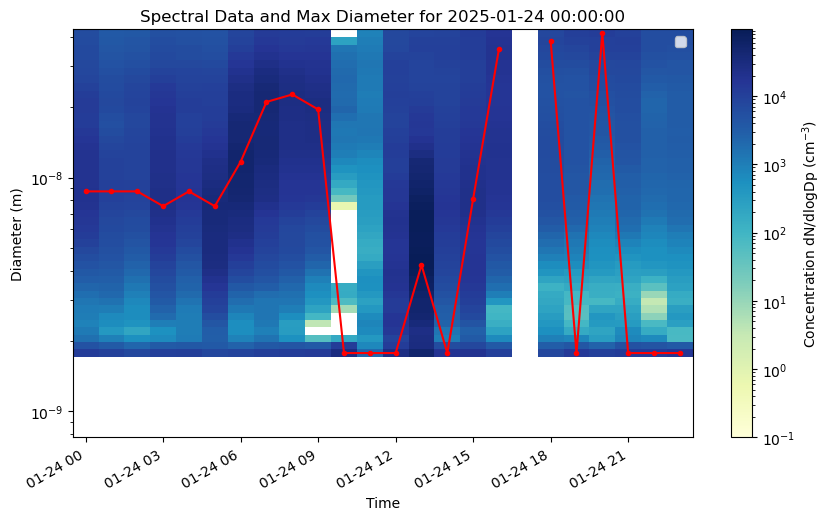

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


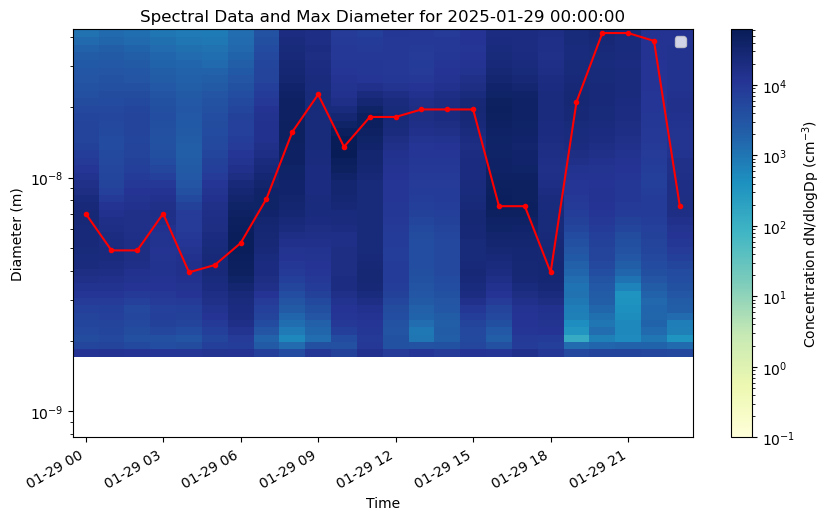

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


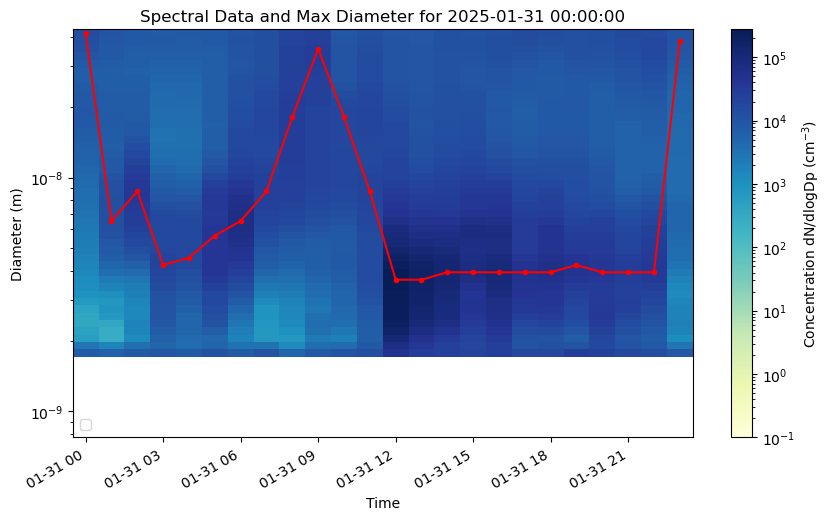

In [38]:

# =============================================================================
# Example workflow:
# Assume:
#   - `nais_neg_particles` is your original DataFrame (datetime index, columns as diameters)
#   - `result` is the DataFrame with max diameters (datetime index, column 'max_diameter')
#   - We want to plot only the days that are in nais_neg_particles.
# =============================================================================

for day in common_days:
    # Filter the spectral data for the current day
    day_mask = nais_neg_particles.index.normalize() == day
    day_df = nais_neg_particles.loc[day_mask]

    # Also filter the max diameters for the current day
    max_df_day = result.loc[day_mask]

    # Create a figure and axis for the day
    fig, ax = plt.subplots(figsize=(10, 6))
    title = f"Spectral Data and Max Diameter for {day}"
    
    # Plot the contour plot with superimposed max diameters
    plot_spectral_data(day_df, max_df_day, title, ax)
    
    # Improve formatting of the x-axis (date labels)
    fig.autofmt_xdate()
    plt.show()


In [40]:
filtered_periods['growth_rate (nm/h)'] = (filtered_periods['end_diameter'] - filtered_periods['start_diameter']) * 1e9/ filtered_periods['duration_hours']
filtered_periods

/tmp/ipykernel_39352/686542663.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_periods['growth_rate (nm/h)'] = (filtered_periods['end_diameter'] - filtered_periods['start_diameter']) * 1e9/ filtered_periods['duration_hours']


,day,start_time,end_time,start_diameter,end_diameter,duration_hours,growth_rate,growth_rate (nm/h)
5,2024-05-18,2024-05-18 06:00:00,2024-05-18 09:00:00,3.653771e-09,1.817175e-08,3.0,4.839325e-09,4.839325
6,2024-05-18,2024-05-18 10:00:00,2024-05-18 13:00:00,6.521920e-09,3.302483e-08,3.0,8.834304e-09,8.834304
7,2024-05-18,2024-05-18 18:00:00,2024-05-18 21:00:00,8.728472e-09,4.155270e-08,3.0,1.094141e-08,10.941409
39,2024-05-27,2024-05-27 08:00:00,2024-05-27 11:00:00,1.773835e-09,2.107146e-08,3.0,6.432540e-09,6.432540
56,2024-05-31,2024-05-31 11:00:00,2024-05-31 14:00:00,8.115174e-09,2.841614e-08,3.0,6.766989e-09,6.766989
...,...,...,...,...,...,...,...,...
1357,2025-01-20,2025-01-20 03:00:00,2025-01-20 06:00:00,1.773835e-09,2.268812e-08,3.0,6.971429e-09,6.971429
1370,2025-01-22,2025-01-22 18:00:00,2025-01-22 21:00:00,3.931458e-09,4.155270e-08,3.0,1.254041e-08,12.540414
1380,2025-01-24,2025-01-24 05:00:00,2025-01-24 08:00:00,7.542927e-09,2.268812e-08,3.0,5.048398e-09,5.048398
1413,2025-01-29,2025-01-29 04:00:00,2025-01-29 09:00:00,3.931458e-09,2.268812e-08,5.0,3.751333e-09,3.751333


In [41]:
# List to hold the increasing periods with all desired metrics
periods = []

# Group by day using pd.Grouper
for day, group in result.groupby(pd.Grouper(freq='D')):
    group = group.sort_index()  # ensure data is in time order
    # Series for max diameter and concentration
    s_diam = group['max_diameter_numeric']
    s_conc = group['max_concentration']
    
    run_start = None  # placeholder for the start of an increasing period
    
    # Loop over the series (starting from the second time point)
    for i in range(1, len(s_diam)):
        if s_diam.iloc[i] > s_diam.iloc[i-1]:
            # Mark the start if not already marked
            if run_start is None:
                run_start = s_diam.index[i-1]
        else:
            if run_start is not None:
                run_end = s_diam.index[i-1]
                # Calculate the duration in hours
                duration_hours = (run_end - run_start).total_seconds() / 3600.0
                
                # Get the start and end concentration values
                start_conc = s_conc.loc[run_start]
                end_conc = s_conc.loc[run_end]
                
                # Compute dN/dt
                dN_dt = (end_conc - start_conc) / duration_hours
                
                periods.append({
                    "day": day.date(),
                    "start_time": run_start,
                    "end_time": run_end,
                    "start_diameter": s_diam.loc[run_start],
                    "end_diameter": s_diam.loc[run_end],
                    "start_concentration": start_conc,
                    "end_concentration": end_conc,
                    "duration_hours": duration_hours,
                    "dN_dt": dN_dt
                })
                run_start = None  # reset for next potential period
    
    # If the day ends while a run is active, record it as well
    if run_start is not None:
        run_end = s_diam.index[-1]
        duration_hours = (run_end - run_start).total_seconds() / 3600.0
        start_conc = s_conc.loc[run_start]
        end_conc = s_conc.loc[run_end]
        dN_dt = (end_conc - start_conc) / duration_hours
        periods.append({
            "day": day.date(),
            "start_time": run_start,
            "end_time": run_end,
            "start_diameter": s_diam.loc[run_start],
            "end_diameter": s_diam.loc[run_end],
            "start_concentration": start_conc,
            "end_concentration": end_conc,
            "duration_hours": duration_hours,
            "dN_dt": dN_dt
        })

# Convert the list of periods into a DataFrame
filtered_periods = pd.DataFrame(periods)

# Optionally, filter to only those periods with duration > 3 hours
filtered_periods = filtered_periods[filtered_periods['duration_hours'] >= 3]

filtered_periods


,day,start_time,end_time,start_diameter,end_diameter,start_concentration,end_concentration,duration_hours,dN_dt
5,2024-05-18,2024-05-18 06:00:00,2024-05-18 09:00:00,3.653771e-09,1.817175e-08,2851.018359,2084.577560,3.0,-255.480266
6,2024-05-18,2024-05-18 10:00:00,2024-05-18 13:00:00,6.521920e-09,3.302483e-08,1896.887810,1002.069143,3.0,-298.272889
7,2024-05-18,2024-05-18 18:00:00,2024-05-18 21:00:00,8.728472e-09,4.155270e-08,1088.069211,334.804196,3.0,-251.088339
39,2024-05-27,2024-05-27 08:00:00,2024-05-27 11:00:00,1.773835e-09,2.107146e-08,938.299341,1512.393998,3.0,191.364885
56,2024-05-31,2024-05-31 11:00:00,2024-05-31 14:00:00,8.115174e-09,2.841614e-08,1225.649125,845.505973,3.0,-126.714384
...,...,...,...,...,...,...,...,...,...
1357,2025-01-20,2025-01-20 03:00:00,2025-01-20 06:00:00,1.773835e-09,2.268812e-08,298.993798,651.274635,3.0,117.426946
1370,2025-01-22,2025-01-22 18:00:00,2025-01-22 21:00:00,3.931458e-09,4.155270e-08,960.090181,429.774184,3.0,-176.771999
1380,2025-01-24,2025-01-24 05:00:00,2025-01-24 08:00:00,7.542927e-09,2.268812e-08,1187.700162,910.374136,3.0,-92.442009
1413,2025-01-29,2025-01-29 04:00:00,2025-01-29 09:00:00,3.931458e-09,2.268812e-08,460.890603,772.527328,5.0,62.327345


In [42]:
filtered_periods['growth_rate (nm/h)'] = (filtered_periods['end_diameter'] - filtered_periods['start_diameter']) * 1e9/ filtered_periods['duration_hours']
filtered_periods

,day,start_time,end_time,start_diameter,end_diameter,start_concentration,end_concentration,duration_hours,dN_dt,growth_rate (nm/h)
5,2024-05-18,2024-05-18 06:00:00,2024-05-18 09:00:00,3.653771e-09,1.817175e-08,2851.018359,2084.577560,3.0,-255.480266,4.839325
6,2024-05-18,2024-05-18 10:00:00,2024-05-18 13:00:00,6.521920e-09,3.302483e-08,1896.887810,1002.069143,3.0,-298.272889,8.834304
7,2024-05-18,2024-05-18 18:00:00,2024-05-18 21:00:00,8.728472e-09,4.155270e-08,1088.069211,334.804196,3.0,-251.088339,10.941409
39,2024-05-27,2024-05-27 08:00:00,2024-05-27 11:00:00,1.773835e-09,2.107146e-08,938.299341,1512.393998,3.0,191.364885,6.432540
56,2024-05-31,2024-05-31 11:00:00,2024-05-31 14:00:00,8.115174e-09,2.841614e-08,1225.649125,845.505973,3.0,-126.714384,6.766989
...,...,...,...,...,...,...,...,...,...,...
1357,2025-01-20,2025-01-20 03:00:00,2025-01-20 06:00:00,1.773835e-09,2.268812e-08,298.993798,651.274635,3.0,117.426946,6.971429
1370,2025-01-22,2025-01-22 18:00:00,2025-01-22 21:00:00,3.931458e-09,4.155270e-08,960.090181,429.774184,3.0,-176.771999,12.540414
1380,2025-01-24,2025-01-24 05:00:00,2025-01-24 08:00:00,7.542927e-09,2.268812e-08,1187.700162,910.374136,3.0,-92.442009,5.048398
1413,2025-01-29,2025-01-29 04:00:00,2025-01-29 09:00:00,3.931458e-09,2.268812e-08,460.890603,772.527328,5.0,62.327345,3.751333


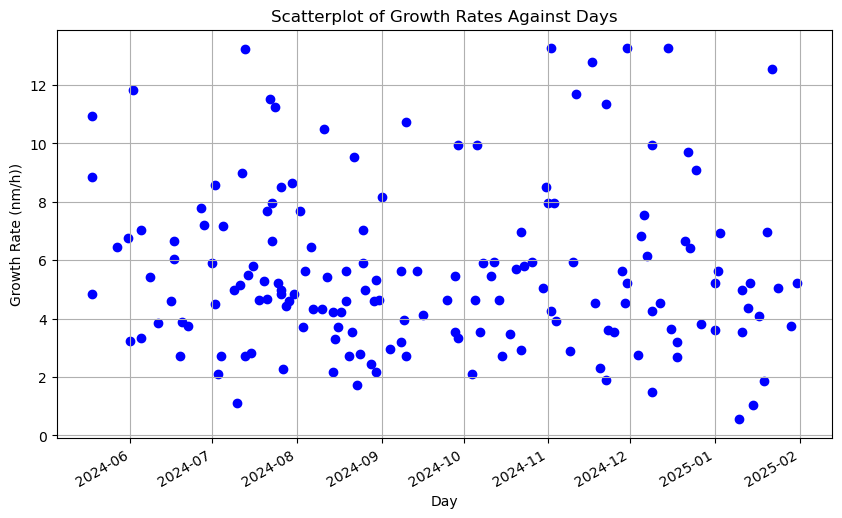

In [44]:
import matplotlib.pyplot as plt

# Create a new figure with a specified size
plt.figure(figsize=(10, 6))

# Plot a scatterplot of the growth rates (dN_dt) vs. day
plt.scatter(filtered_periods['day'], filtered_periods['growth_rate (nm/h)'], color='blue', marker='o')

# Set plot labels and title
plt.xlabel('Day')
plt.ylabel('Growth Rate (nm/h))')
plt.title('Scatterplot of Growth Rates Against Days')

# Optional: improve formatting for date on x-axis if needed
plt.gcf().autofmt_xdate()

# Add a grid for easier visualization
plt.grid(True)

# Display the plot
plt.show()


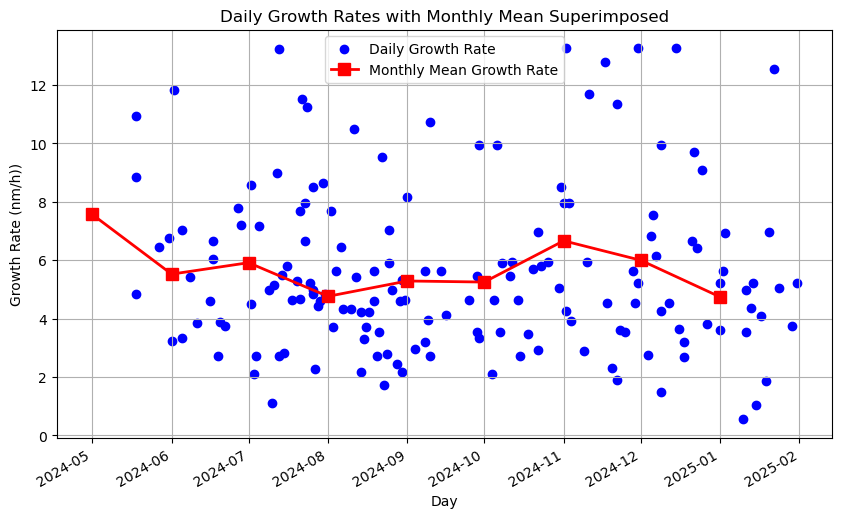

In [46]:
# Ensure the 'day' column is a datetime type (if it's not already)
filtered_periods['day'] = pd.to_datetime(filtered_periods['day'])

# Compute monthly means of the growth rate .
# We group by month using the dt.to_period('M') accessor and then convert the period back to a timestamp.
monthly_means = filtered_periods.groupby(filtered_periods['day'].dt.to_period('M'))['growth_rate (nm/h)'].mean()
monthly_means.index = monthly_means.index.to_timestamp()

# Create the scatterplot for the daily growth rates.
plt.figure(figsize=(10, 6))
plt.scatter(filtered_periods['day'], filtered_periods['growth_rate (nm/h)'], color='blue', marker='o', label='Daily Growth Rate')

# Superimpose the monthly mean values.
plt.plot(monthly_means.index, monthly_means, color='red', marker='s', linestyle='-', 
         linewidth=2, markersize=8, label='Monthly Mean Growth Rate')

# Set plot labels and title
plt.xlabel('Day')
plt.ylabel('Growth Rate (nm/h))')
plt.title('Daily Growth Rates with Monthly Mean Superimposed')

# Format the x-axis for dates
plt.gcf().autofmt_xdate()
plt.grid(True)
plt.legend()

plt.show()


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


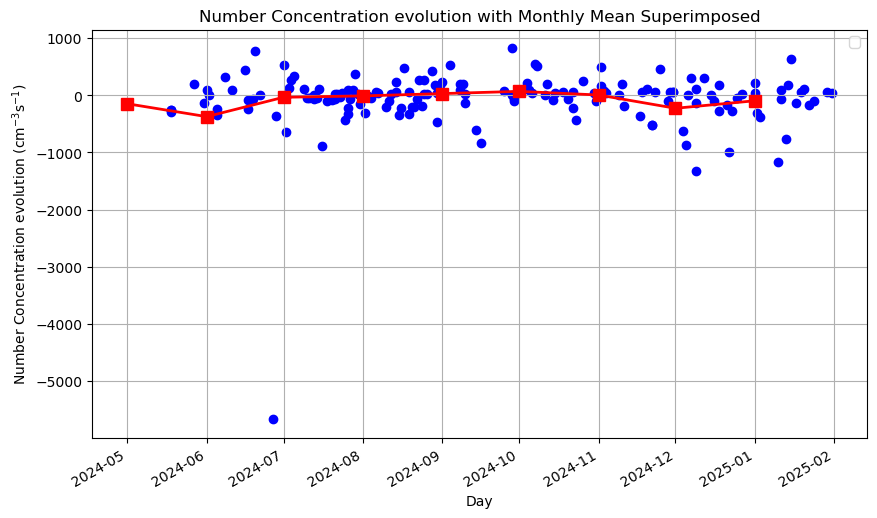

In [ ]:
# Ensure the 'day' column is a datetime type (if it's not already)
filtered_periods['day'] = pd.to_datetime(filtered_periods['day'])

# Compute monthly means of the growth rate .
# We group by month using the dt.to_period('M') accessor and then convert the period back to a timestamp.
monthly_means = filtered_periods.groupby(filtered_periods['day'].dt.to_period('M'))['dN_dt'].mean()
monthly_means.index = monthly_means.index.to_timestamp()

# Create the scatterplot for the daily growth rates.
plt.figure(figsize=(10, 6))
plt.scatter(filtered_periods['day'], filtered_periods['dN_dt'], color='blue', marker='o')

# Superimpose the monthly mean values.
plt.plot(monthly_means.index, monthly_means, color='red', marker='s', linestyle='-', 
         linewidth=2, markersize=8)

# Set plot labels and title
plt.xlabel('Day')
plt.ylabel('Number Concentration evolution (cm$^{-3}$h$^{-1}$)')
plt.title('Number Concentration evolution with Monthly Mean Superimposed')

# Format the x-axis for dates
plt.gcf().autofmt_xdate()
plt.grid(True)
plt.legend()

plt.show()


In [49]:
# Identify periods where dN/dt is positive
filtered_periods[filtered_periods['dN_dt'] > 0]


,day,start_time,end_time,start_diameter,end_diameter,start_concentration,end_concentration,duration_hours,dN_dt,growth_rate (nm/h)
39,2024-05-27,2024-05-27 08:00:00,2024-05-27 11:00:00,1.773835e-09,2.107146e-08,938.299341,1512.393998,3.0,191.364885,6.432540
60,2024-06-01,2024-06-01 05:00:00,2024-06-01 12:00:00,1.773835e-09,2.445574e-08,386.404317,980.004377,7.0,84.800009,3.240273
65,2024-06-02,2024-06-02 05:00:00,2024-06-02 08:00:00,6.066931e-09,4.155270e-08,342.810121,376.408735,3.0,11.199538,11.828589
99,2024-06-08,2024-06-08 17:00:00,2024-06-08 20:00:00,1.906892e-09,1.817175e-08,361.243100,1315.048174,3.0,317.935025,5.421619
105,2024-06-11,2024-06-11 15:00:00,2024-06-11 18:00:00,1.687341e-08,2.841614e-08,455.966908,755.695795,3.0,99.909629,3.847578
...,...,...,...,...,...,...,...,...,...,...
1322,2025-01-15,2025-01-15 03:00:00,2025-01-15 06:00:00,3.931458e-09,7.011032e-09,528.451616,2455.300612,3.0,642.282998,1.026525
1352,2025-01-19,2025-01-19 10:00:00,2025-01-19 13:00:00,7.011032e-09,1.259131e-08,660.278886,826.015335,3.0,55.245483,1.860093
1357,2025-01-20,2025-01-20 03:00:00,2025-01-20 06:00:00,1.773835e-09,2.268812e-08,298.993798,651.274635,3.0,117.426946,6.971429
1413,2025-01-29,2025-01-29 04:00:00,2025-01-29 09:00:00,3.931458e-09,2.268812e-08,460.890603,772.527328,5.0,62.327345,3.751333


In [50]:
n_increase = filtered_periods[filtered_periods['dN_dt'] > 0]
n_increase['day']

39     2024-05-27
60     2024-06-01
65     2024-06-02
99     2024-06-08
105    2024-06-11
          ...    
1322   2025-01-15
1352   2025-01-19
1357   2025-01-20
1413   2025-01-29
1422   2025-01-31
Name: day, Length: 86, dtype: datetime64[ns]

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


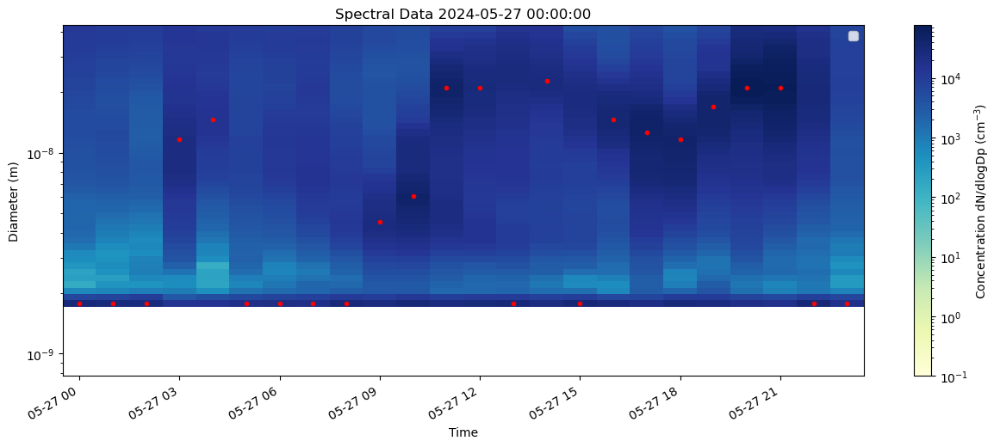

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


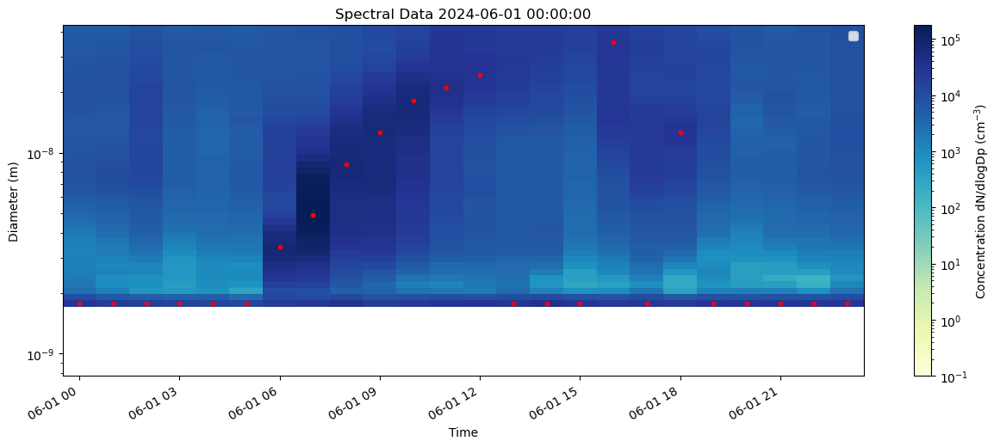

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


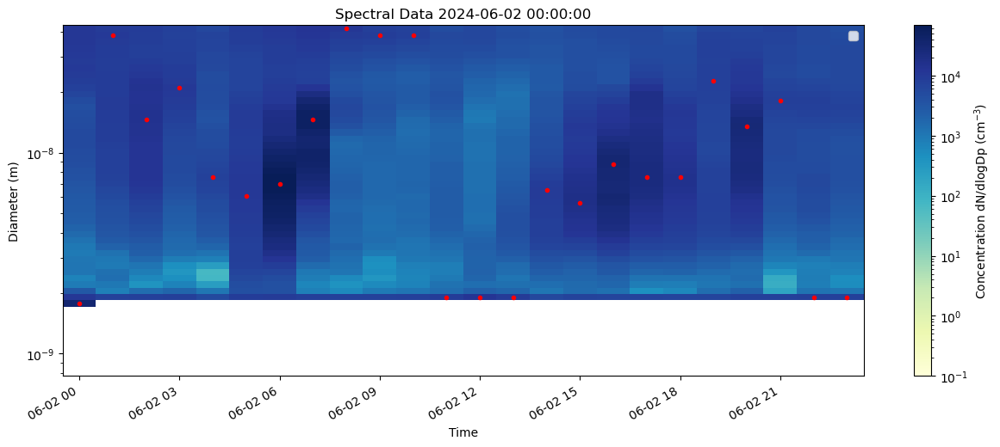

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


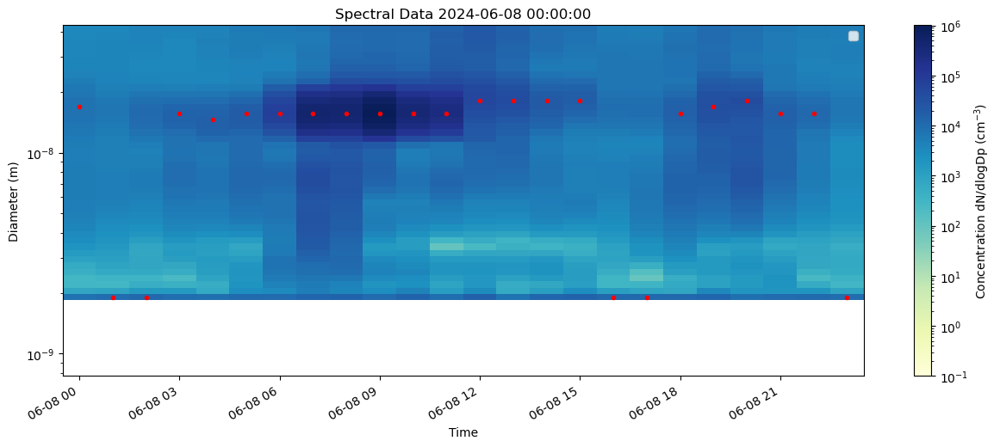

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


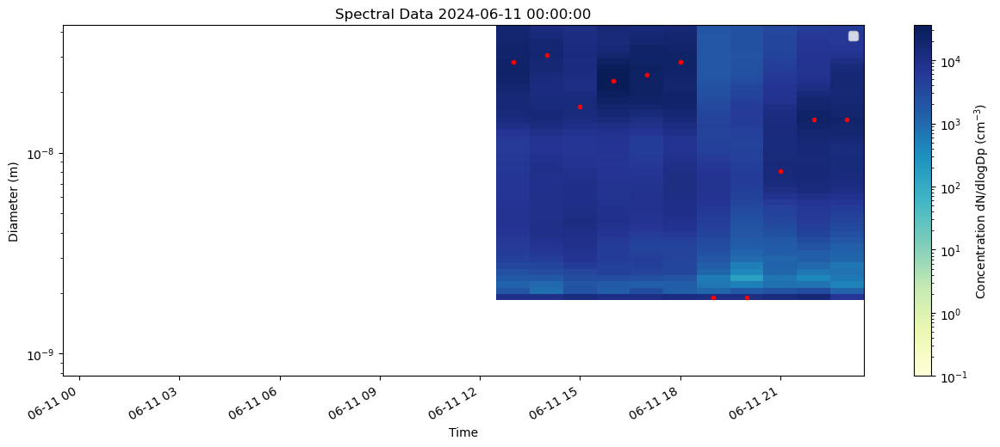

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


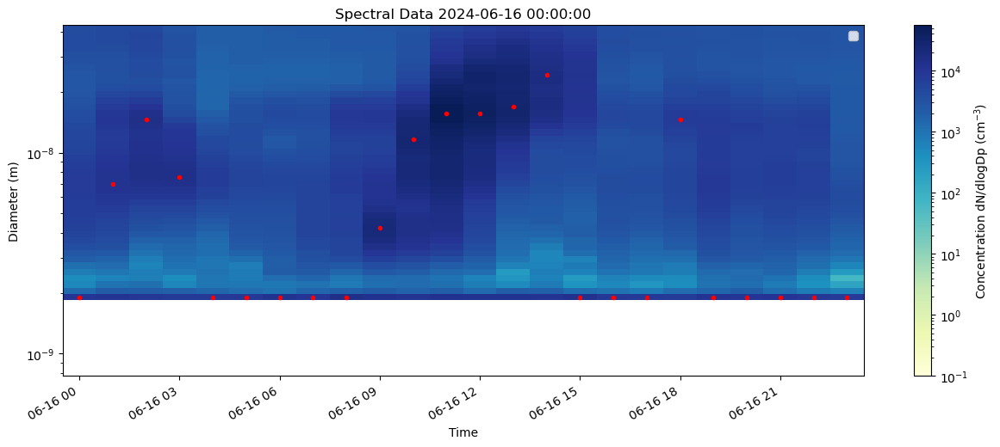

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


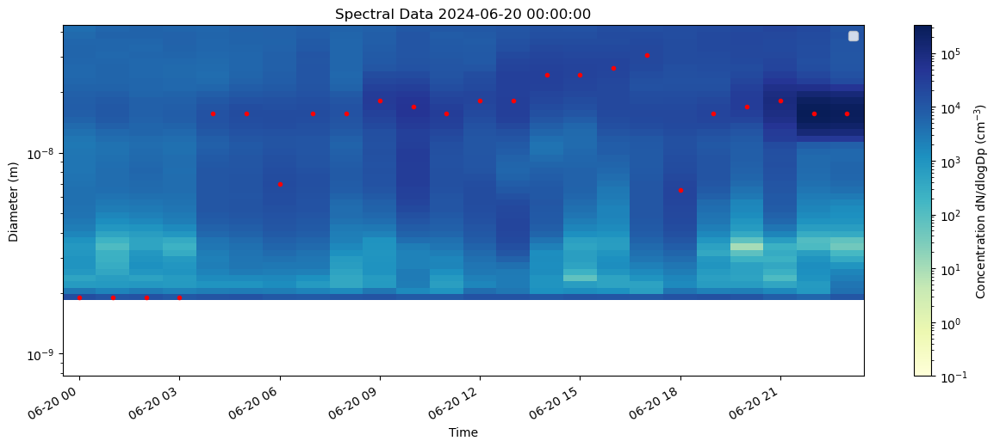

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


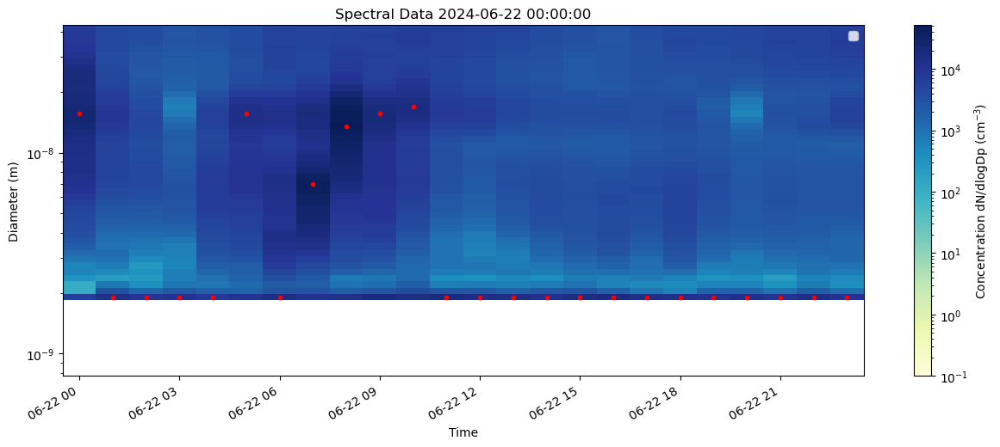

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


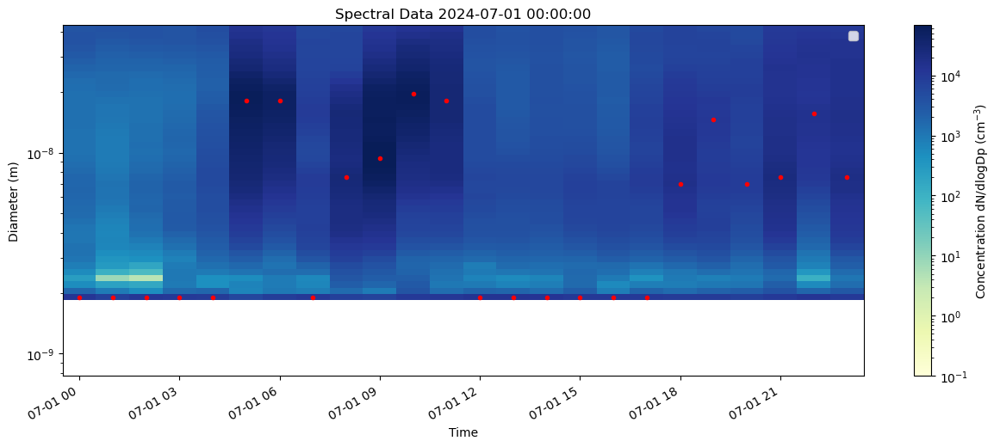

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


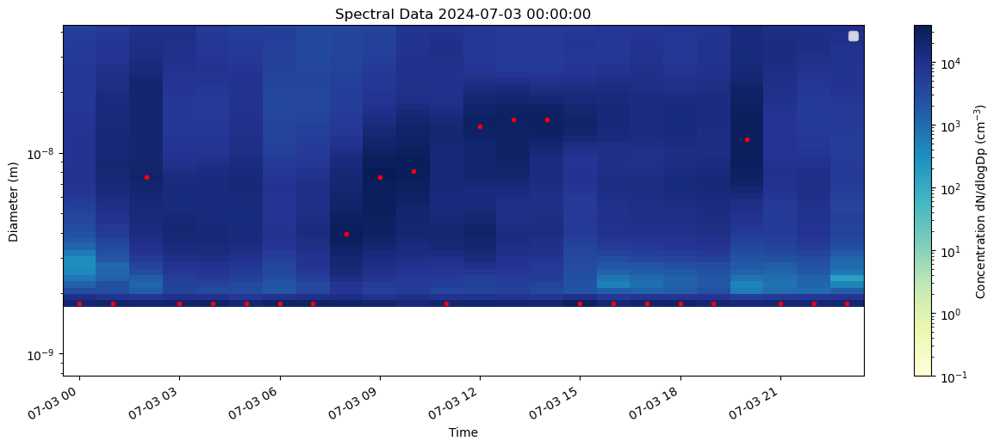

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


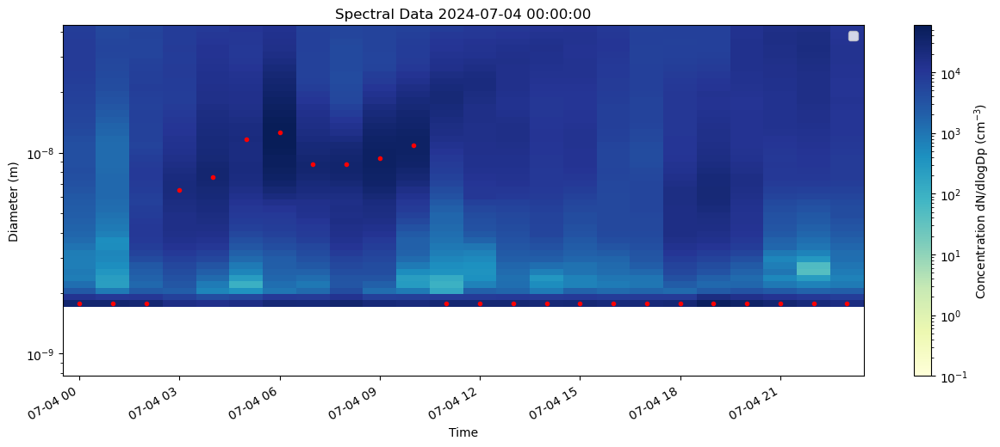

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


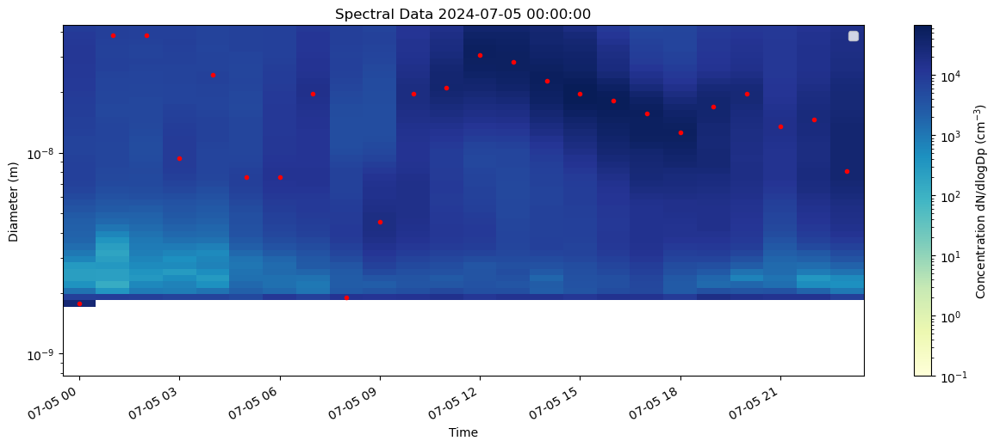

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


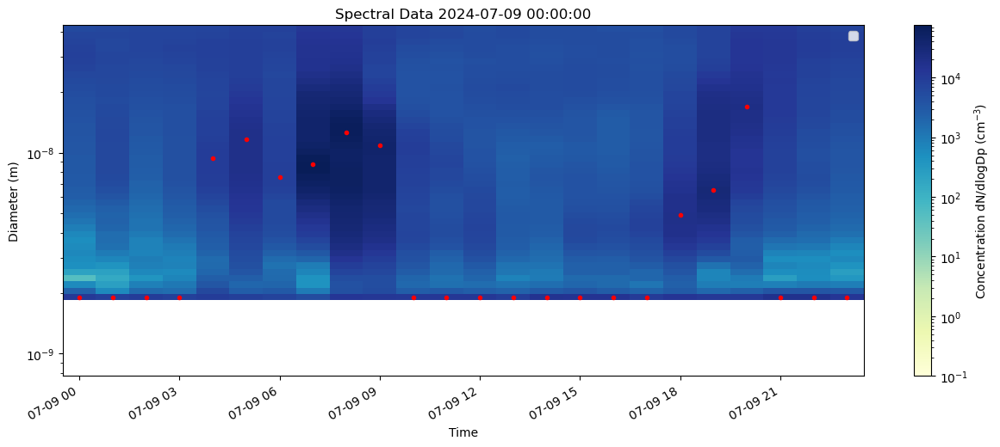

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


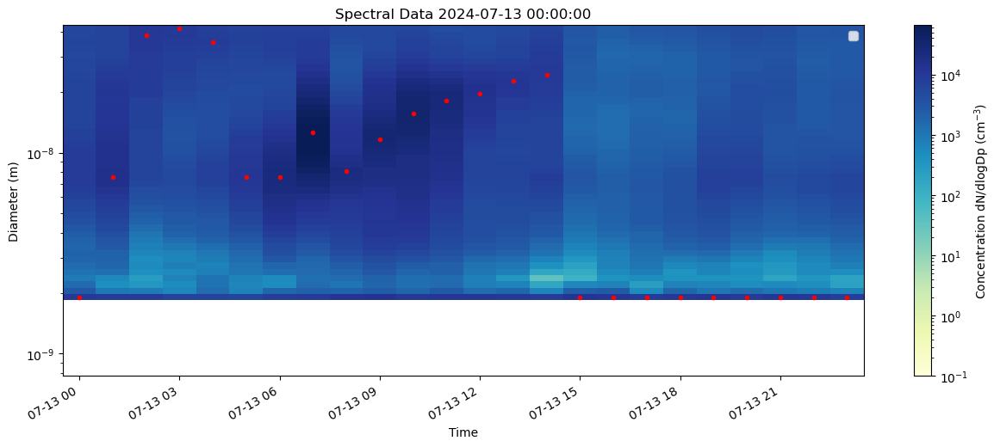

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


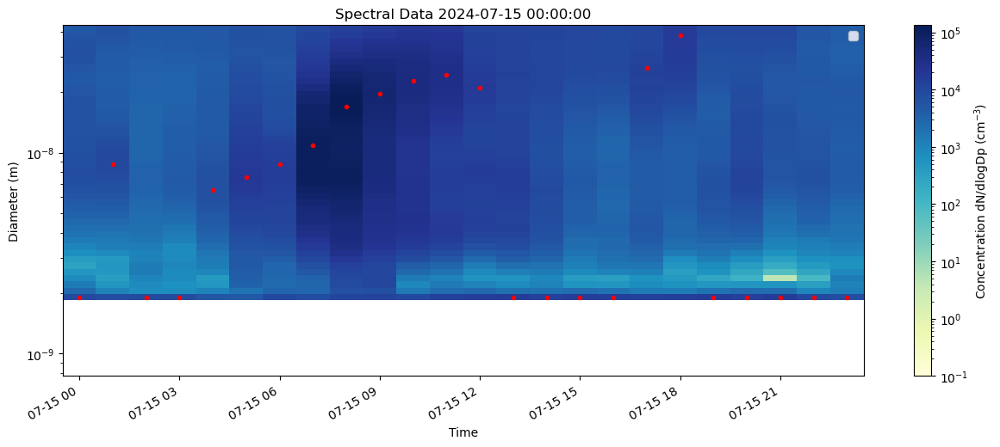

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


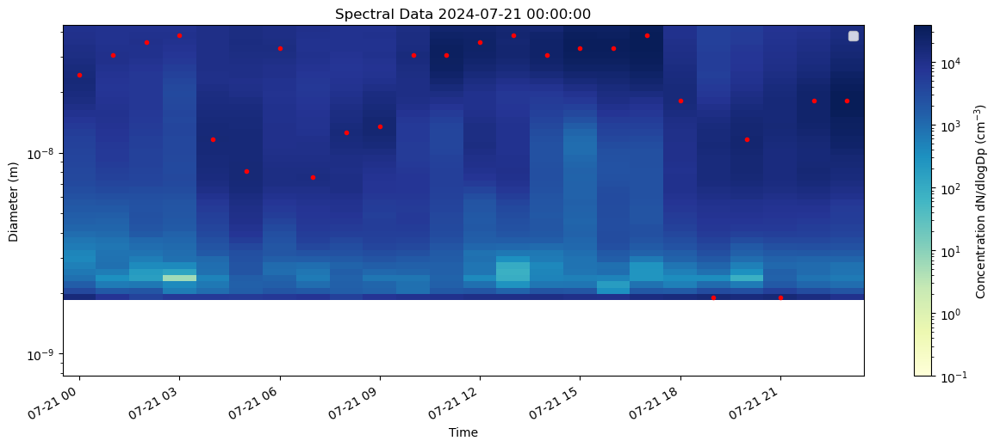

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


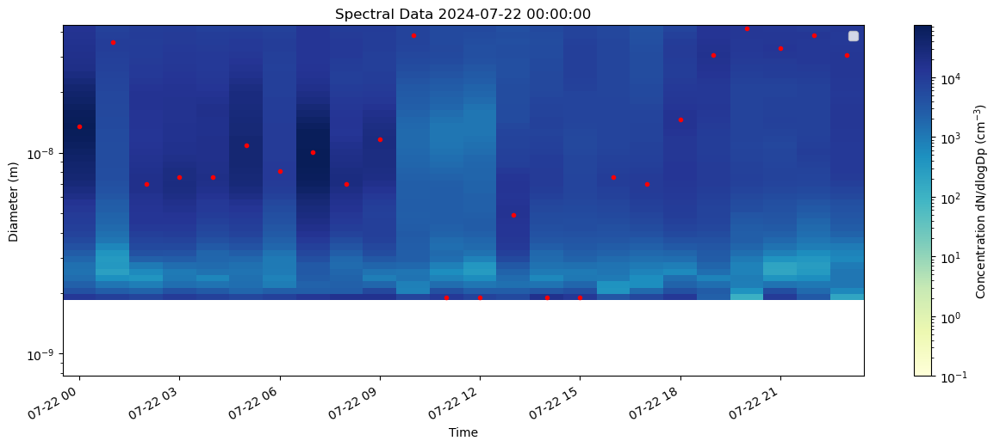

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


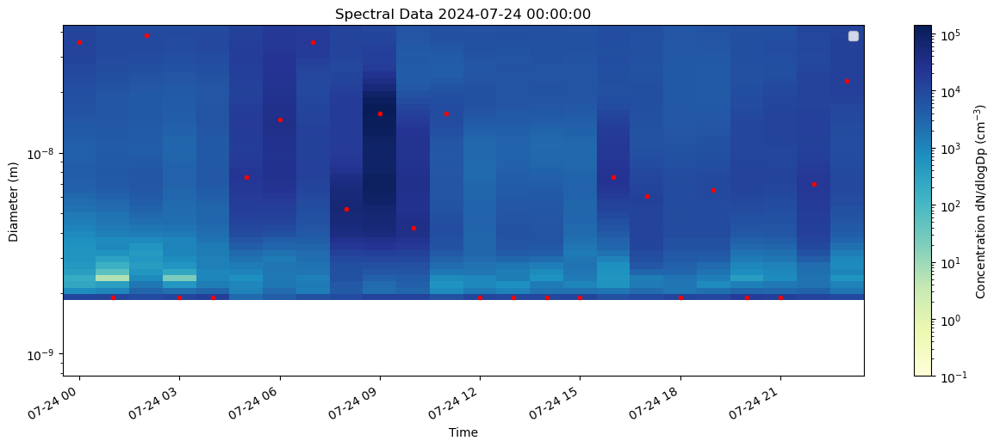

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


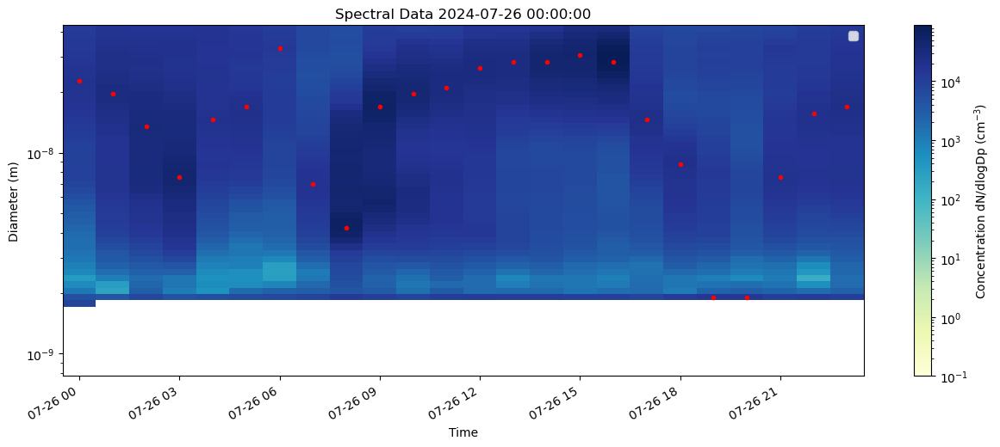

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


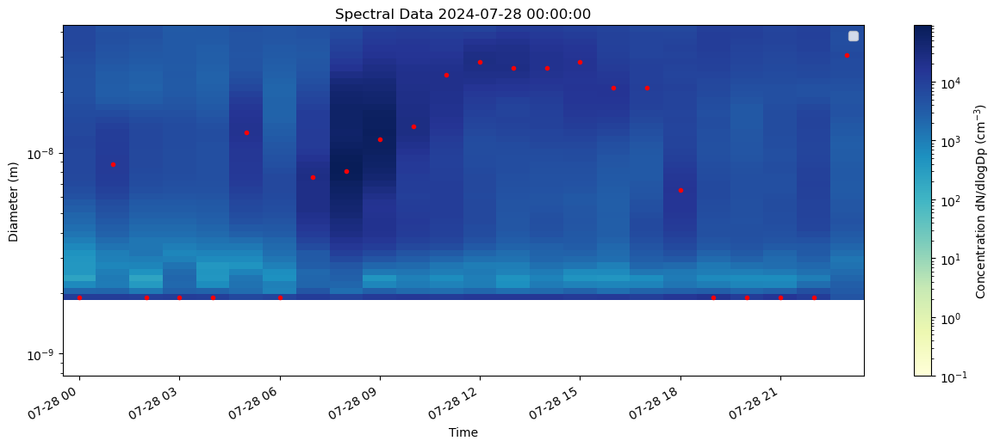

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


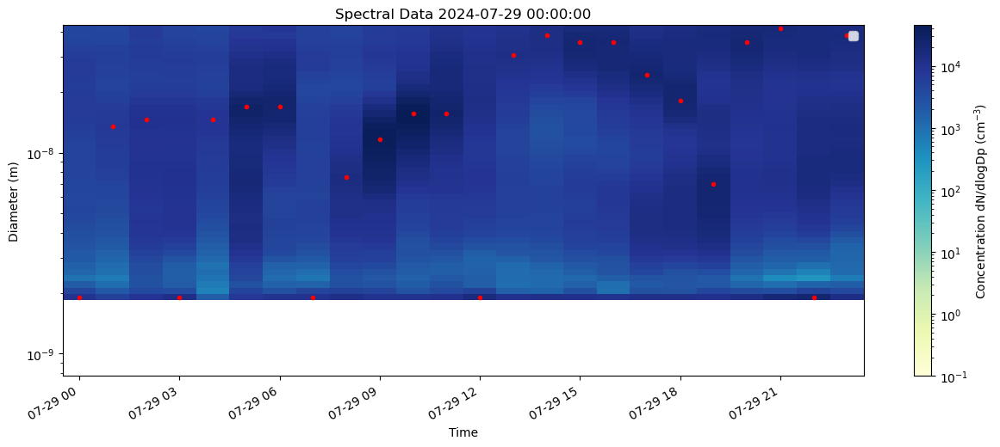

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


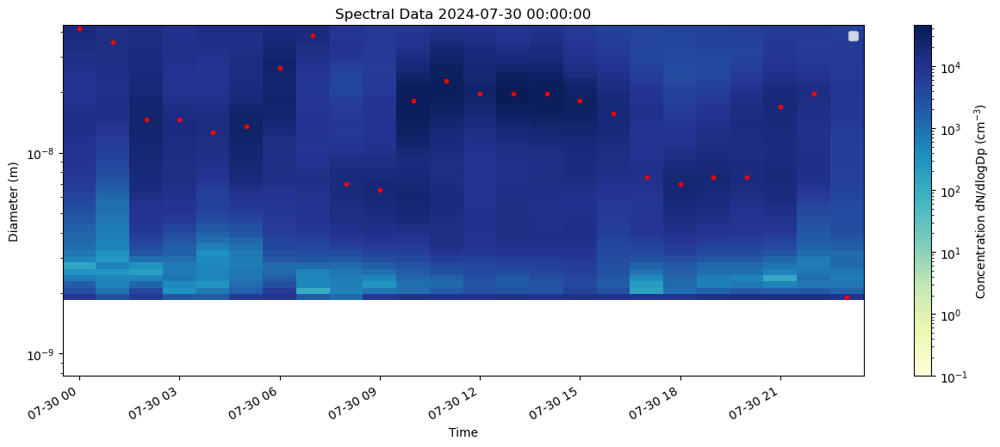

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


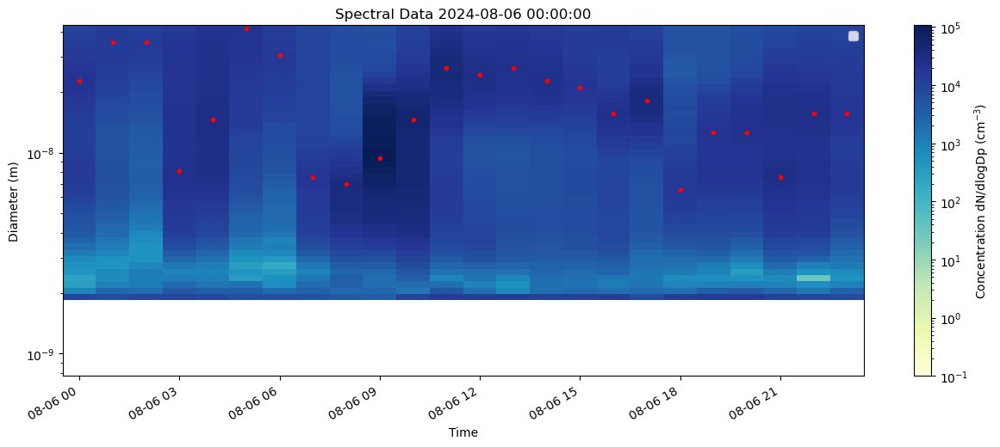

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


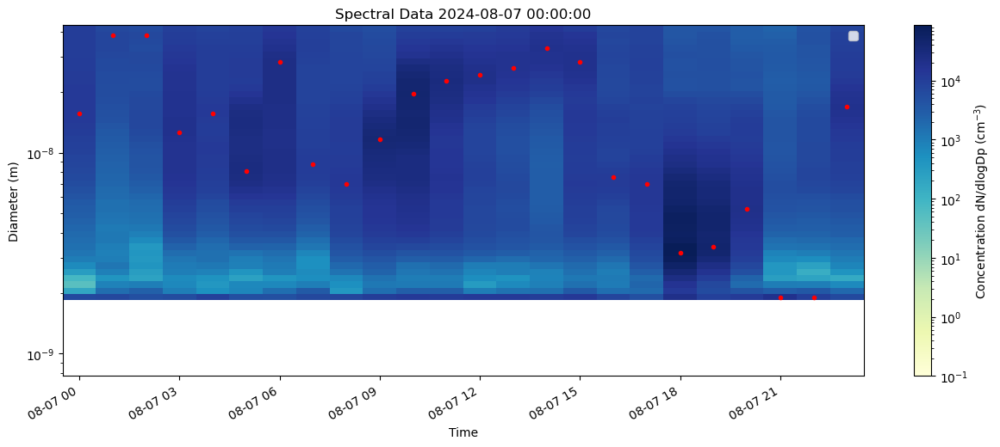

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


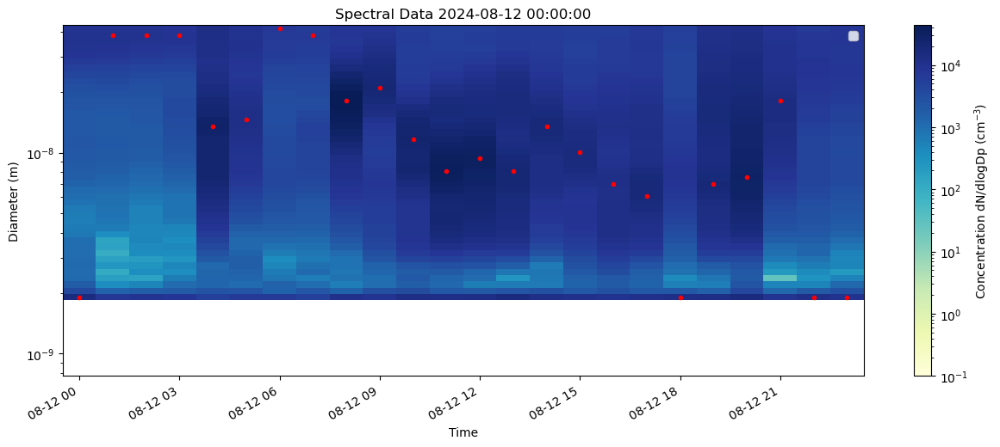

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


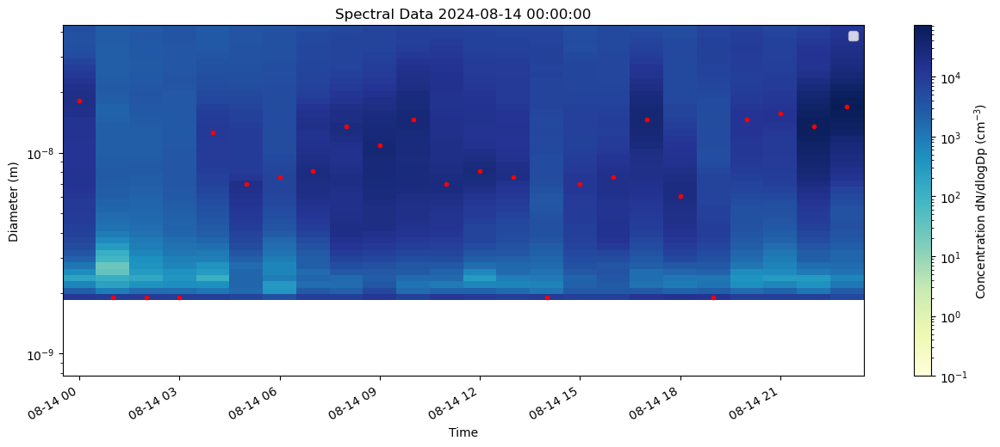

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


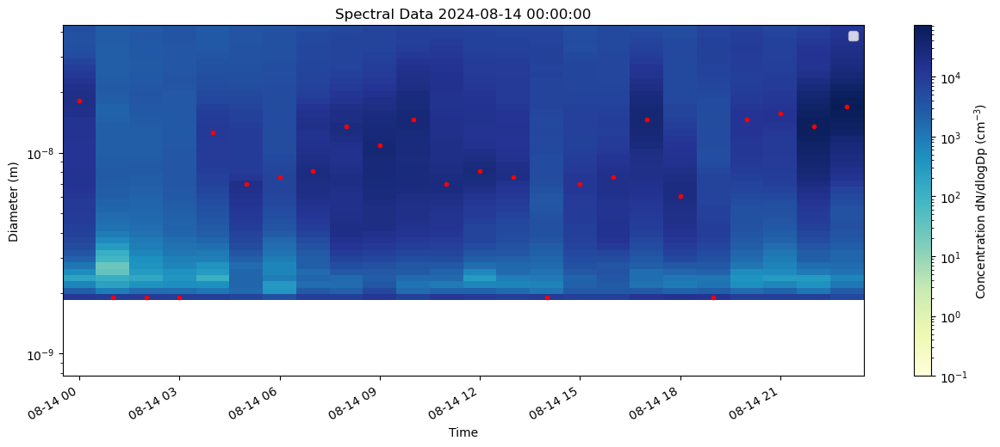

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


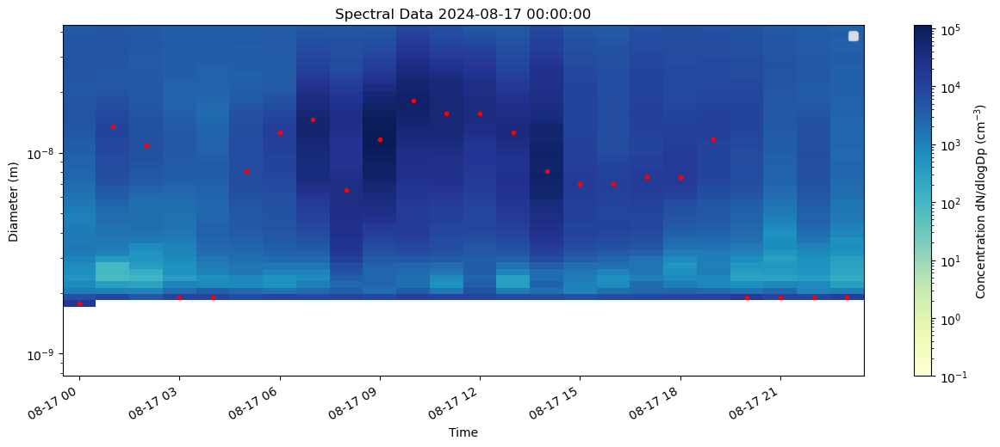

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


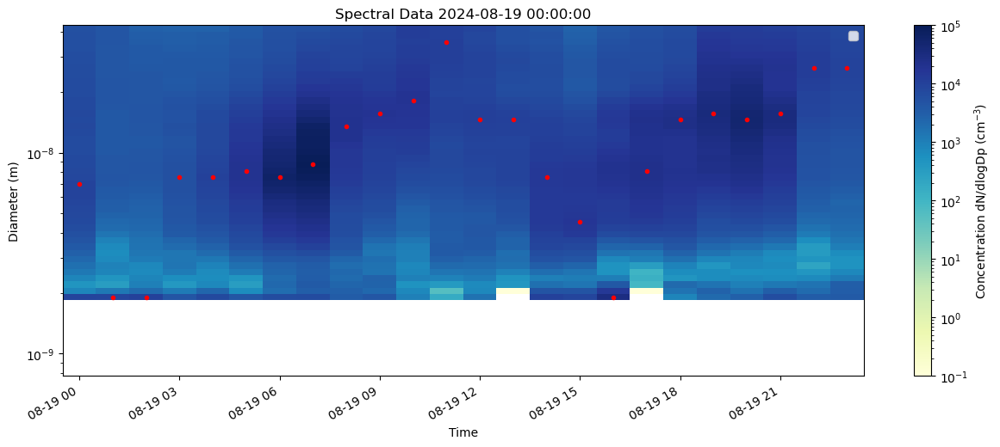

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


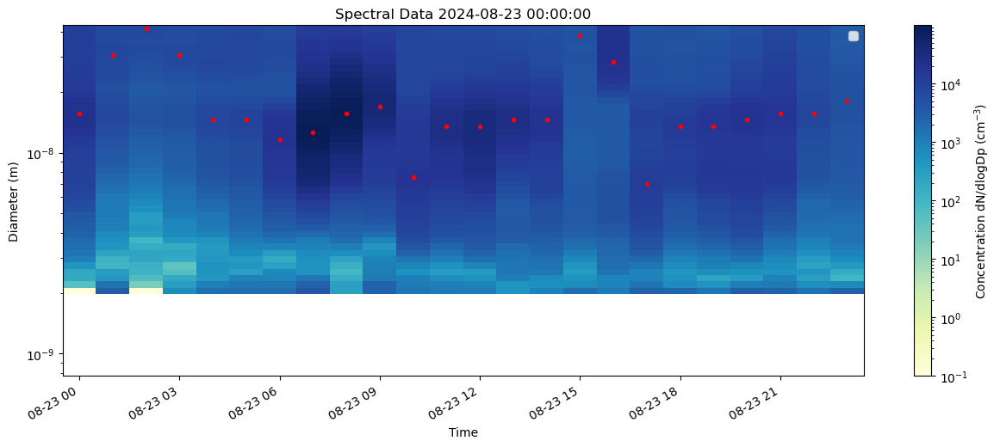

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


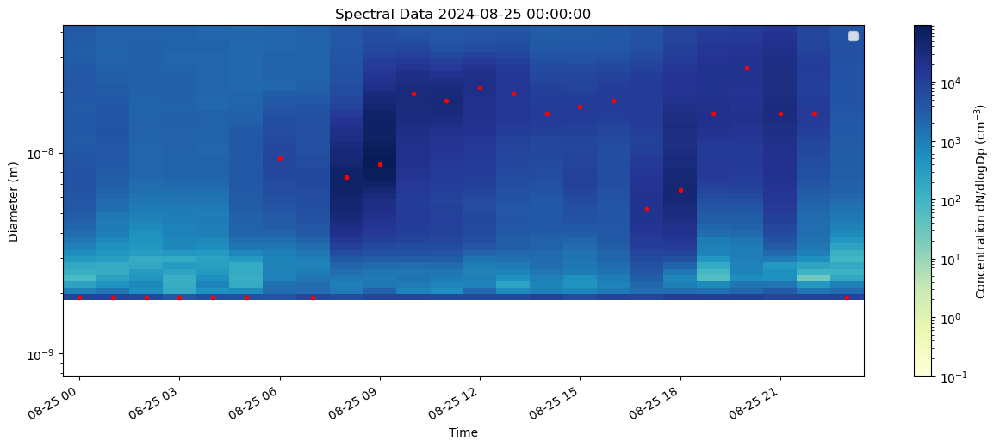

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


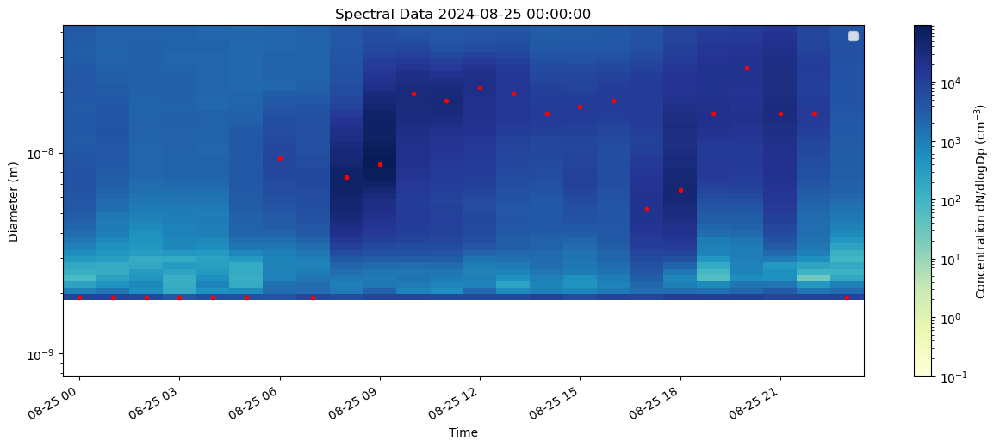

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


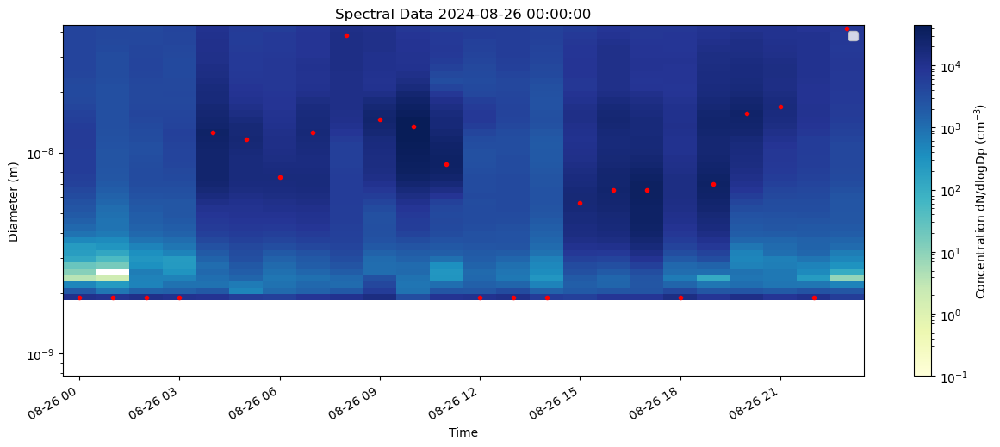

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


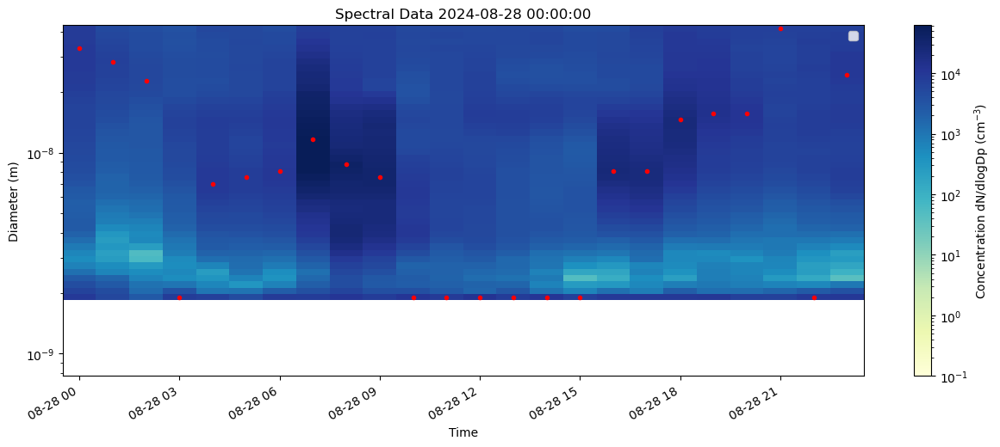

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


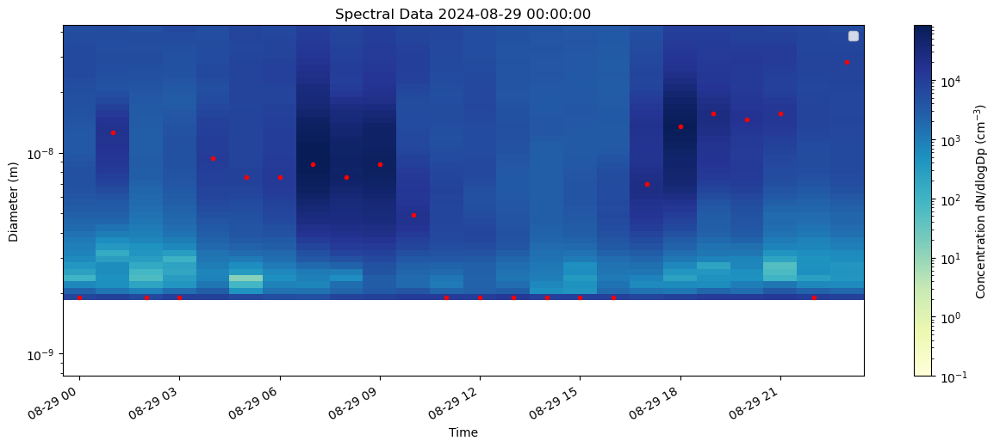

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


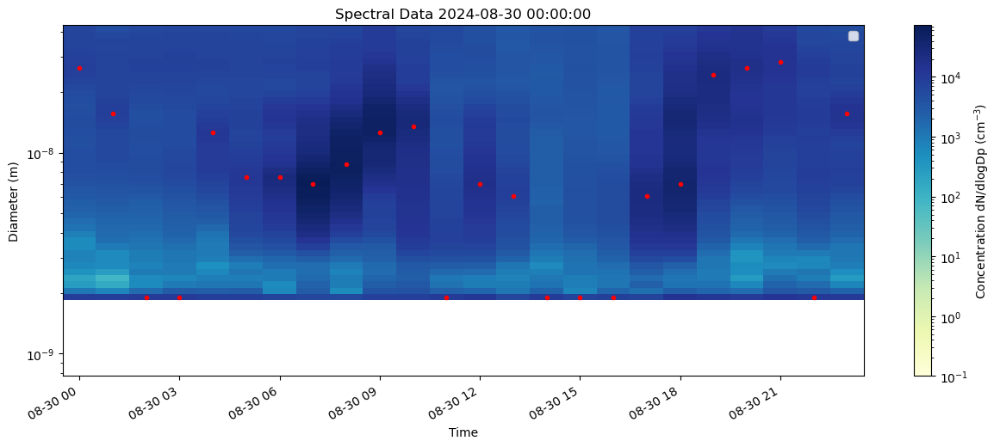

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


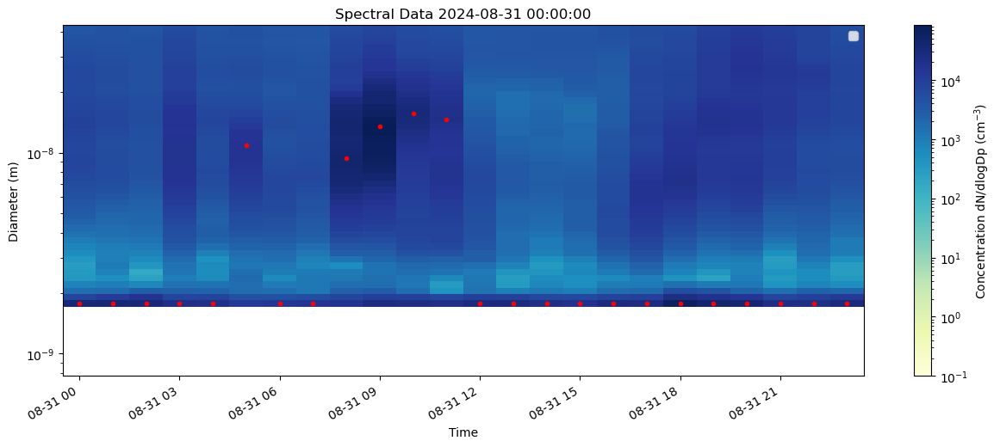

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


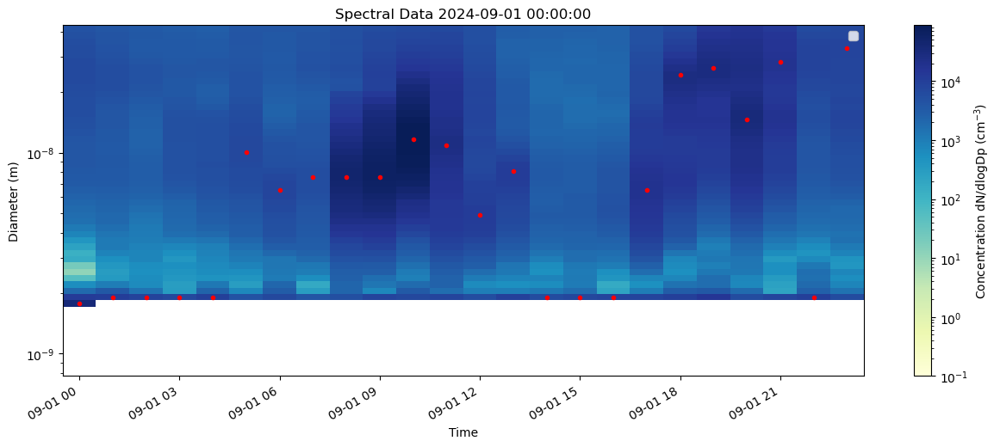

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


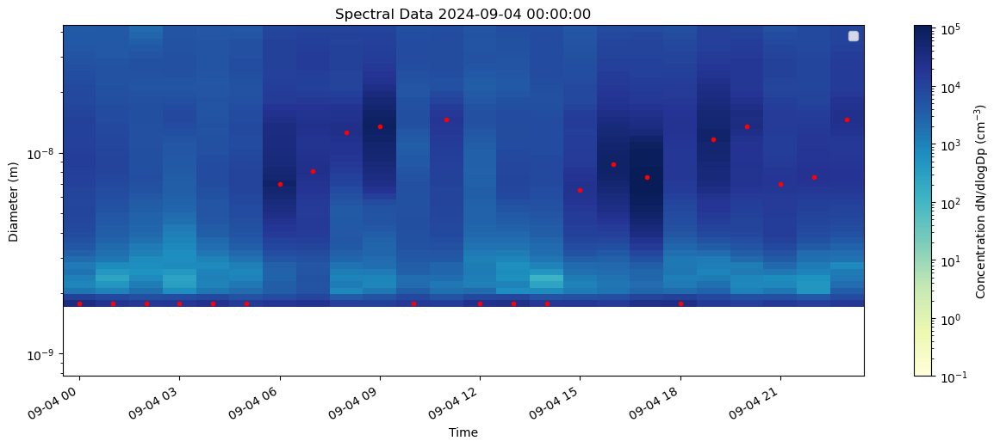

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


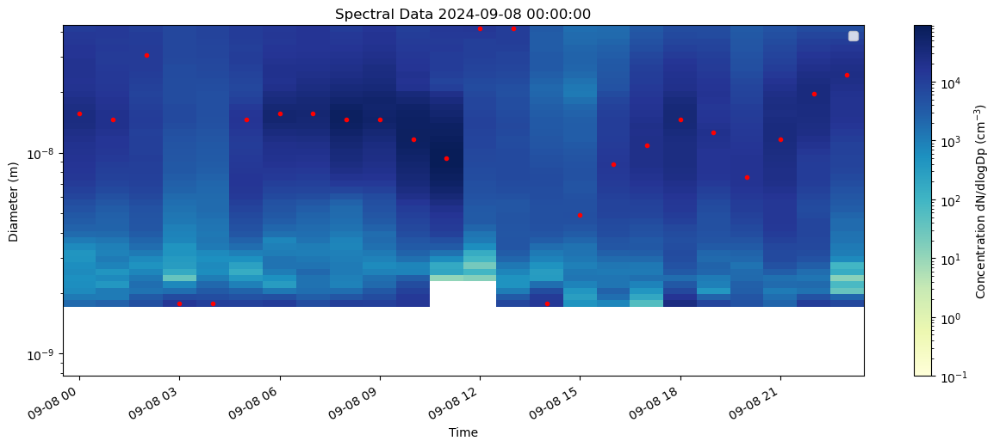

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


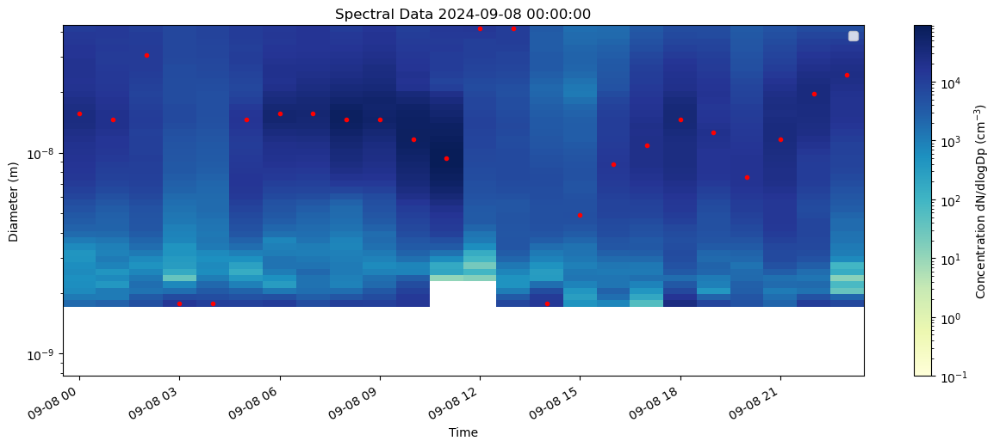

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


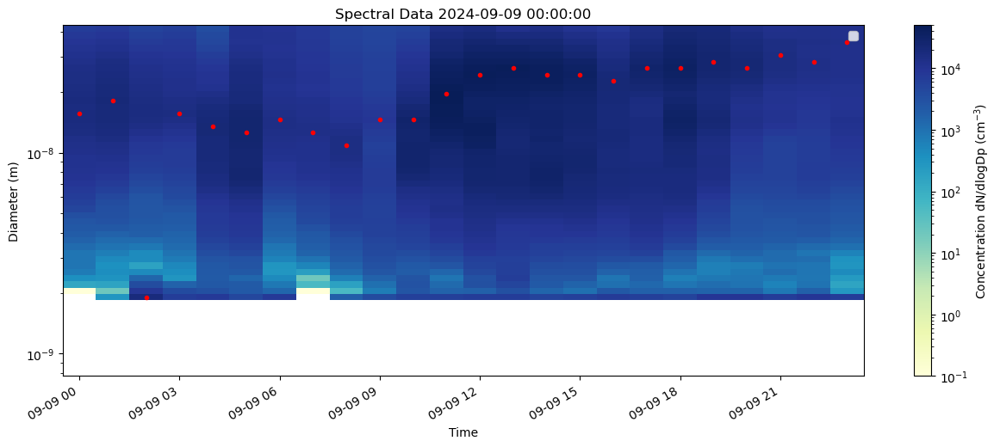

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


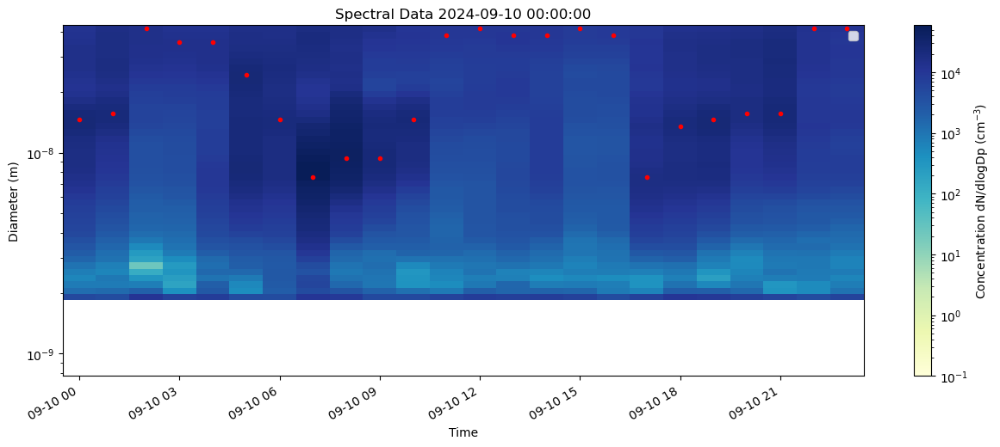

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


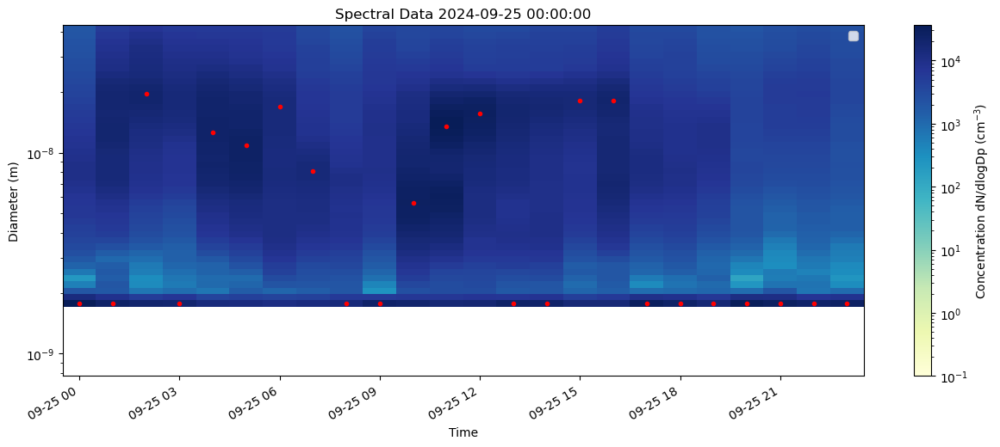

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


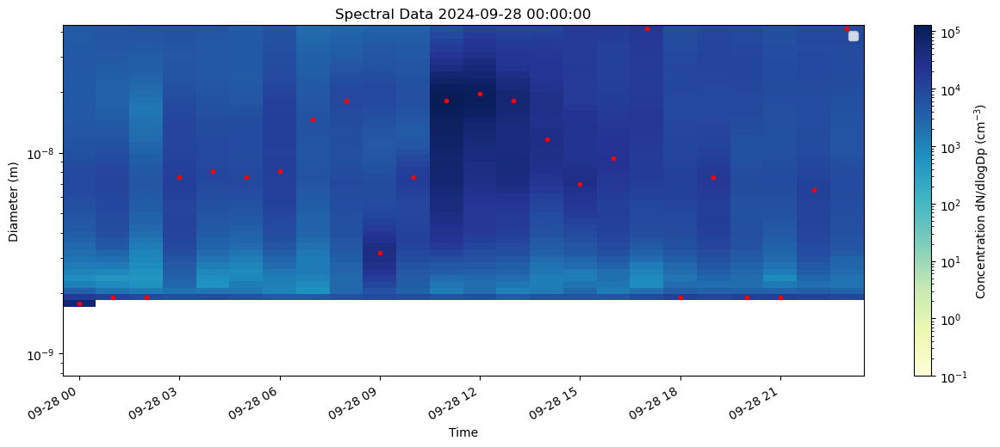

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


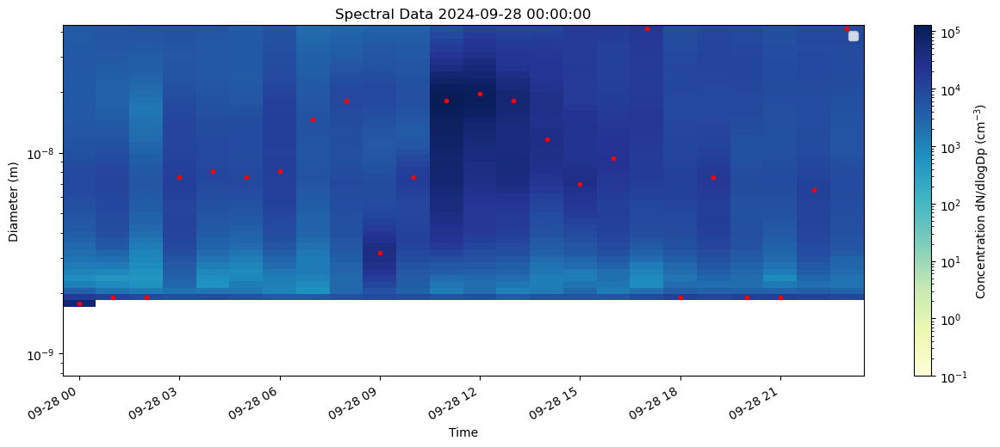

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


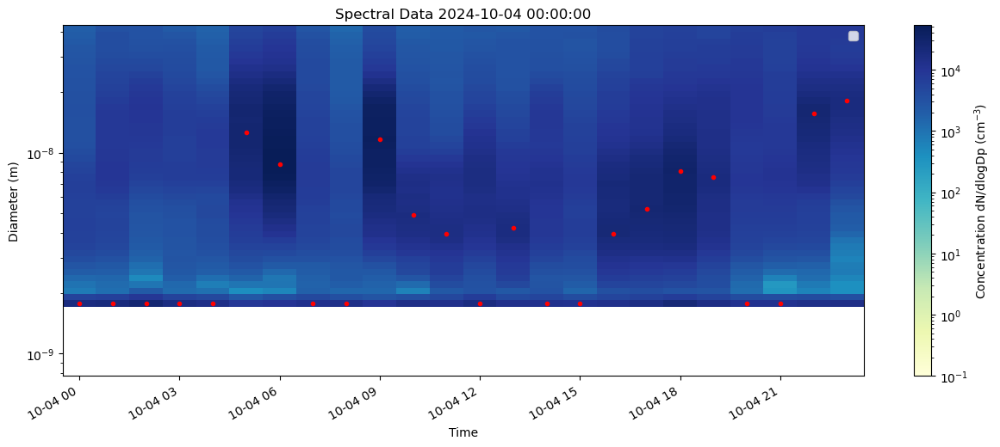

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


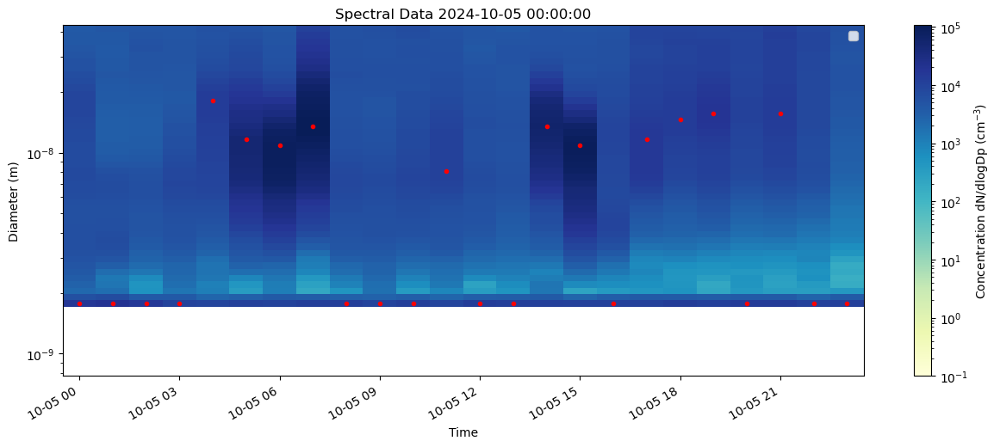

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


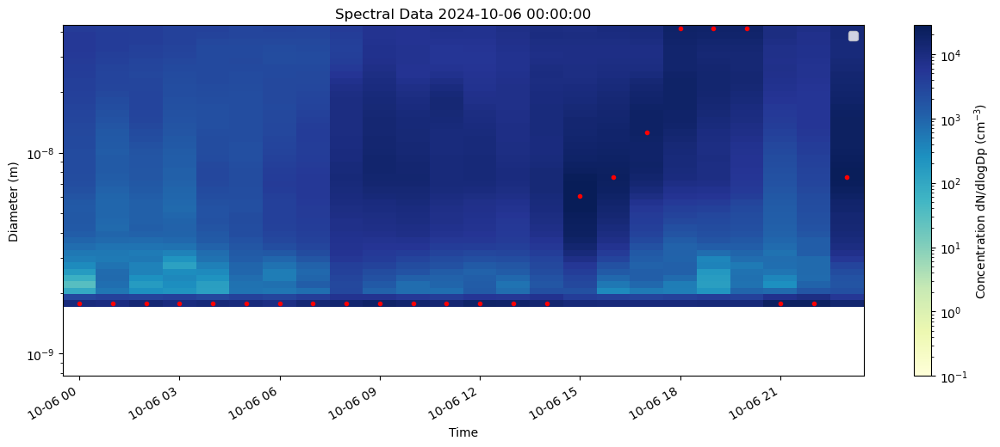

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


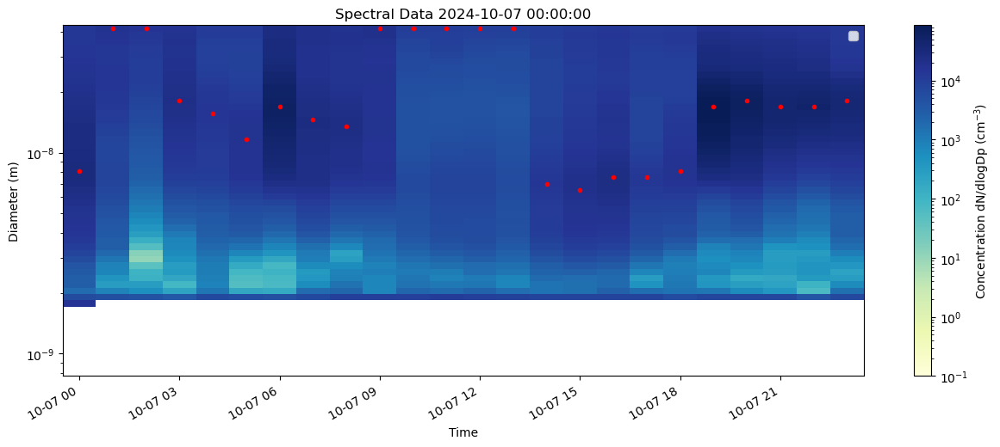

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


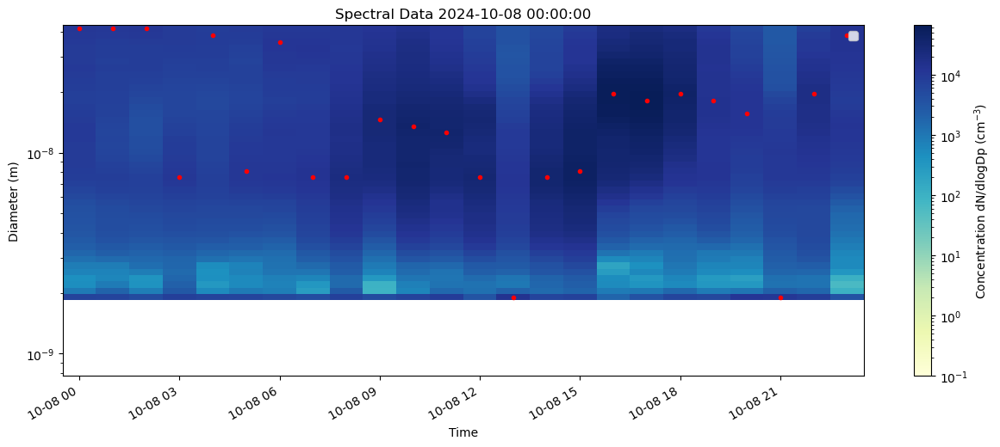

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


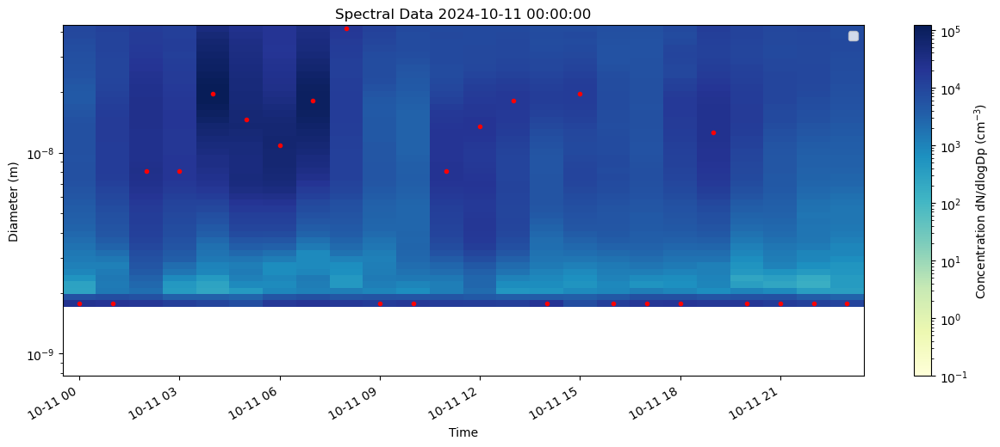

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


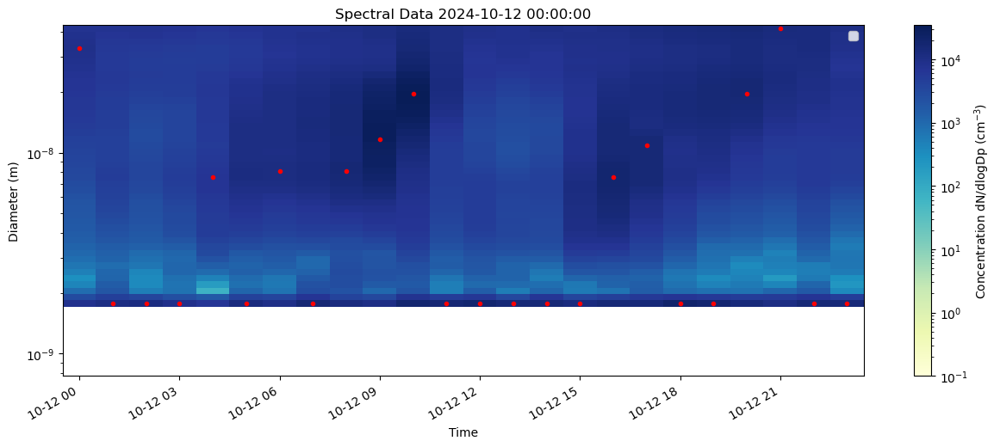

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


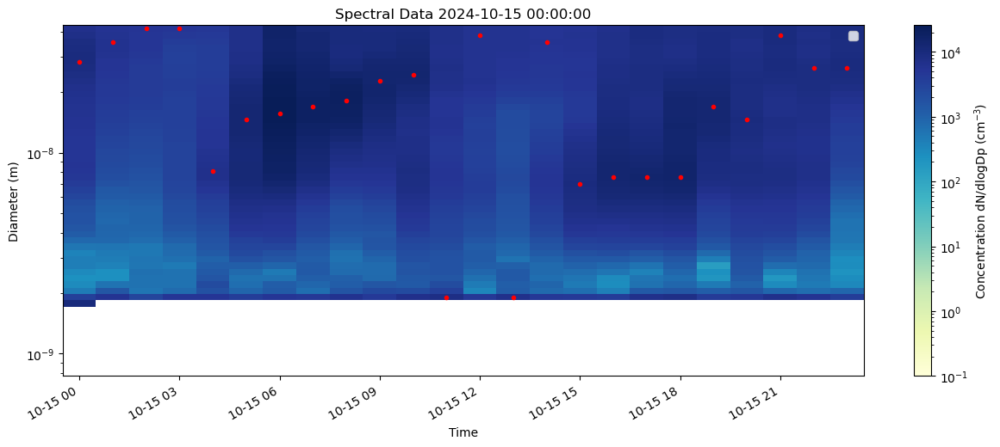

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


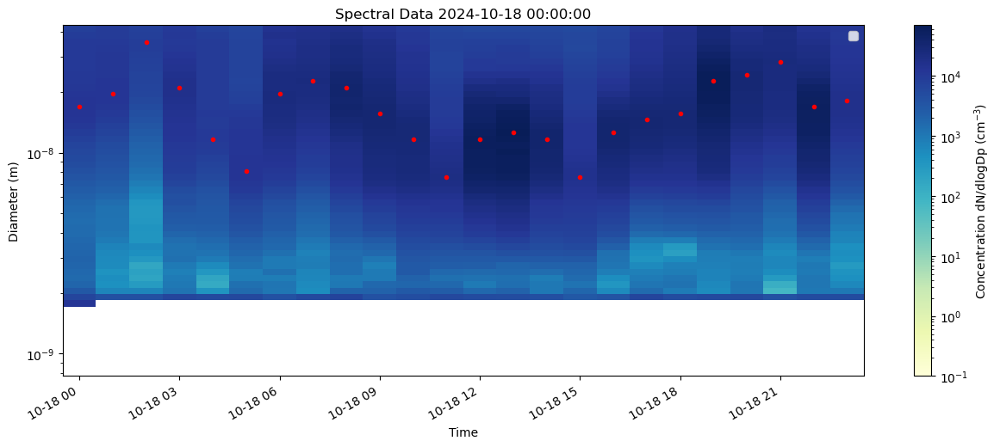

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


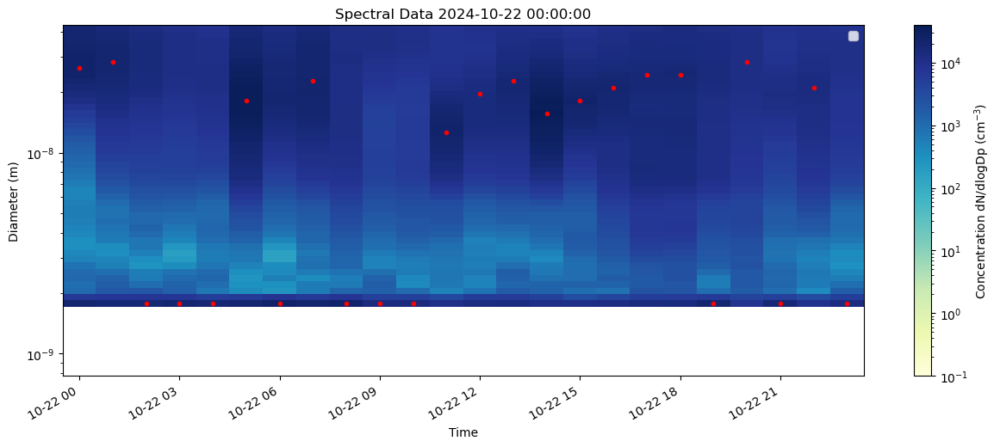

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


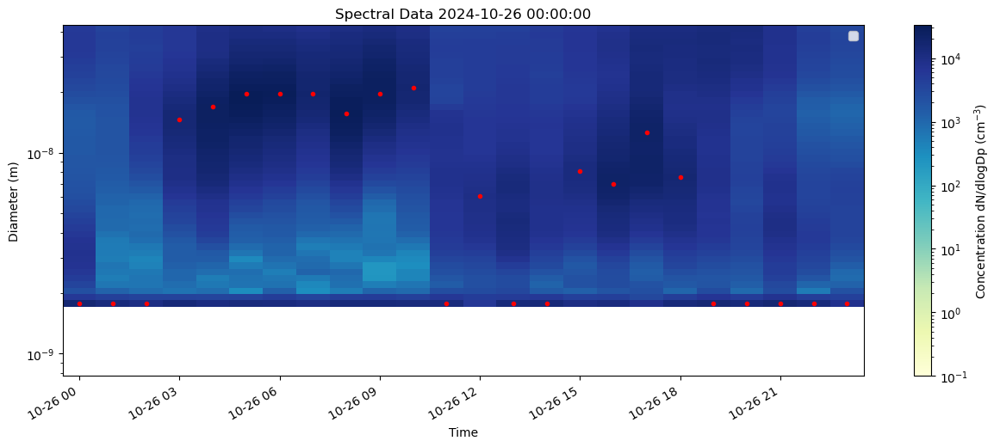

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


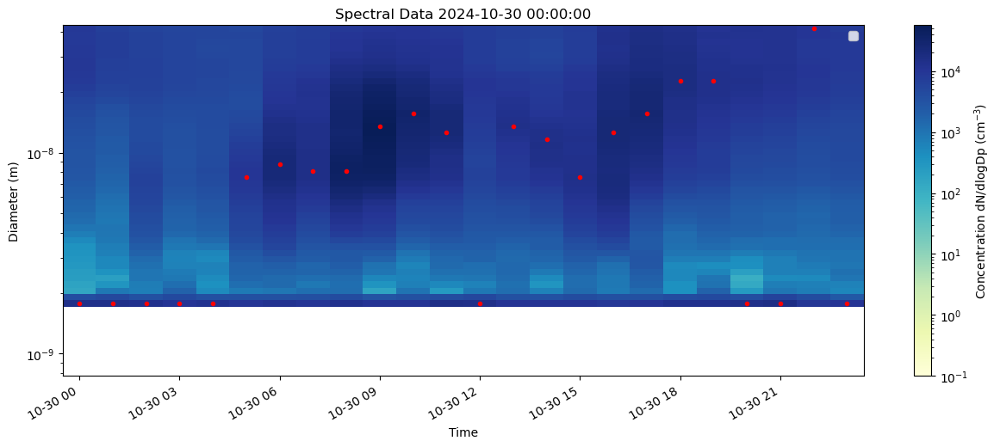

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


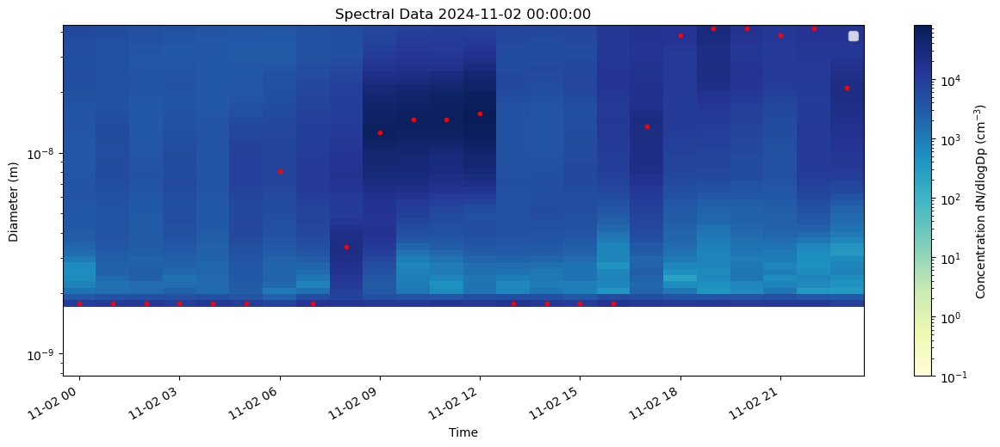

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


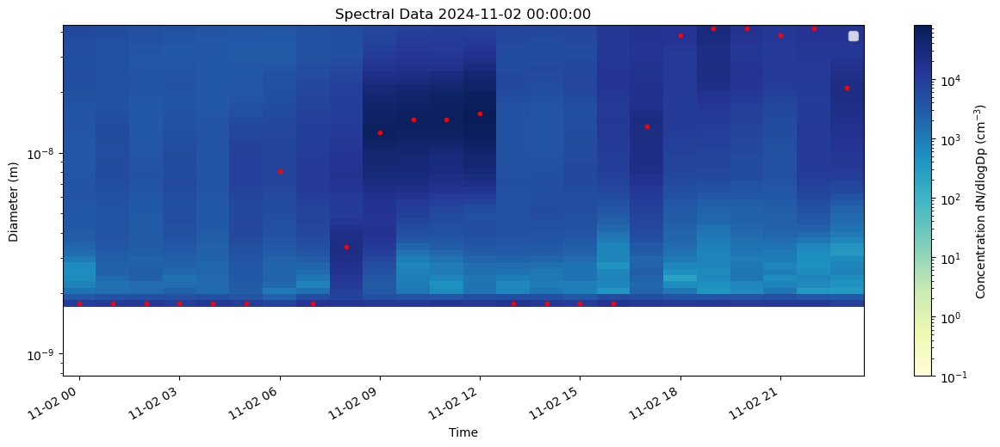

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


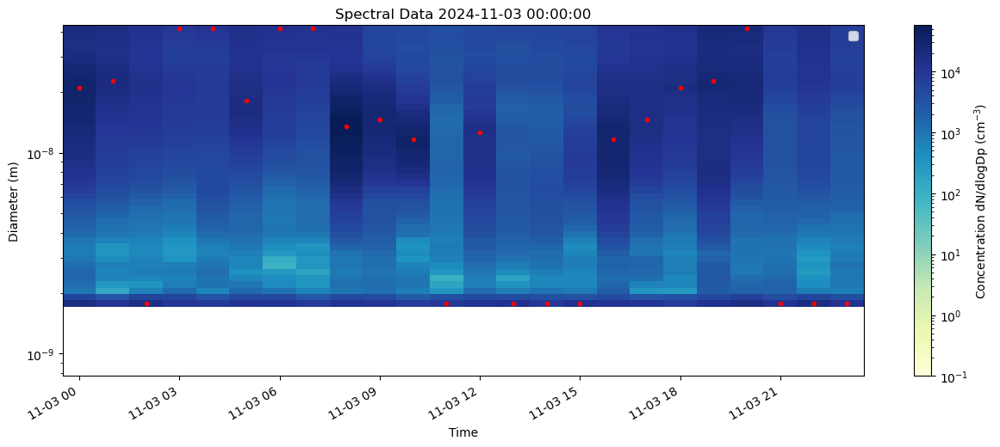

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


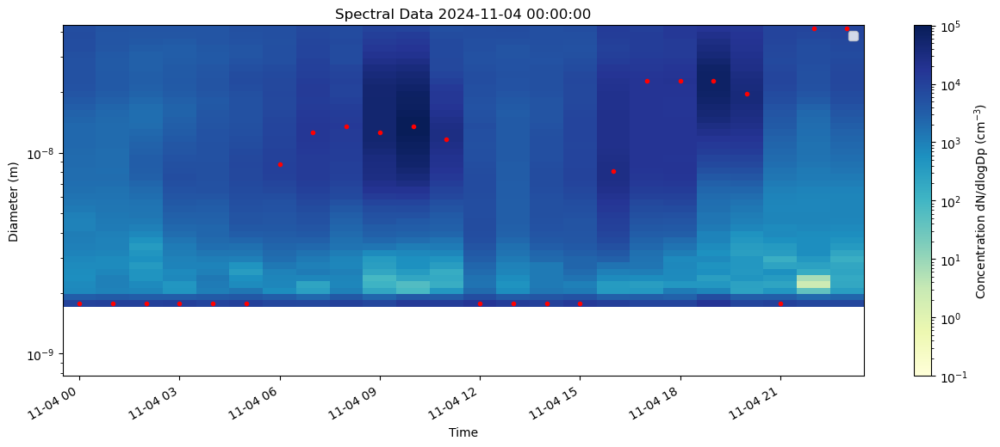

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


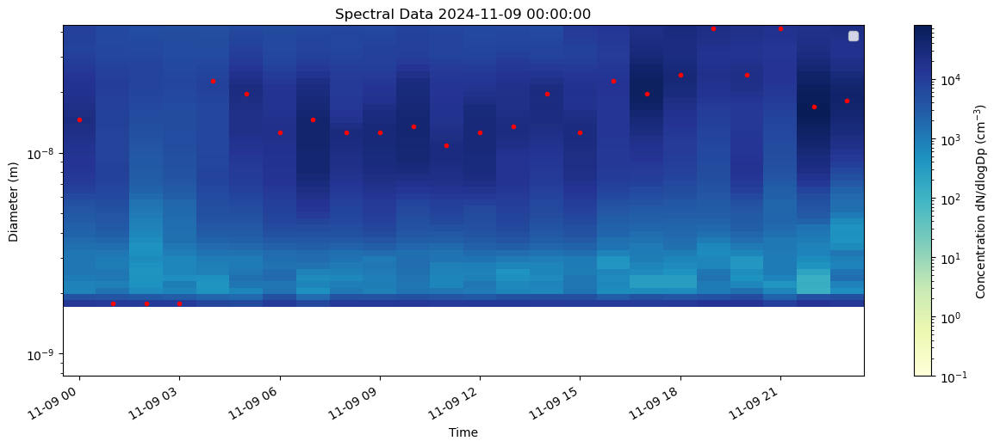

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


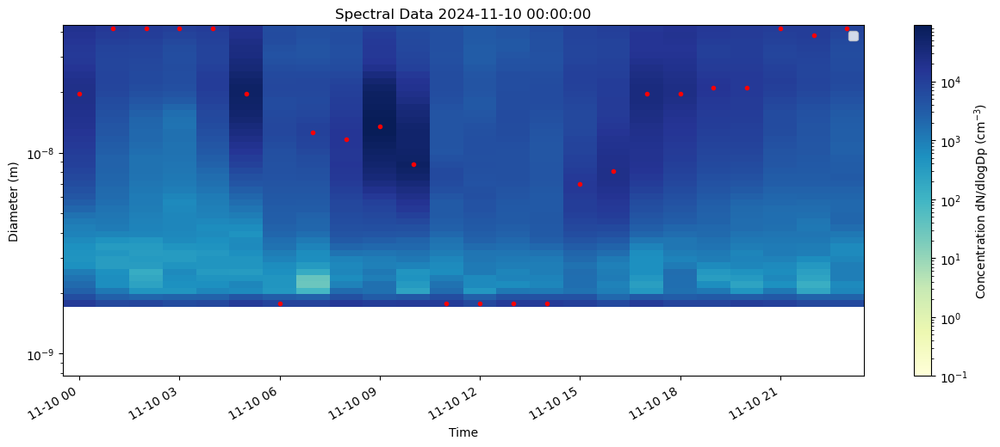

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


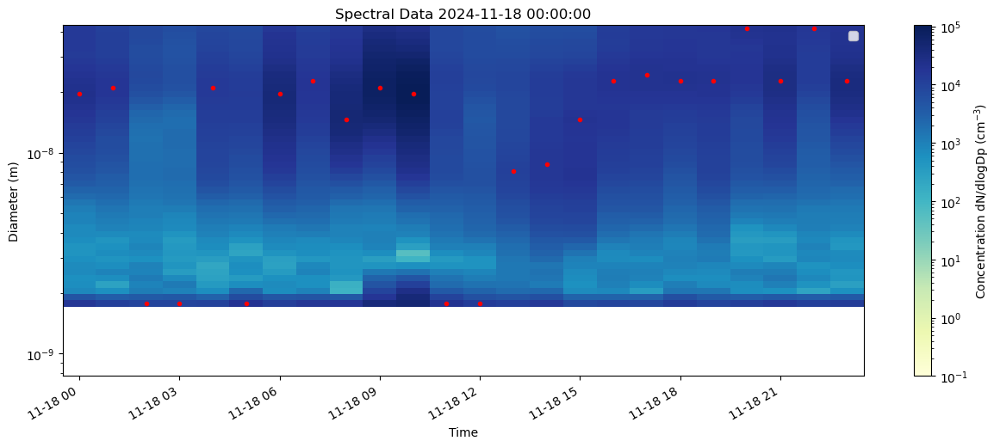

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


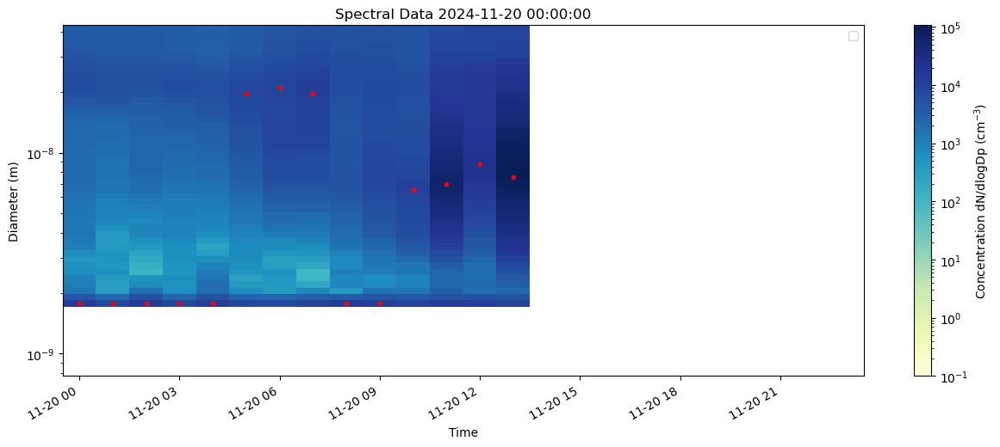

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


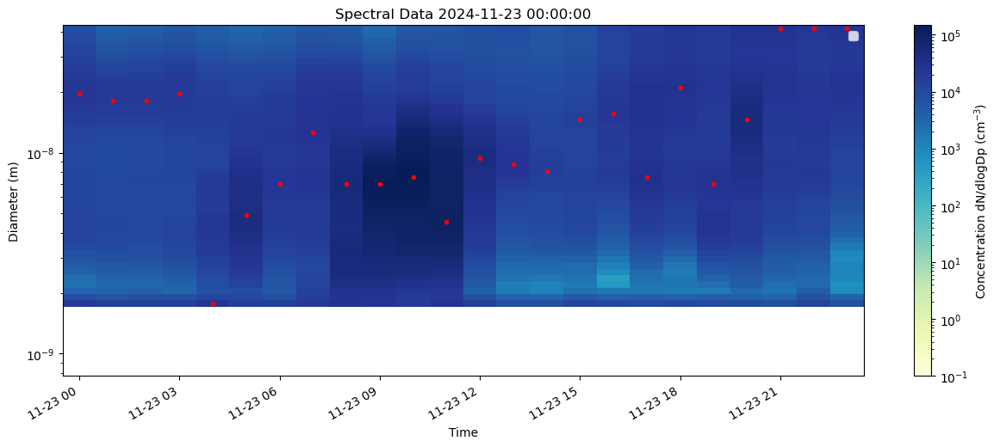

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


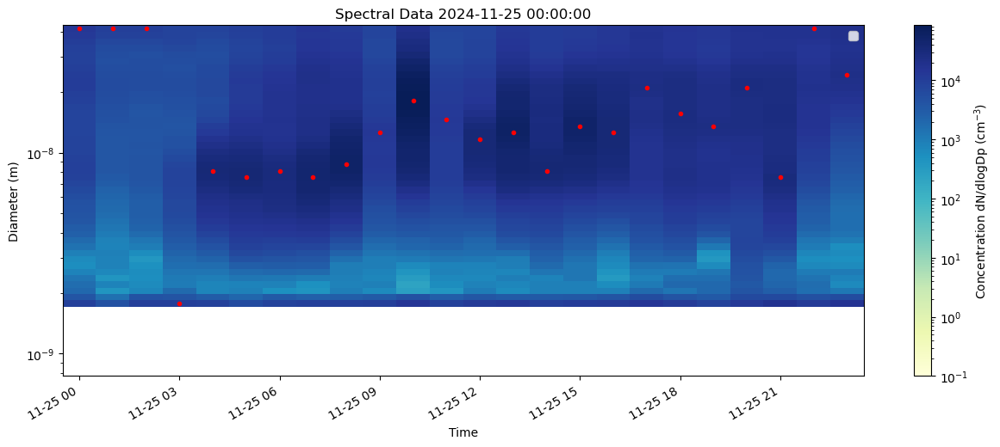

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


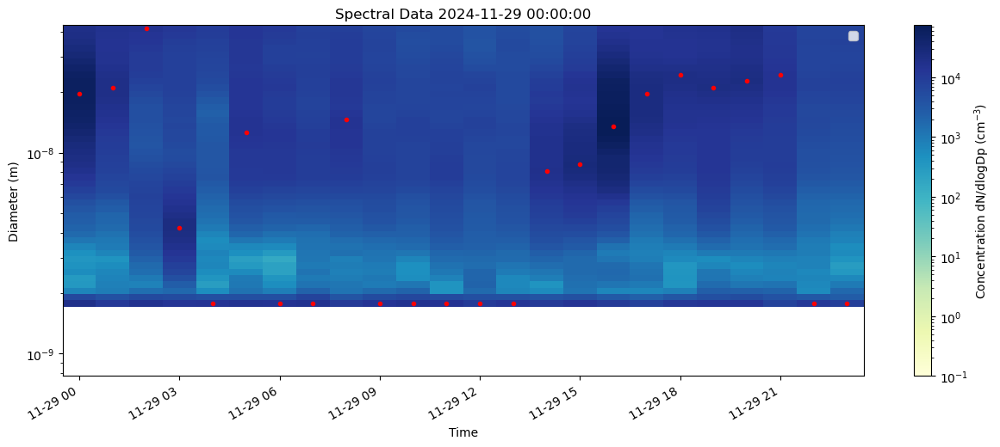

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


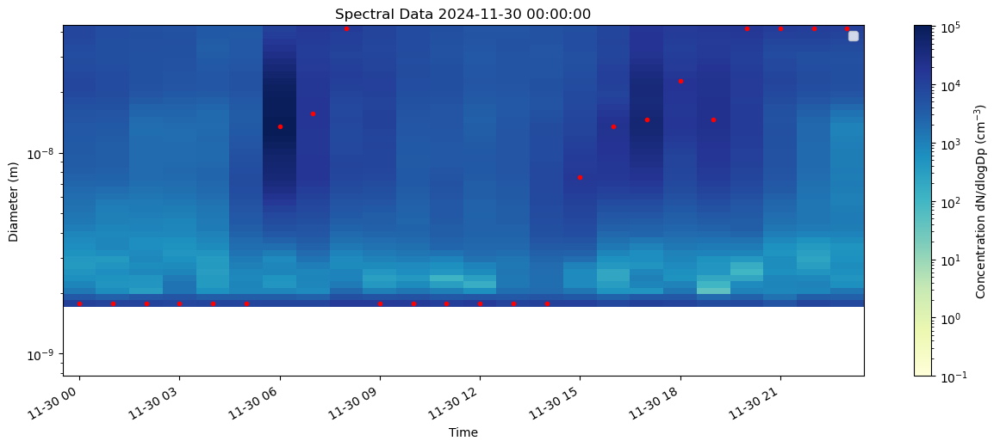

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


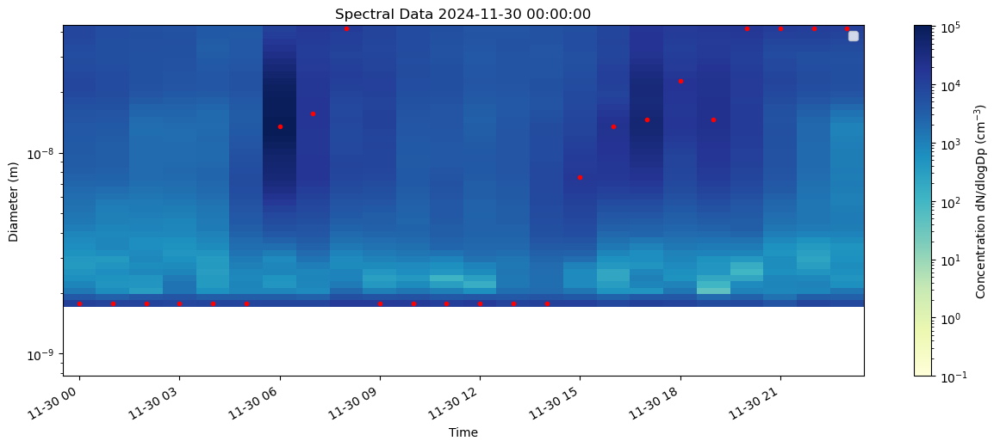

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


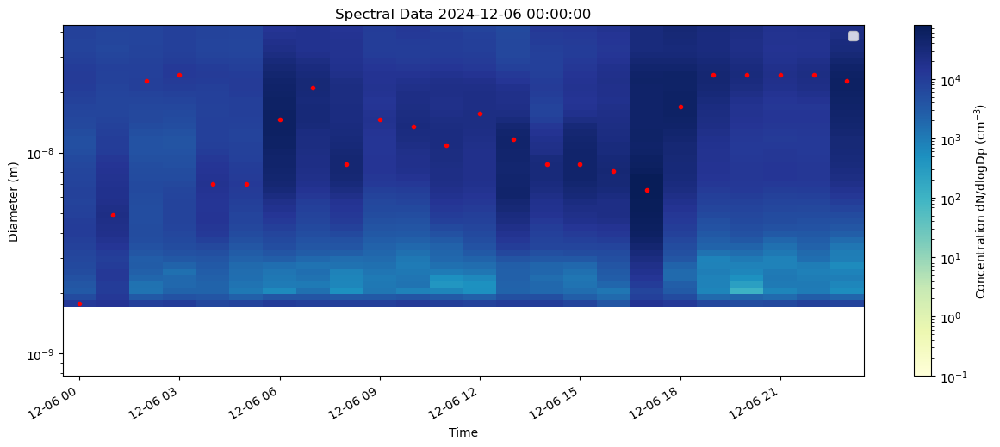

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


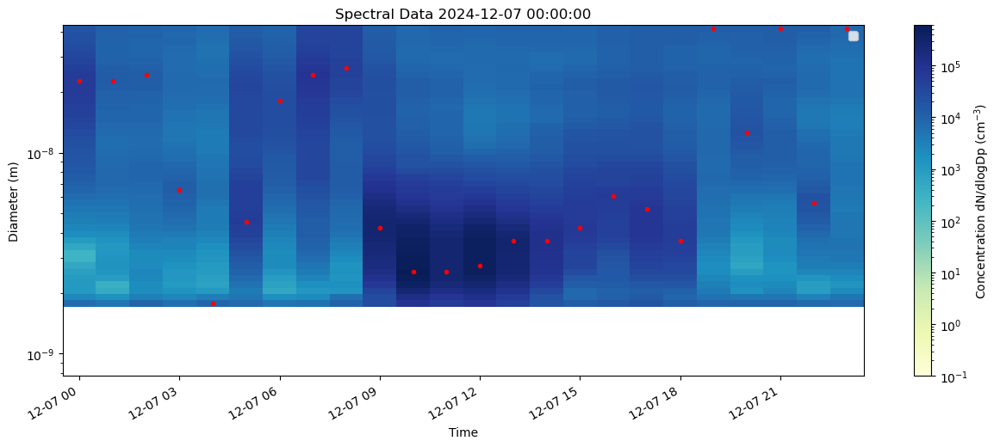

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


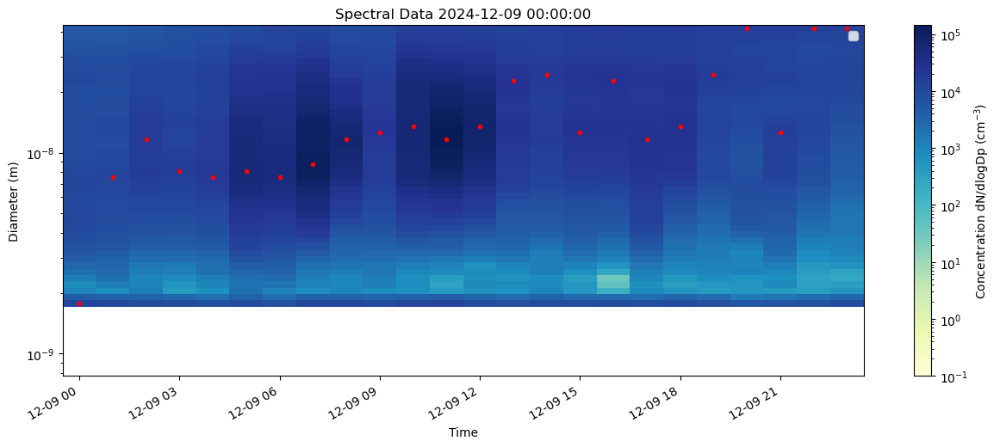

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


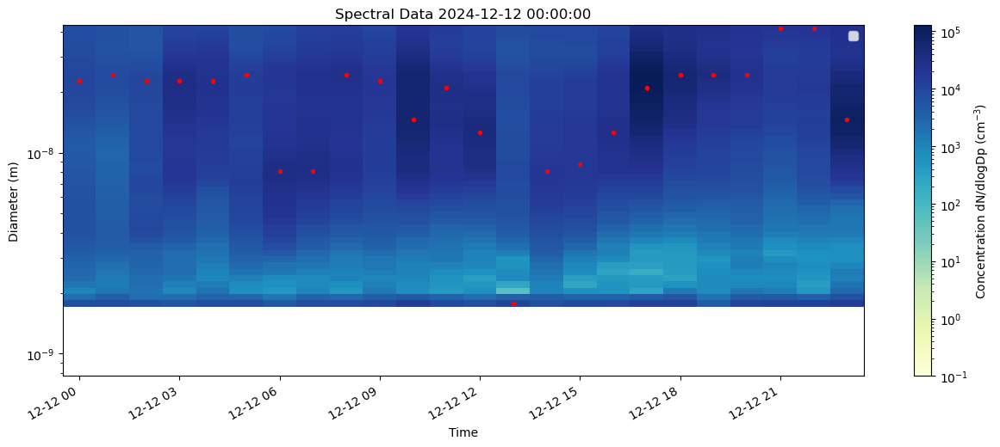

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


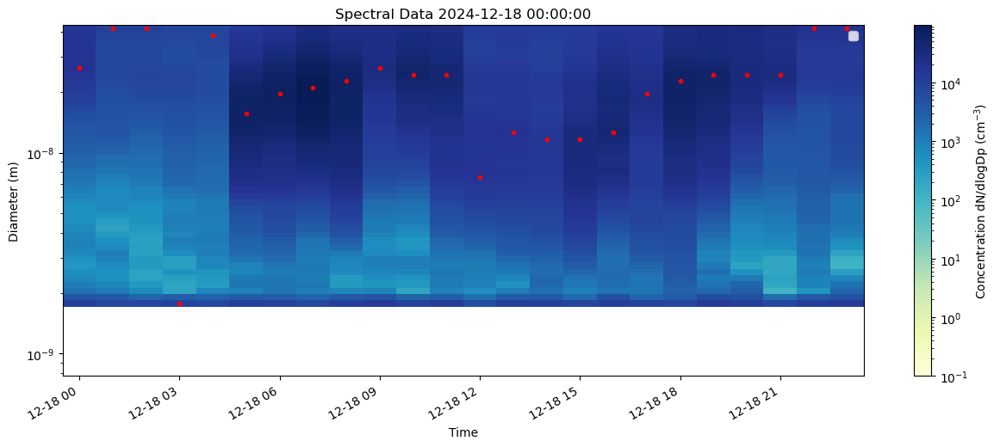

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


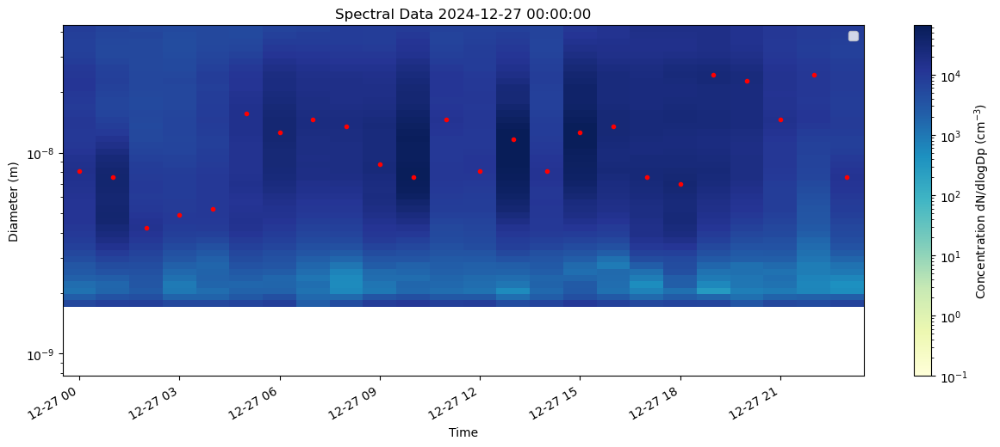

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


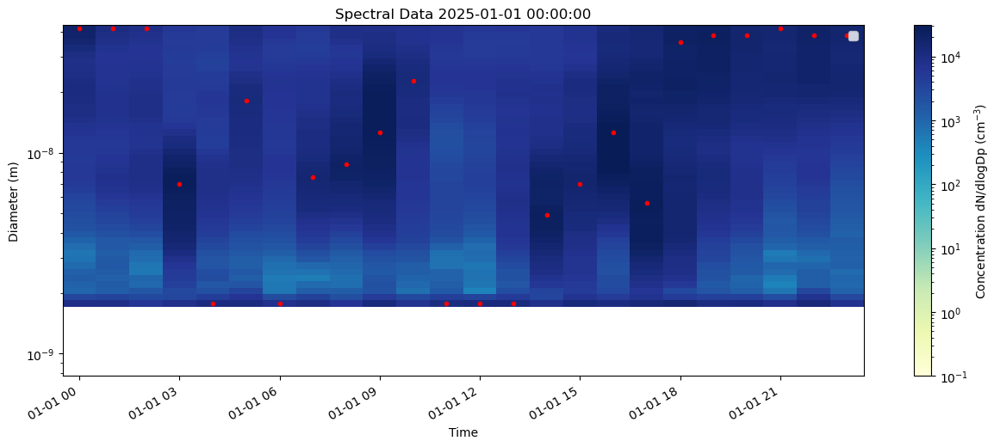

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


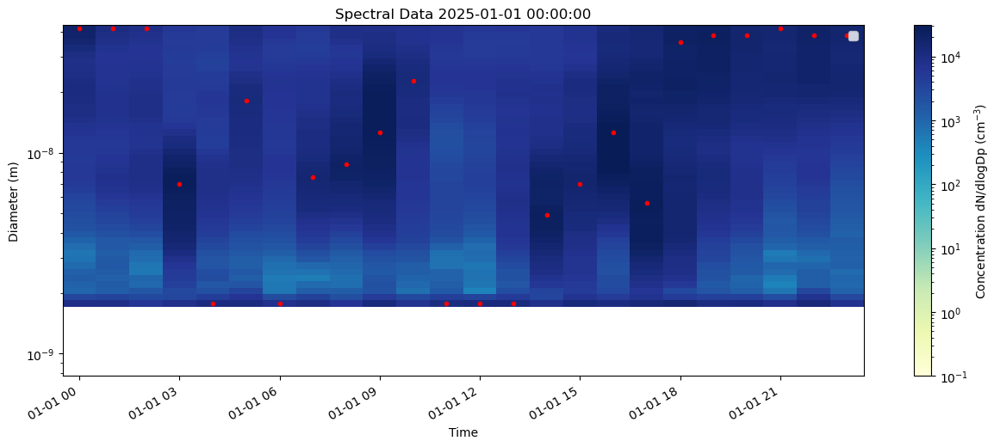

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


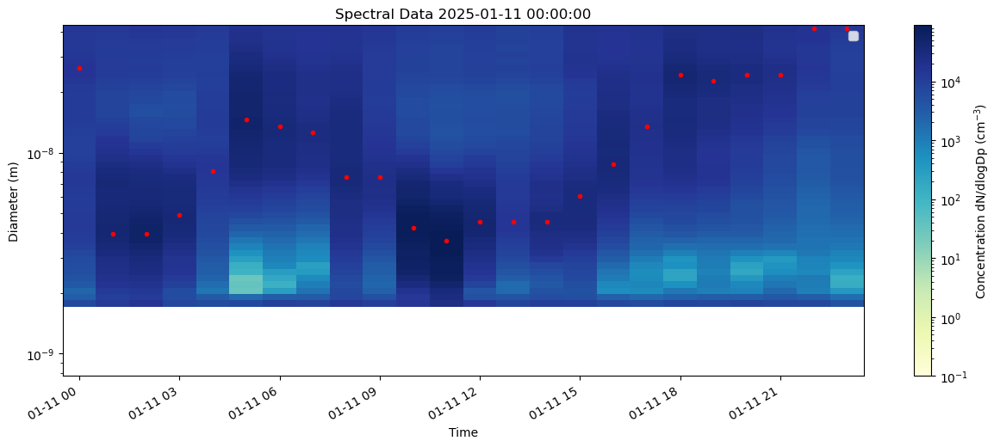

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


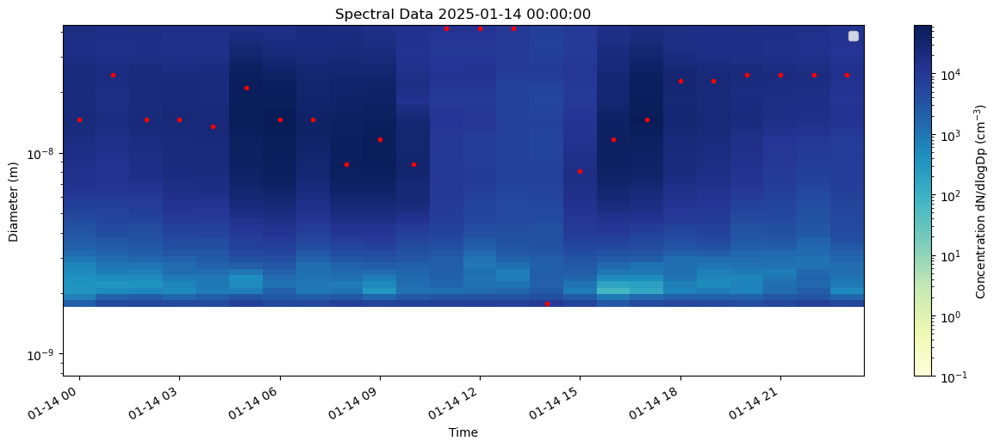

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


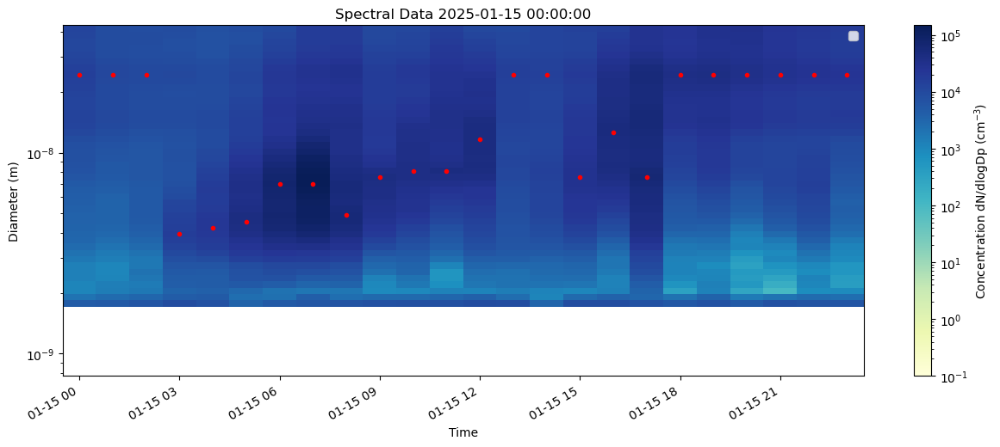

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


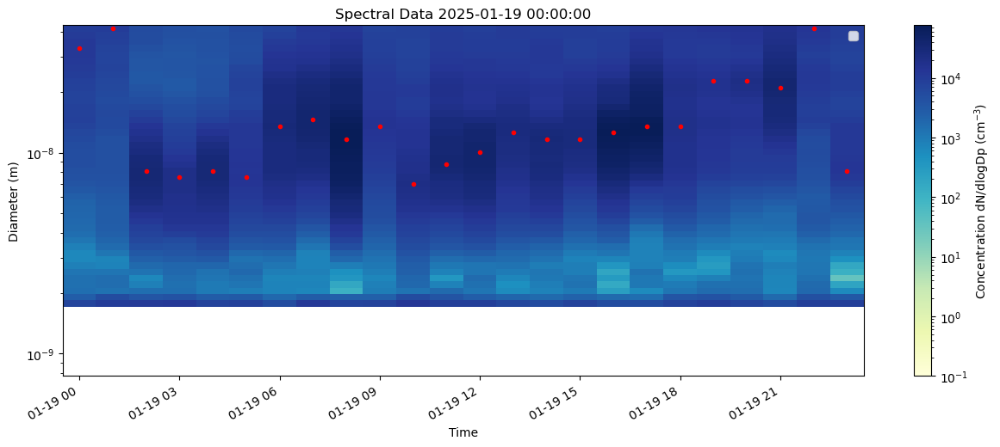

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


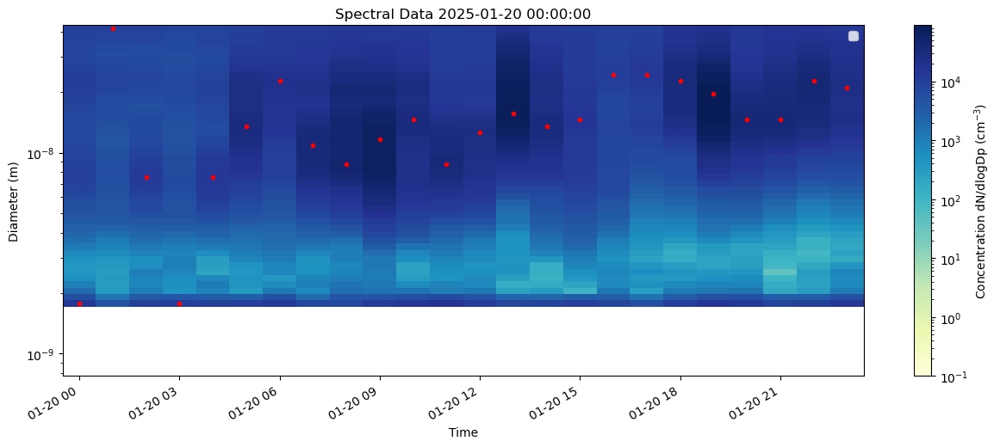

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


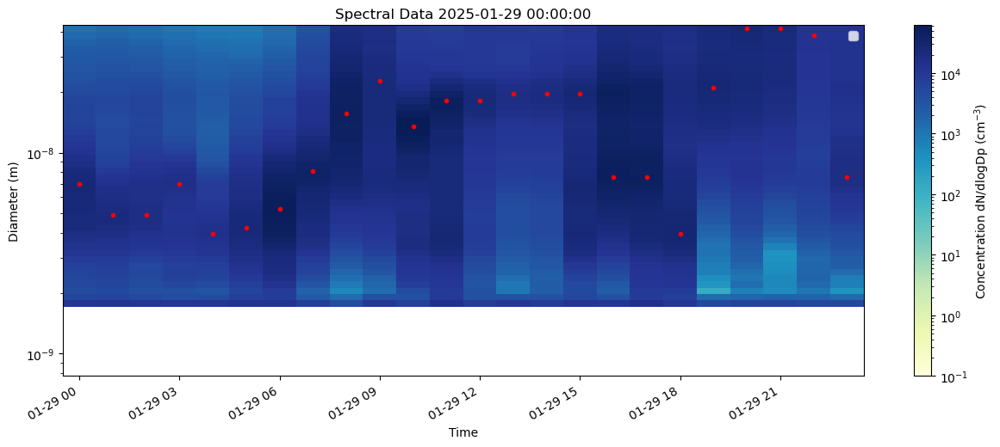

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


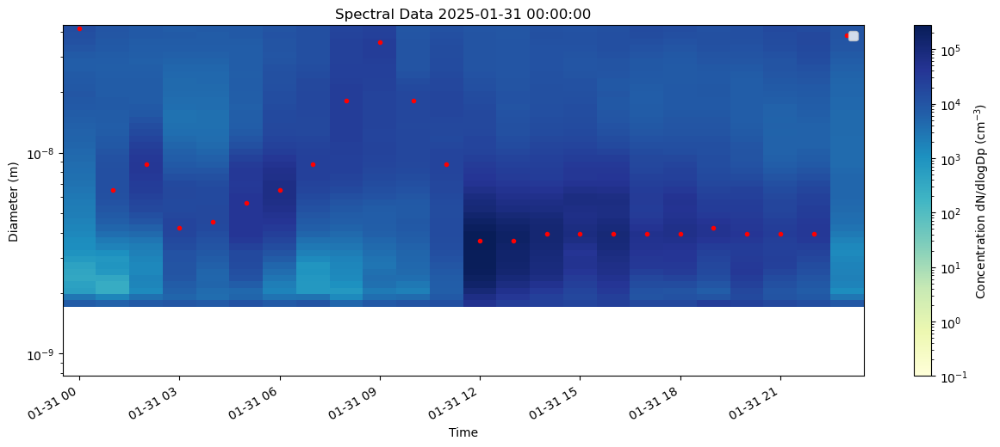

In [53]:
for day in n_increase['day']:
    # Filter the spectral data for the current day
    day_mask = nais_neg_particles.index.normalize() == day
    day_df = nais_neg_particles.loc[day_mask]

    # Also filter the max diameters for the current day
    max_df_day = result.loc[day_mask]

    # Create a figure and axis for the day
    fig, ax = plt.subplots(figsize=(15, 6))
    title = f"Spectral Data {day.normalize()}"
    
    # Plot the contour plot with superimposed max diameters
    plot_spectral_data(day_df, max_df_day, title, ax)
    
    # Improve formatting of the x-axis (date labels)
    fig.autofmt_xdate()
    plt.show()


/tmp/ipykernel_39352/3246364380.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  n_increase['day'] = pd.to_datetime(n_increase['day'])


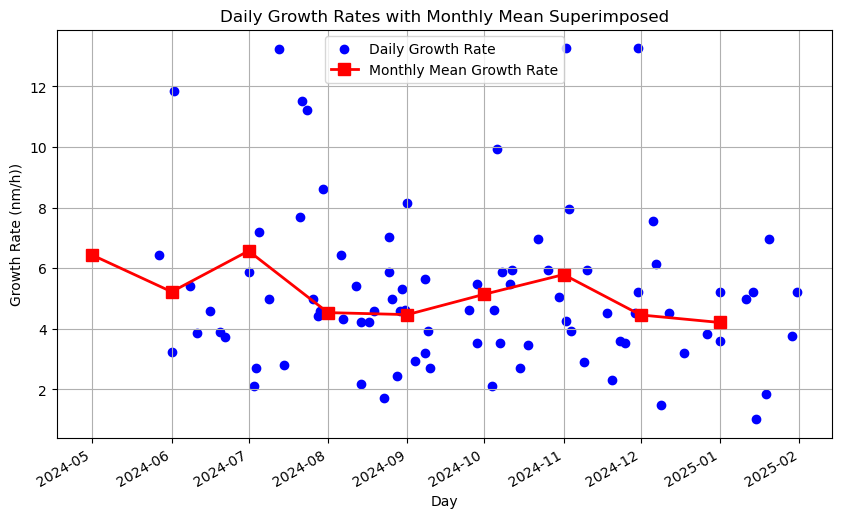

In [54]:
# Ensure the 'day' column is a datetime type (if it's not already)
n_increase['day'] = pd.to_datetime(n_increase['day'])

# Compute monthly means of the growth rate .
# We group by month using the dt.to_period('M') accessor and then convert the period back to a timestamp.
monthly_means = n_increase.groupby(n_increase['day'].dt.to_period('M'))['growth_rate (nm/h)'].mean()
monthly_means.index = monthly_means.index.to_timestamp()

# Create the scatterplot for the daily growth rates.
plt.figure(figsize=(10, 6))
plt.scatter(n_increase['day'], n_increase['growth_rate (nm/h)'], color='blue', marker='o', label='Daily Growth Rate')

# Superimpose the monthly mean values.
plt.plot(monthly_means.index, monthly_means, color='red', marker='s', linestyle='-', 
         linewidth=2, markersize=8, label='Monthly Mean Growth Rate')

# Set plot labels and title
plt.xlabel('Day')
plt.ylabel('Growth Rate (nm/h))')
plt.title('Daily Growth Rates with Monthly Mean Superimposed')

# Format the x-axis for dates
plt.gcf().autofmt_xdate()
plt.grid(True)
plt.legend()

plt.show()


/tmp/ipykernel_39352/3205137580.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  n_increase['day'] = pd.to_datetime(n_increase['day'])
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


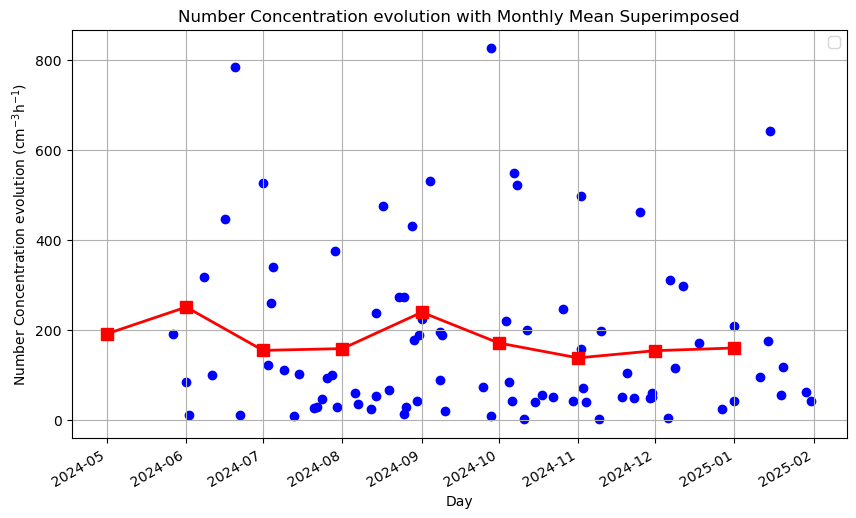

In [55]:
# Ensure the 'day' column is a datetime type (if it's not already)
n_increase['day'] = pd.to_datetime(n_increase['day'])

# Compute monthly means of the growth rate .
# We group by month using the dt.to_period('M') accessor and then convert the period back to a timestamp.
monthly_means = n_increase.groupby(n_increase['day'].dt.to_period('M'))['dN_dt'].mean()
monthly_means.index = monthly_means.index.to_timestamp()

# Create the scatterplot for the daily growth rates.
plt.figure(figsize=(10, 6))
plt.scatter(n_increase['day'], n_increase['dN_dt'], color='blue', marker='o')

# Superimpose the monthly mean values.
plt.plot(monthly_means.index, monthly_means, color='red', marker='s', linestyle='-', 
         linewidth=2, markersize=8)

# Set plot labels and title
plt.xlabel('Day')
plt.ylabel('Number Concentration evolution (cm$^{-3}$h$^{-1}$)')
plt.title('Number Concentration evolution with Monthly Mean Superimposed')

# Format the x-axis for dates
plt.gcf().autofmt_xdate()
plt.grid(True)
plt.legend()

plt.show()
